In [13]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from datetime import datetime
import numpy as np
import statistics
import math
import requests
from sklearn import linear_model

In [14]:
def sp500(): 
    print("Ejecuntando programa ...")
    # S&P500 ---------------------------------------------
    # informacion de yahoo
    GetInformation = yf.Ticker('^GSPC')
    data = GetInformation.history(period="5Y")
    fechas = data.index
    cierres = data['Close']
    Close_ultimo = data['Close'].iloc[-1]
    volumen = data['Volume']
    Open_ultimo = data['Open'].iloc[-1]
    High_ultimo = data['High'].iloc[-1]
    Low_ultimo = data['Low'].iloc[-1]
    Volume_ultimo = data['Volume'].iloc[-1]

    # listas a emplear
    fechas_l = []
    valor_x =[]
    valor_x_menos_media_x = []
    valor_y_menos_media_y =[]
    multiplicacion = []
    cuadrado = []
    y_tend = []

    # generar la lista de fechas
    for w in fechas:
        fechas_l.append(w)

    # generar valores para valor_x
    for f in range(1, len(cierres)):
        valor_x.append(f)

    # calculo de la media
    media_x = statistics.mean(valor_x)
    #print(str(media_x))
    media_y = np.mean(cierres)
    #print(str(media_y))


    # calcular valores para valor_x_menos_media_x
    for x in valor_x:
        valor_x_menos_media_x.append(x - media_x)


    # calcular valores para valor_y_menos_media_y
    for y in cierres:
        valor_y_menos_media_y.append(y - media_y)

    # calcular la multiplicacion de valor_x_menos_media_x por valor_y_menos_media_y
    for xx in range(0, len(valor_x)-1):
        multiplicacion.append(valor_x_menos_media_x[xx] * valor_y_menos_media_y[xx])


    # calcular el cuadrado de valor_x_menos_media_x
    for xxx in range(0, len(valor_x)-1):
        cuadrado.append(valor_x_menos_media_x[xxx] * valor_x_menos_media_x[xxx])


    lista = pd.DataFrame(list(zip(valor_x_menos_media_x, valor_y_menos_media_y, multiplicacion, cuadrado)),columns =['valor_x_menos_media_x', 'valor_y_menos_media_y', 'multiplicacion', 'cuadrado'])

    # calcular la pendiente
    m = sum(lista['multiplicacion']) / sum(lista['cuadrado'])
    # Continuar si la pendiente es positiva ---------------------------------------------

    # calcular b
    b = media_y - (m * media_x)
    #print(str(b))

    # calcular la y en la linea de tendencia
    for x in valor_x:
        y_t = (m * x) + b
        y_tend.append(y_t)

        linea_tendencia = pd.DataFrame(list(zip(fechas_l, y_tend)), columns=['fechas', 'y'])
        
    # Prediccion -------------------------------------------------
    X = data[['Open', 'High', 'Low', 'Volume']]
    y = data['Close']
    
    regr = linear_model.LinearRegression()
    regr.fit(X.values, y)
    predicted_Close_1 = regr.predict([[Open_ultimo, High_ultimo, Low_ultimo, Volume_ultimo]])
    predicted_Close = round(predicted_Close_1[0],2) 
    
     # ubicar la tendencia
    if predicted_Close > Close_ultimo:
        tendencia_esperada = "Alza"
    elif predicted_Close < Close_ultimo:
        tendencia_esperada = "Baja"
    else:
        tendencia_esperada = "Sin cambio"


    # Graficar <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
    fig, ax = plt.subplots()

    # titulo y datos a emplear
    ax.set_title('S&P500' + ', Tend espedada: a la ' + tendencia_esperada, loc='left', y=0.85, x=0.02, fontsize='medium')
    ax.plot(fechas, cierres, label = "cierre")
    ax.plot(linea_tendencia['fechas'], linea_tendencia['y'], linestyle = "--", label = "tend", color = 'red')


    # seleccion de meses a observar
    ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(3,6,9,12)))
    ax.xaxis.set_minor_locator(mdates.MonthLocator())
    ax.grid(True)

    # etiquetas
    ax.set_ylabel('Close')
    ax.set_xlabel('Fecha')

    # distribucion de las fechas
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%b'))
    ax.xaxis.set_minor_locator(mdates.MonthLocator())
    ax.grid(True)
    plt.xticks(rotation=90)

    # segunda escala
    ax2 = ax.twinx()
    ax2.set_ylabel('volume')
    ax2.plot(fechas, volumen, linestyle='dotted', color='tab:green', label = "vol")

    fig.tight_layout()

    # leyendas
    ax.legend(loc='lower right') 
    ax2.legend(loc='lower left') 

    # tamaño y mostrar
    plt.rcParams["figure.figsize"] = [12,5]
    plt.rcParams["figure.autolayout"] = True
    plt.show()


In [15]:
# precio a buscar (cambiar a discrecion) ------------------------------------
max_precio = 10000

In [16]:
# Lista de simbolos
#GBM
l_simb = ['A',	'AAL',	'AAP',	'AAPL',	'ABBV',	'ABT',	'AC*',	'ACCELSAB*',	'ACE',	'ACGL',	'ACN',	'ADBE',	'ADI',	'ADM',	'ADP',	'ADS.DE',	'ADSK', 'AEE',	'AEP',	'AES', 'AFL',	'AGRIEXPA*',	'AGUA*',	'AHMSA*',	'AI',	'AIG',	'AIZ',	'AJG',	'AKAM',	'ALB',	'ALEATIC*',	'ALFAA*',	'ALGN',	'ALK',	'ALL',	'ALLE',	'ALPEKA*',	'ALSEA*', 'AMAT',	'AMCR',	'AMD',	'AME',	'AMGN',	'AMP',	'AMT',	'AMX',	'AMZN',	'ANB*',	'ANET',	'ANSS',	'AON',	'AOS',	'APA',	'APD',	'APH*',	'APTV',	'ARA*',	'ARE',	'ASML',	'ATO',	'AUTLANB*',	'AVB',	'AVGO',	'AVY',	'AWK',	'AXP',	'AXTELCPO*',	'AZO',	'AZTECACPO*',	'BA',	'BAC',	'BALL',	'BASA',	'BAX',	'BAYN.DE',	'BBWI',	'BBY',	'BDX',	'BEI.DE',	'BEN',	'BIDU',	'BIIB',	'BIMBOA*',	'BIO',	'BK',	'BKNG',	'BKR',	'BLK',	'BMRN',	'BMW.DE',	'BMY',	'BN.PA',	'BNP.PA',	'BNR',	'BR',	'BRO',	'BSX',	'BUD',	'BWA',	'BXP',	'C',	'CADUA*',	'CAG',	'CAH',	'CARR',	'CAT',	'CB',	'CBOE',	'CBRE',	'CCI',	'CCL',	'CDNS',	'CDW',	'CE',	'CEG',	'CEMEXCPO*',	'CERAMICB*',	'CF',	'CFG',	'CHD',	'CHDRAUIB*',	'CHKP',	'CHRW',	'CHTR',	'CI',	'CIDMEGA*',	'CINF',	'CL',	'CLX',	'CMA',	'CMCSA',	'CME',	'CMG',	'CMI',	'CMS',	'CNC',	'CNP',	'COF',	'CON',	'COO',	'COP',	'COST',	'CPB',	'CPRT',	'CPT',	'CRL',	'CRM',	'CSCO',	'CSGP',	'CSX',	'CTAS',	'CTLT',	'CTRA',	'CTSH',	'CTVA',	'CUERVO*',	'CULTIBAB*',	'CVS',	'CVX',	'CYDSASAA*',	'CZR',	'D',	'DAL',	'DD',	'DE',	'DFS',	'DG',	'DGX',	'DHI',	'DHR',	'DINEB*',	'DIS',	'DLR',	'DLTR',	'DOV',	'DOW',	'DPZ',	'DRI',	'DTE',	'DTEA',	'DUK',	'DVA',	'DVN',	'DXC',	'DXCM',	'E',	'EA',	'EBAY',	'ECL',	'ED',	'EDOARDOB*',	'EFX',	'EIX',	'EL',	'ELEKTRA*',	'ELV',	'EMN',	'EMR',	'ENPH',	'ENR',	'EOG',	'EPAM',	'EQIX',	'EQR',	'EQT',	'ES',	'ESS',	'ETN',	'ETR',	'ETSY',	'EVRG',	'EW',	'EXC',	'EXPD',	'EXPE',	'EXR',	'F',	'FANG',	'FAST',	'FCX',	'FDS',	'FDX',	'FE',	'KOFUBL*',	'FFIV',	'FINAMEXO*',	'FIS',	'FISV',	'FITB', 'FLUT',	'FMC',	'FOX',	'FOXA',	'FRCB',	'FRES*',	'FRT',	'FSLR',	'FTNT',	'FTV',	'GAVA*', 'GCARSOA1*',	'GCC*',	'GD',	'GE',	'GEHC',	'GEN',	'GENTERA*',	'GFAMSAA*',	'GFINBURO*',	'GFNORTEO*',	'GICSAB*',	'GIGANTE*',	'GILD',	'GIS',	'GL',	'GLW',	'GM',	'GMD*',	'GMEXICOB*',	'GNP*',	'GNRC',	'GOOG',	'GOOGL',	'GPC',	'GPN',	'GPS',	'GRMN',	'GS',	'GTMAY',	'GWW',	'HAL',	'HAS',	'HBAN',	'HCA',	'HCITY*',	'HD',	'HEI',	'HERDEZ*',	'HES',	'HIG',	'HII',	'HLT',	'HOLX',	'HON',	'HPE',	'HPQ',	'HRL',	'HSBC',	'HSIC',	'HST',	'HSY',	'HUM',	'HWM',	'IBM',	'ICA*',	'ICE',	'IDBHF',	'IDXX',	'IEX',	'IFF',	'ILMN',	'INCY',	'INGEALB*',	'INTC',	'INTU',	'INVH',	'IP',	'IPG',	'IQV',	'IR',	'IRM',	'ISP',	'ISRG',	'IT',	'ITW',	'IVZ',	'J',	'JAVER*',	'JBHT',	'JCI',	'JD',	'JEF',	'JKHY',	'JNJ',	'JNPR',	'JPM',	'K',	'KDP',	'KEY',	'KEYS',	'KHC',	'KIM',	'KLAC',	'KMB',	'KMI',	'KMX',	'KO',	'KOF',	'KR',	'KUOB*',	'L',	'LABB*',	'LACOMERUBC*',	'LAMOSA*',	'LASEG*',	'LBTYA',	'LDOS',	'LEN',	'LH',	'LHX',	'LIN',	'LKQ',	'LLY',	'LMT',	'LNC',	'LNT',	'LOW',	'LRCX',	'LULU',	'LUMN',	'LUV',	'LVMUY',	'LVS',	'LW',	'LYB',	'LYV',	'MA',	'MAA',	'MAR',	'MAS',	'MCD',	'MCHP',	'MCK',	'MCO',	'MDLZ',	'MDT',	'MEDICAB*',	'MELI',	'MET',	'META',	'MFRISCOA-1*',	'MGM',	'MHK',	'MINSAB*',	'MKC',	'MKTX',	'MLM',	'MMC',	'MMM',	'MNST',	'MO',	'MOH',	'MOS',	'MPC',	'MPWR',	'MRK',	'MRNA',	'MRO',	'MS',	'MSCI',	'MSFT',	'MSI',	'MTB',	'MTCH',	'MTD',	'MTX',	'MU', 	'NCLH',	'NDAQ',	'NDSN',	'NEE',	'NEM',	'NFLX',	'NI',	'NKE',	'NOC',	'NOK',	'NOW',	'NRG',	'NSC',	'NTAP',	'NTES',	'NTRS',	'NUE',	'NVDA',	'NVR',	'NWL',	'NWS',	'NWSA',	'NXPI',	'O',	'ODFL',	'OGN',	'OKE',	'OMC',	'ON',	'ORCL',	'ORLY',	'ORN',	'OTIS',	'OXY',	'PAH3.DE',	'PARA',	'PAYC',	'PAYX',	'PCAR',	'PCG',	'PE&OLES*',	'PEG',	'PEP',	'PFE',	'PFG',	'PG',	'PGR',	'PH',	'PHM',	'PINFRA*',	'PKG',	'PLANI*',	'PLD',	'PM',	'PNC',	'PNR',	'PNW',	'POCHTECB*',	'POOL',	'POSADASA*',	'PPG',	'PPL',	'PROCORPB*',	'PRU',	'PRX',	'PSA',	'PSX',	'PTC',	'PV*',	'PWR',	'PYPL',	'Q*',	'QBINDUSB*',	'QCOM',	'QGEN',	'QRVO',	'QUMMAB*',	'R',	'RACE',	'RBNW',	'RCENTROA*',	'RCL',	'REG',	'REGN',	'RF',	'RHI',	'RJF',	'RL',	'RLHA*',	'RMD',	'ROK',	'ROL',	'ROP',	'ROST',	'RSG',	'RTX',	'SANN*',	'SAP',	'SAREB*',	'SAVIAA*',	'SBAC',	'SBNY',	'SBUX',	'SCHW',	'SEDG',	'SEE',	'SHW',	'SIMECB*',	'SIRI',	'SIVBQ',	'SJM',	'SKUYF',	'SLB',	'SNA',	'SNPS',	'SNY',	'SO',	'SORIANAB*',	'SPG',	'SPGI',	'SRE',	'STE',	'STLA',	'STLD',	'STT',	'STX',	'STZ',	'SU',	'SWK',	'SWKS',	'SYF',	'SYK',	'SYY',	'T',	'TAP',	'TDG',	'TDY',	'TEAKCPO*',	'TECH',	'TEKCHEMA*',	'TEL',	'TER',	'TFC',	'TFX',	'TGT',	'TJX',	'TLEVISACPO*',	'TMO',	'TMUS',	'TPR',	'TRAXIONA*',	'TRGP',	'TRMB',	'TROW',	'TRV',	'TS',	'TSCO',	'TSLA',	'TSN',	'TT',	'TTWO',	'TXN',	'TXT',	'TYL',	'UAL',	'UDR',	'UHS',	'ULTA',	'UNH',	'UNIFINA*',	'UNP',	'UPS',	'URBI*',	'URI',	'USB',	'V',	'VASCONI*',	'VESTA*',	'VFC',	'VGZ',	'VICI',	'VINTE*',	'VITROA*',	'VLO',	'VMC',	'VOLARA*',	'VOW3.DE',	'VRSK',	'VRSN',	'VRTX',	'VTR',	'VTRS',	'VZ',	'WAB',	'WAT',	'WBA',	'WBD',	'WDAY',	'WDC',	'WEC',	'WELL',	'WFC',	'WHR',	'WM',	'WMB',	'WMT',	'WRB',	'WST',	'WTW',	'WY',	'WYNN',	'XEL',	'XOM',	'XRAY',	'XYL',	'YUM',	'ZBH',	'ZBRA',	'ZION',	'ZTS']

#KUSPIT
#l_simb = ['A', 	'AA1*', 	'AAL', 	'AAP', 	'AAPL', 	'ABBV', 	'ABNB', 	'ABT', 	'AC', 	'ACA', 	'ACHC', 	'ACLS', 	'ACM', 	'ADAP', 	'ADBE', 	'ADC', 	'ADI', 	'ADSK', 	'AEIS', 	'AEP', 	'AERN', 	'AES', 	'AFL', 	'AFRM', 	'AG', 	'AGCO', 	'AGIL', 	'AGIN', 	'AGIO', 	'AGNC', 	'AIG', 	'AIRC', 	'AIV', 	'AJG', 	'AKAM', 	'AKLI', 	'ALB', 	'ALCN', 	'ALFA', 	'ALGN', 	'ALKT', 	'ALNY', 	'ALSEA*', 	'ALT1*', 	'ALTR', 	'AMAT', 	'AMC', 	'AMD', 	'AME', 	'AMED', 	'AMGN', 	'AMH', 	'AMN', 	'AMP', 	'AMRC', 	'AMRS*', 	'AMSC', 	'AMT', 	'AMZN', 	'ANAB', 	'ANET', 	'ANSS', 	'AOS', 	'APA', 	'APDN', 	'APH', 	'APLE', 	'APO', 	'APPS', 	'AR', 	'ARDX', 	'ARE*', 	'ARMK', 	'ARW', 	'ASH', 	'ASIX', 	'ATER', 	'ATI', 	'ATKR', 	'ATOS', 	'ATSG', 	'ATUS', 	'AVB', 	'AVGO', 	'AVO', 	'AVY', 	'AWI', 	'AWK', 	'AWR', 	'AXDX', 	'AXP', 	'AXSM', 	'AYX', 	'AZO', 	'AZPN', 	'AZPN', 	'BA', 	'BAC', 	'BAH', 	'BAX', 	'BBN', 	'BBVA*', 	'BBWI', 	'BBY', 	'BCPC', 	'BCRX', 	'BDX', 	'BE', 	'BEAM', 	'BEN', 	'BERY', 	'BFAM', 	'BFLY', 	'BFS', 	'BHF', 	'BIIB', 	'BILL', 	'BK', 	'BKH', 	'BKNG', 	'BLD', 	'BLDR', 	'BLK', 	'BLNK', 	'BLUE', 	'BMBL', 	'BMRN', 	'BMY', 	'BNGO', 	'BNL', 	'BNS', 	'BRKR', 	'BRO', 	'BRX', 	'BSX', 	'BSY', 	'BTGN', 	'BURL', 	'BWA', 	'BWXT', 	'BX', 	'BXMT', 	'BXP', 	'BY', 	'BYND', 	'C*', 	'CACI', 	'CAEN', 	'CAH', 	'CAKE', 	'CAN', 	'CANN', 	'CAR', 	'CARR', 	'CASY', 	'CAT', 	'CB', 	'CBOE', 	'CBRE', 	'CC', 	'CCI', 	'CCK', 	'CDAY', 	'CDE', 	'CDNS', 	'CDW', 	'CE', 	'CEG', 	'CERT', 	'CEVA', 	'CF', 	'CFG', 	'CFLT', 	'CG', 	'CGNX', 	'CHD', 	'CHE', 	'CHGG', 	'CHPT', 	'CHRD', 	'CHS', 	'CHTR', 	'CHWY', 	'CI', 	'CIDMEGA*', 	'CIEN', 	'CL', 	'CLF', 	'CLSK', 	'CLX', 	'CMCSA', 	'CME', 	'CMG', 	'CMI', 	'CMOCTEZ*', 	'CMPRF', 	'CMS', 	'CNC', 	'CNK', 	'CNMD', 	'COF', 	'COHN', 	'COIN', 	'COLD', 	'COLLADO*', 	'COLM', 	'CONN', 	'COO', 	'COP', 	'COST', 	'COVCF', 	'COXA*', 	'CPB', 	'CPRT', 	'CPT', 	'CREAL*', 	'CRI', 	'CRL', 	'CRM', 	'CRNC', 	'CROX', 	'CRSR', 	'CRUS', 	'CRWD', 	'CSCO', 	'CSGP', 	'CSX', 	'CTAS', 	'CTLT', 	'CTRA', 	'CTSH', 	'CTVA', 	'CUBE', 	'CUERVO*', 	'CUK', 	'CUZ', 	'CVNA', 	'CVS', 	'CVX', 	'CWEN', 	'CXM', 	'CZR', 	'D', 	'DAL', 	'DAR', 	'DASH', 	'DBRG', 	'DBX', 	'DCI', 	'DD', 	'DDD', 	'DDOG', 	'DE', 	'DECN', 	'DEI', 	'DFS', 	'DGEN', 	'DGG', 	'DGX', 	'DHI', 	'DHR', 	'DINO', 	'DIS', 	'DISH', 	'DKNG', 	'DKNG', 	'DLR', 	'DLTR', 	'DM', 	'DMTK', 	'DNA', 	'DNMR', 	'DNOW', 	'DNUT', 	'DOCU', 	'DPH', 	'DPZ', 	'DQN', 	'DSGN', 	'DUOL', 	'DVA', 	'DVLP', 	'DVN', 	'DXC', 	'DXCM', 	'EA', 	'EAF', 	'EBAY', 	'EBON', 	'ECL', 	'EDR', 	'EEFT', 	'EFX', 	'EGP', 	'EHC', 	'EIX', 	'EL', 	'ELAN', 	'ELEKTRA*', 	'ELIN', 	'ELS', 	'EMBC', 	'EMN', 	'EMR', 	'ENPH', 	'ENTG', 	'EOG', 	'EPAM', 	'EPC', 	'EQIX', 	'EQR', 	'EQT', 	'ES', 	'ESS', 	'ETSY', 	'EVBG', 	'EVER', 	'EVR', 	'EW', 	'EXAS', 	'EXC', 	'EXP', 	'EXPD', 	'EXPE', 	'EXPI', 	'EXPO', 	'F', 	'FANG', 	'FAST', 	'FCCN', 	'FCEL', 	'FCFS', 	'FCX', 	'FDS', 	'FDX', 	'FE', 	'FERN', 	'FFIV', 	'FGEN', 	'FICO', 	'FIR', 	'FIS', 	'FIVN', 	'FIZZ', 	'FL', 	'FLGT', 	'FLO', 	'FLR', 	'FLS', 	'FLT', 	'FLWS', 	'FND', 	'FNF', 	'FOUR', 	'FRES', 	'FRTN', 	'FSLR', 	'FSLY', 	'FTFT', 	'FTNT', 	'FTRE', 	'FTV', 	'FUBO', 	'FWONK', 	'GAIA', 	'GBX', 	'GCC', 	'GD', 	'GDDY', 	'GE', 	'GEHC', 	'GEO', 	'GEVO', 	'GFIN', 	'GH', 	'GIGANTE*', 	'GILD', 	'GIS', 	'GLPI', 	'GLW', 	'GM', 	'GMAB', 	'GMD', 	'GME', 	'GMED', 	'GMXT*', 	'GNRC', 	'GNW', 	'GOOG', 	'GOOGL', 	'GPC', 	'GPH', 	'GPN', 	'GPRO', 	'GPROFUT*', 	'GPS', 	'GREN', 	'GRMN', 	'GRWG', 	'GS', 	'GT', 	'GTX', 	'GWRE', 	'GWW', 	'GXO', 	'HAL', 	'HALO', 	'HAS', 	'HASI', 	'HBAN', 	'HCA', 	'HCC', 	'HCITY*', 	'HCP', 	'HD', 	'HERDEZ*', 	'HES', 	'HGV', 	'HHC*', 	'HIG', 	'HIW', 	'HL', 	'HLI', 	'HLT', 	'HOG', 	'HOLX', 	'HOMEX*', 	'HON', 	'HOOD', 	'HOTEL*', 	'HPE', 	'HPQ', 	'HR', 	'HRI', 	'HRL', 	'HSIC', 	'HST', 	'HSY', 	'HTZ', 	'HUBB', 	'HUBS', 	'HUM', 	'HWM', 	'IAC', 	'IBKR', 	'IBM', 	'IBOC', 	'ICE', 	'IDA', 	'IDXX', 	'IEX', 	'IEX', 	'IHG', 	'ILMN', 	'IMGN', 	'INCY', 	'INFN', 	'INFN', 	'INGN', 	'INGR', 	'INO', 	'INSM', 	'INTC', 	'INTU', 	'INVH', 	'IONS', 	'IP', 	'IPGP', 	'IPN', 	'IQV', 	'IR', 	'IRM', 	'ISRG', 	'ITCI', 	'ITRI', 	'ITW', 	'J', 	'JAVER*', 	'JBL', 	'JBLU', 	'JEF', 	'JKHY', 	'JLL', 	'JNJ', 	'JNPR', 	'JPM', 	'JWN', 	'JXN', 	'K', 	'KBH', 	'KBR', 	'KD', 	'KERN', 	'KEYS', 	'KFY', 	'KHC', 	'KIM', 	'KKRC*', 	'KLAC', 	'KMB', 	'KMI', 	'KMT', 	'KMX', 	'KO', 	'KOD', 	'KOS', 	'KR', 	'KRC', 	'KRTX', 	'KSPN', 	'KSS', 	'L', 	'LAMOSA*', 	'LAMR', 	'LAUR', 	'LAZR', 	'LCID', 	'LCII', 	'LDOS', 	'LEA', 	'LECO', 	'LEG', 	'LEGN', 	'LEN', 	'LENB*', 	'LEVI', 	'LGIH', 	'LH', 	'LHX', 	'LII', 	'LIN', 	'LITE', 	'LKQ', 	'LLY', 	'LMND', 	'LMT', 	'LNG', 	'LOGN', 	'LOW', 	'LPLA', 	'LPSN', 	'LRE', 	'LRN', 	'LRN', 	'LSTR', 	'LSXMA', 	'LULU', 	'LUMN', 	'LUV', 	'LVS', 	'LW', 	'LYFT', 	'LYTS', 	'LYV', 	'M', 	'MA', 	'MAA', 	'MAC', 	'MANH', 	'MAR', 	'MARA', 	'MAS', 	'MASI', 	'MAT', 	'MCD', 	'MCHP', 	'MCK', 	'MCN', 	'MCO', 	'MD', 	'MDB', 	'MDLZ', 	'MDU', 	'ME', 	'MED', 	'MEDP', 	'MET', 	'META', 	'MGM', 	'MGNI', 	'MGRC', 	'MHK', 	'MIRM', 	'MKC', 	'MKCV*', 	'MKL', 	'MKSI', 	'MKTW', 	'MKTX', 	'MLM', 	'MLN', 	'MMC', 	'MMM', 	'MMS', 	'MO', 	'MODV', 	'MORN', 	'MOS', 	'MP', 	'MPC', 	'MPW', 	'MPWR', 	'MQ', 	'MRK', 	'MRNA', 	'MRNS', 	'MRO', 	'MRVI', 	'MRVL', 	'MS', 	'MSA', 	'MSCI', 	'MSFT', 	'MSGE', 	'MSGE', 	'MSI', 	'MSTR', 	'MTCH1*', 	'MTD', 	'MTDR', 	'MTG', 	'MTN', 	'MTN', 	'MTTR', 	'MU', 	'MUR', 	'MUX', 	'NAN', 	'NBSE', 	'NCNO', 	'NDAQ', 	'NDSN', 	'NEE', 	'NEM', 	'NEO', 	'NEOG', 	'NET', 	'NFG', 	'NFLX', 	'NGVT', 	'NKE', 	'NKLA', 	'NKTR', 	'NNN', 	'NOV', 	'NOWW*', 	'NRG', 	'NSA', 	'NSC', 	'NSTG', 	'NTAP', 	'NTRS', 	'NTST', 	'NUE', 	'NVAX', 	'NVDA', 	'NVST', 	'NVTA', 	'NWGN', 	'NWL', 	'O', 	'OCGN', 	'ODFL', 	'ODP', 	'OGE', 	'OGN', 	'OGS', 	'OHI', 	'OI', 	'OKE', 	'OKTA', 	'OLED', 	'OMAB', 	'OMCL', 	'OMF', 	'ON', 	'ONL', 	'OPCH', 	'OPEN', 	'OPIUSA*', 	'OPK', 	'ORBIA*', 	'ORCL', 	'ORI', 	'ORLY', 	'OSK', 	'OTIS', 	'OVV', 	'OZK', 	'PANW', 	'PAR', 	'PARA', 	'PATH', 	'PATK', 	'PAY', 	'PAYC', 	'PAYX', 	'PBF', 	'PCG', 	'PCOR', 	'PCT', 	'PCTY', 	'PE&OLES*', 	'PEAK', 	'PEG', 	'PENN', 	'PENN', 	'PEP', 	'PFE', 	'PFG', 	'PG', 	'PGR', 	'PH', 	'PHM', 	'PII', 	'PINFRA*', 	'PINS', 	'PK', 	'PLD', 	'PLNT', 	'PLTR', 	'PLUG', 	'PLXS', 	'PM', 	'PNC', 	'PNW', 	'PODD', 	'POOL', 	'POR', 	'POST', 	'PPG', 	'PPLN', 	'PR', 	'PRMN', 	'PRS', 	'PRU', 	'PSTG', 	'PSX', 	'PTON', 	'PV*', 	'PVH', 	'PWR', 	'PYPL', 	'Q*', 	'QCOM', 	'QDEL', 	'QDEL', 	'QIAN', 	'QLYS', 	'QRTEA', 	'QS', 	'RBLX', 	'RBT', 	'RCL', 	'REG1*', 	'REGN', 	'REXR', 	'REZI', 	'RF', 	'RGLD', 	'RHI', 	'RHN', 	'RIN', 	'RIOT', 	'RITM', 	'RIVN', 	'RKT', 	'RLN', 	'RMBS', 	'RMD', 	'ROK', 	'ROKU', 	'ROST', 	'RPD', 	'RPM', 	'RRCO*', 	'RRX', 	'RS', 	'RTON', 	'RTX', 	'RVLV', 	'RXO', 	'RYAAY', 	'RYN', 	'RYN', 	'SACH', 	'SAM', 	'SAN', 	'SAVA', 	'SAVE', 	'SBRA', 	'SBUX', 	'SCCO', 	'SCHW', 	'SCI', 	'SDC*', 	'SEDG', 	'SEE', 	'SEIC', 	'SEN', 	'SGEN', 	'SHAK', 	'SHO', 	'SHW', 	'SIEN', 	'SIRI', 	'SJM', 	'SKLZ', 	'SKX', 	'SLG', 	'SLM', 	'SLVM', 	'SMAR', 	'SMCI', 	'SMHI', 	'SMTC', 	'SNAP', 	'SNOW', 	'SO', 	'SOFI', 	'SON', 	'SPB', 	'SPCE', 	'SPG', 	'SPGI', 	'SPLK', 	'SPT', 	'SPXN', 	'SQ', 	'SRC', 	'STAG', 	'STG', 	'STLD', 	'STN', 	'STT', 	'STZ', 	'SUM', 	'SUN', 	'SWAV', 	'SWK', 	'SWKS', 	'SWN', 	'SXT', 	'T', 	'TDG', 	'TDOC', 	'TDW', 	'TDY', 	'TEAM', 	'TECH', 	'TELL', 	'TENB', 	'TER', 	'TFC', 	'TFX', 	'TGAN', 	'TGS', 	'TGT', 	'THC', 	'THO', 	'THS', 	'TJX', 	'TKR', 	'TLK', 	'TMEN', 	'TMHC', 	'TMN', 	'TMO', 	'TMUS', 	'TNDM', 	'TNL', 	'TOL', 	'TOST', 	'TPH', 	'TPIC', 	'TPR', 	'TPX', 	'TREX1*', 	'TRGP', 	'TRIN', 	'TRIP', 	'TRN', 	'TRNO', 	'TROW', 	'TRV', 	'TS', 	'TSCO', 	'TSLA', 	'TSVT', 	'TTD', 	'TTWO', 	'TWLO', 	'TWN', 	'TXG', 	'TXN', 	'TXT', 	'TYL', 	'U', 	'UAA', 	'UAL', 	'UBER', 	'UDMY', 	'UDR', 	'UHAL', 	'UHS', 	'ULN', 	'ULTA', 	'UNH', 	'UNP', 	'UPS', 	'UPST', 	'UPWK', 	'URBI*', 	'URBN', 	'URI', 	'USB', 	'USFD', 	'UTGN', 	'UTSI', 	'UUN', 	'V', 	'VAC', 	'VASCONI*', 	'VESTA*', 	'VFC', 	'VGZ', 	'VIAV', 	'VICI', 	'VINTE*', 	'VIR', 	'VIRT', 	'VLO', 	'VMC', 	'VMEO', 	'VMW*', 	'VNO', 	'VNT', 	'VRM', 	'VRSK', 	'VRSN', 	'VRTX', 	'VSCO', 	'VST', 	'VTNR', 	'VTR', 	'VTRS', 	'VTS', 	'VXRT', 	'VYGR', 	'VZ', 	'W', 	'WAB', 	'WAL', 	'WALMEX*', 	'WAT', 	'WB', 	'WBA', 	'WBD', 	'WCC', 	'WCHN', 	'WDAY', 	'WDC', 	'WE*', 	'WELL', 	'WFC', 	'WHR', 	'WISH', 	'WKHS', 	'WM', 	'WMB', 	'WMT', 	'WNS', 	'WOLF', 	'WOOF', 	'WOR', 	'WPC', 	'WRB', 	'WSC', 	'WST', 	'WTRG', 	'WTS', 	'WU', 	'WY', 	'WYNN', 	'X', 	'XOM', 	'XPN', 	'XPO', 	'XRAY', 	'XRX', 	'XYL', 	'YETI', 	'YEXT', 	'YUM', 	'Z', 	'ZG', 	'ZIMV', 	'ZM', 	'ZS', 	'ZTO', 	'ZTS']

In [17]:
# Tipo de cambio USD a MXN
url = 'https://api.exchangerate-api.com/v4/latest/MXN'
data = requests.get(url).json()
currencies = data['rates']
cambio = round(1 / currencies['USD'], 4)

In [18]:
def datos_yahoo():
    print("Graficando datos filtrados ...")
    
    # Listas a emplear para el Dataframe
    L_simbolos = []
    L_Cierre_anterior = []
    L_Cierre_predicho = []
    L_Beta = []
    L_Ganancia_predicha = []
    L_porc_Ganancia_predicha =[]
    L_pais =[]

    
# Elegir simbolos -------------------------------------------------
    for simbolo_i in l_simb:
        if simbolo_i[len(simbolo_i)-1] == "*":
            simbolo = simbolo_i[0:len(simbolo_i)-1] + ".MX"
        else:
            simbolo = simbolo_i

        # informacion de yahoo -----------------------------------
        try:
            GetInformation = yf.Ticker(simbolo)
            data = GetInformation.history(period="max")
            fechas = data.index

            try:
                moneda = GetInformation.info['currency']
                pais = GetInformation.info['country']
                sector = GetInformation.info['sector']
                industria = GetInformation.info['industry']
                beta = round(GetInformation.info['beta'],2)
                resumen = GetInformation.info['longBusinessSummary']
            except:
                moneda = ''
                pais = ''
                sector = ''
                industria = ''
                beta = ''
                resumen = ''

            if moneda != 'MXN':
                cierres = round(data['Close'] * cambio,2)
                Close_ultimo = round(data['Close'].iloc[-1] * cambio,2)
                cierre_penultimo = round(data['Close'].iloc[-2] * cambio,2)
                Open_ultimo = round(data['Open'].iloc[-1] * cambio,2)
                High_ultimo = round(data['High'].iloc[-1] * cambio,2)
                Low_ultimo = round(data['Low'].iloc[-1] * cambio,2)
            else:
                cierres = round(data['Close'],2)
                Close_ultimo = round(data['Close'].iloc[-1],2)
                cierre_penultimo = round(data['Close'].iloc[-2],2)
                Open_ultimo = round(data['Open'].iloc[-1],2)
                High_ultimo = round(data['High'].iloc[-1],2)
                Low_ultimo = round(data['Low'].iloc[-1],2)

            volumen = round(data['Volume'],2)
            Volume_ultimo = round(data['Volume'].iloc[-1],2)


            # Elegir cierre ultimo menor a maximo precio -----------
            if Close_ultimo < max_precio:
                # precio ultimo no ha incrementado del precio antepenultimo -----------
                if Close_ultimo < cierre_penultimo:
                    # listas a emplear para linea de tendencia -------------
                    fechas_l = []
                    valor_x =[]
                    valor_x_menos_media_x = []
                    valor_y_menos_media_y =[]
                    multiplicacion = []
                    cuadrado = []
                    y_tend = []

                    # generar la lista de fechas
                    for w in fechas:
                        fechas_l.append(w)

                    # generar valores para valor_x
                    for f in range(1, len(cierres)):
                        valor_x.append(f)

                    # calculo de la media
                    media_x = statistics.mean(valor_x)
                    #print(str(media_x))
                    media_y = np.mean(cierres)
                    #print(str(media_y))


                    # calcular valores para valor_x_menos_media_x
                    for x in valor_x:
                        valor_x_menos_media_x.append(x - media_x)


                    # calcular valores para valor_y_menos_media_y
                    for y in cierres:
                        valor_y_menos_media_y.append(y - media_y)

                    # calcular la multiplicacion de valor_x_menos_media_x por valor_y_menos_media_y
                    for xx in range(0, len(valor_x)-1):
                        multiplicacion.append(valor_x_menos_media_x[xx] * valor_y_menos_media_y[xx])


                    # calcular el cuadrado de valor_x_menos_media_x
                    for xxx in range(0, len(valor_x)-1):
                        cuadrado.append(valor_x_menos_media_x[xxx] * valor_x_menos_media_x[xxx])


                    lista = pd.DataFrame(list(zip(valor_x_menos_media_x, valor_y_menos_media_y, multiplicacion, cuadrado)),columns =['valor_x_menos_media_x', 'valor_y_menos_media_y', 'multiplicacion', 'cuadrado'])

                    # calcular la pendiente
                    m = sum(lista['multiplicacion']) / sum(lista['cuadrado'])
                    # Continuar si la pendiente es positiva ---------------------------------------------
                    if m > 0:
                        # calcular b
                        b = media_y - (m * media_x)
                        #print(str(b))

                        # calcular la y en la linea de tendencia
                        for x in valor_x:
                            y_t = (m * x) + b
                            y_tend.append(y_t)

                        linea_tendencia = pd.DataFrame(list(zip(fechas_l, y_tend)), columns=['fechas', 'y'])

                        # Prediccion -------------------------------------------------
                        X = data[['Open', 'High', 'Low', 'Volume']]
                        y = data['Close']

                        regr = linear_model.LinearRegression()
                        regr.fit(X.values, y)
                        predicted_Close_1 = regr.predict([[Open_ultimo, High_ultimo, Low_ultimo, Volume_ultimo]])
                        predicted_Close = round(predicted_Close_1[0],2) 

                         # continuar si la tendencia va a la alza ----------------------------------------
                        #if predicted_Close > cierre_ultimo:
                        if predicted_Close > Close_ultimo:
                            tendencia_esperada = "Alza"
                        elif predicted_Close < Close_ultimo:
                            tendencia_esperada = "Baja"
                        else:
                            tendencia_esperada = "Sin cambio"

                        if tendencia_esperada == "Alza":
                            # Graficar <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
                            fig, ax = plt.subplots()

                            # titulo y datos a emplear
                            ax.set_title('Cierre de ' + simbolo, loc='left', y=0.85, x=0.02, fontsize='medium')
                            ax.plot(fechas, cierres)
                            ax.plot(linea_tendencia['fechas'], linea_tendencia['y'], linestyle = "--")


                            # seleccion de meses a observar
                            ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(3,6,9,12)))
                            ax.xaxis.set_minor_locator(mdates.MonthLocator())
                            ax.grid(True)

                            # etiquetas
                            ax.set_ylabel('Close')
                            ax.set_xlabel('Fecha')

                            # distribucion de las fechas
                            ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%b'))
                            ax.xaxis.set_minor_locator(mdates.MonthLocator())
                            ax.grid(True)
                            plt.xticks(rotation=90)

                            # segunda escala
                            ax2 = ax.twinx()
                            ax2.set_ylabel('volume')
                            ax2.plot(fechas, volumen, linestyle='dotted', color='tab:green')
                            fig.tight_layout()

                            # nota al pie
                            #ax.annotate('Cierre anterior:' + str(Close_ultimo) + ", Cierre predicho: " + str(predicted_Close) + "Tend esperada: " + tendencia_esperada, xy = (1.0, -0.2), xycoords='axes fraction', ha='left', va="center", fontsize=10)
                            #ax.annotate('Pais:' + pais, xy = (1.0, -0.2), xycoords='axes fraction', ha='left', va="center", fontsize=10)
                            #ax.annotate('Sector:' + sector, xy = (1.0, -0.8), xycoords='axes fraction', ha='left', va="center", fontsize=10)
                            #ax.annotate('Industria:' + industria, xy = (1.0, -1.4), xycoords='axes fraction', ha='left', va="center", fontsize=10)
                            #ax.annotate('Beta:' + str(beta), xy = (1.0, -2.0), xycoords='axes fraction', ha='left', va="center", fontsize=10)
                            #ax.annotate('Resumen:' + resumen, xy = (1.0, -2.6), xycoords='axes fraction', ha='left', va="center", fontsize=10)

                            # tamaño y mostrar
                            plt.rcParams["figure.figsize"] = [12,5]
                            plt.rcParams["figure.autolayout"] = True
                            plt.show()

                            print(simbolo + '; Cierre anterior: ' + str(Close_ultimo) + "; Cierre predicho: " + str(predicted_Close) + "; Tend esperada: " + tendencia_esperada + '; Beta: ' + str(beta) )
                            #print(simbolo + '; Cierre anterior: ' + str(Close_ultimo) + "; Cierre predicho: " + str(predicted_Close) + '; Beta: ' + str(beta) )
                            print("")
                            print('Pais:' + pais + "; Sector: " + sector + "; Industria: " + industria)
                            print("")
                            print('Resumen: ' + resumen)
                            print("")
                            
                            # Generar listas para Dataframe
                            L_simbolos.append(simbolo)
                            L_Cierre_anterior.append(Close_ultimo)
                            L_Cierre_predicho.append(predicted_Close)
                            L_Beta.append(beta)
                            L_Ganancia_predicha.append(predicted_Close - Close_ultimo)
                            L_porc_Ganancia_predicha.append((predicted_Close - Close_ultimo)/predicted_Close)
                            L_pais.append(pais)
                            
                            
        except:
            pass
        
    # Generar DataFrame
    datos = {"simb":L_simbolos,  "Cierre_ant":L_Cierre_anterior, "Cierre_pred":L_Cierre_predicho, "beta":L_Beta, "Gan_pred":L_Ganancia_predicha, "porc_Gan_pred":L_porc_Ganancia_predicha, "pais":L_pais}
    df = pd.DataFrame(datos)
    df.to_excel(r'C:\Users\Omar Escamilla\Documents\Acciones\V4\resultados.xlsx', index=False)
    print(df)

            
    print("Programa terminado")

Ejecuntando programa ...


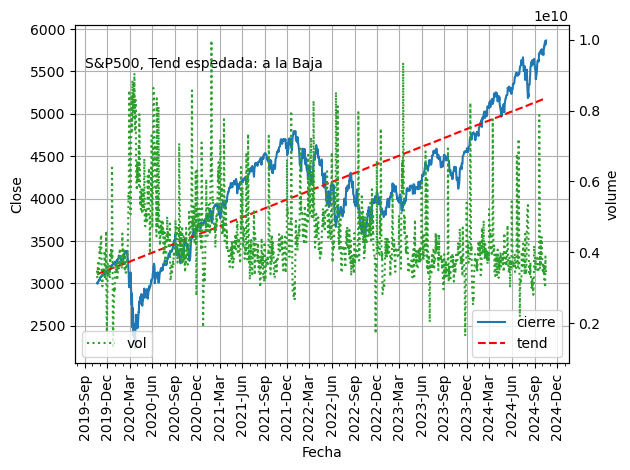

Graficando datos filtrados ...


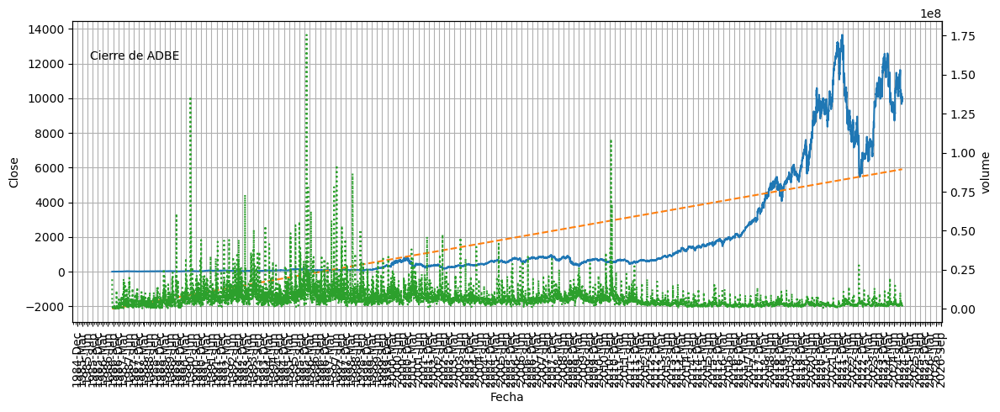

ADBE; Cierre anterior: 9819.46; Cierre predicho: 9873.37; Tend esperada: Alza; Beta: 1.29

Pais:United States; Sector: Technology; Industria: Software - Infrastructure

Resumen: Adobe Inc., together with its subsidiaries, operates as a diversified software company worldwide. It operates through three segments: Digital Media, Digital Experience, and Publishing and Advertising. The Digital Media segment offers products, services, and solutions that enable individuals, teams, and enterprises to create, publish, and promote content; and Document Cloud, a unified cloud-based document services platform. Its flagship product is Creative Cloud, a subscription service that allows members to access its creative products. This segment serves content creators, students, workers, marketers, educators, enthusiasts, and communicators. The Digital Experience segment provides an integrated platform and set of applications and services that enable brands and businesses to create, manage, execute, measur

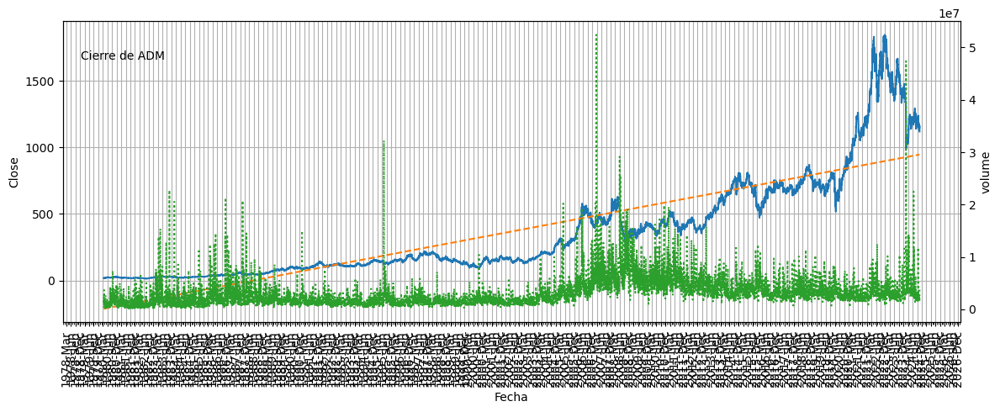

ADM; Cierre anterior: 1119.05; Cierre predicho: 1128.86; Tend esperada: Alza; Beta: 0.71

Pais:United States; Sector: Consumer Defensive; Industria: Farm Products

Resumen: Archer-Daniels-Midland Company engages in the procurement, transportation, storage, processing, and merchandising of agricultural commodities, ingredients, flavors, and solutions in the United States, Switzerland, the Cayman Islands, Brazil, Mexico, Canada, the United Kingdom, and internationally. It operates in three segments: Ag Services and Oilseeds, Carbohydrate Solutions, and Nutrition. The company originates, merchandises, stores, and transports agricultural raw materials, such as oilseeds and soft seeds. It also engages in the agricultural commodity and feed product import, export, and distribution; and various structured trade finance activities. In addition, the company offers soybean meal and oil; vegetable and salad oils and protein meals; ingredients for the food, feed, energy, and industrial customers; 

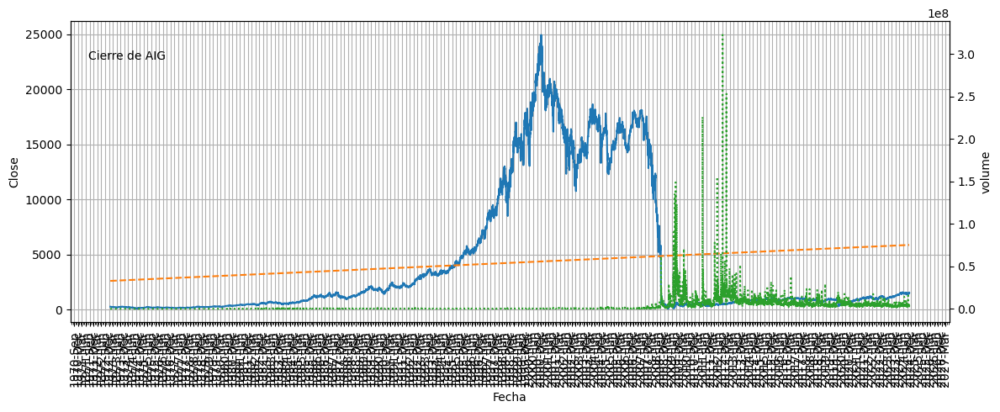

AIG; Cierre anterior: 1558.53; Cierre predicho: 1566.73; Tend esperada: Alza; Beta: 1.07

Pais:United States; Sector: Financial Services; Industria: Insurance - Diversified

Resumen: American International Group, Inc. offers insurance products for commercial, institutional, and individual customers in North America and internationally. It operates through three segments: General Insurance, Life and Retirement, and Other Operations. The General Insurance segment provides commercial and industrial property insurance, including business interruption and package insurance that cover exposure to made and natural disasters; general liability, environmental, commercial automobile liability, workers' compensation, excess casualty, and crisis management insurance products; and professional liability insurance. This segment offers marine, energy-related property insurance, aviation, political risk, trade credit, trade finance, and portfolio solutions, as well as operates reinsurance business; vo

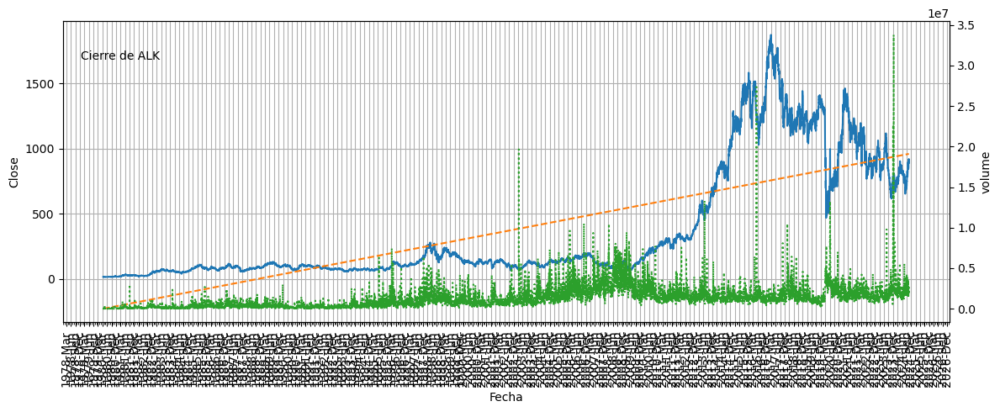

ALK; Cierre anterior: 891.67; Cierre predicho: 896.25; Tend esperada: Alza; Beta: 1.61

Pais:United States; Sector: Industrials; Industria: Airlines

Resumen: Alaska Air Group, Inc., through its subsidiaries, operates airlines. It operates through three segments: Mainline, Regional, and Horizon. The company offers scheduled air transportation services on Boeing jet aircraft for passengers and cargo in the United States, and in parts of Canada, Mexico, Costa Rica, Belize, Guatemala, and the Bahamas; and for passengers across a shorter distance network within the United States, Canada, and Mexico. Alaska Air Group, Inc. was founded in 1932 and is based in Seattle, Washington.



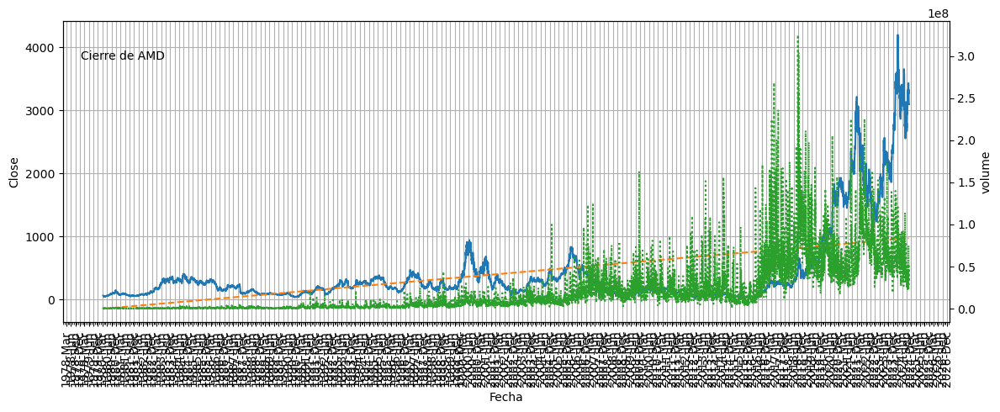

AMD; Cierre anterior: 3094.65; Cierre predicho: 3114.29; Tend esperada: Alza; Beta: 1.7

Pais:United States; Sector: Technology; Industria: Semiconductors

Resumen: Advanced Micro Devices, Inc. operates as a semiconductor company worldwide. It operates through Data Center, Client, Gaming, and Embedded segments. The company offers x86 microprocessors and graphics processing units (GPUs) as an accelerated processing unit, chipsets, data center, and professional GPUs; and embedded processors, and semi-custom system-on-chip (SoC) products, microprocessor and SoC development services and technology, data processing unites, field programmable gate arrays (FPGA), and adaptive SoC products. It provides processors under the AMD Ryzen, AMD Ryzen PRO, Ryzen Threadripper, Ryzen Threadripper PRO, AMD Athlon, AMD Athlon PRO, and AMD PRO A-Series brand names; graphics under the AMD Radeon graphics and AMD Embedded Radeon graphics; and professional graphics under the AMD Radeon Pro graphics brand name

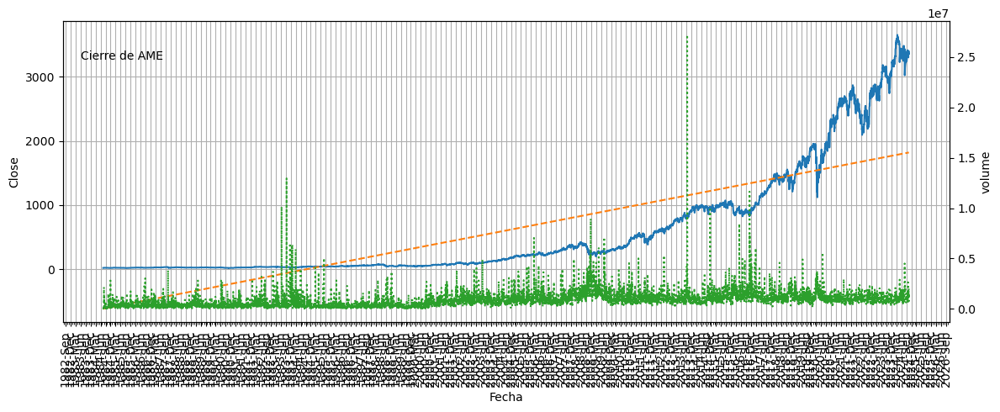

AME; Cierre anterior: 3361.12; Cierre predicho: 3364.07; Tend esperada: Alza; Beta: 1.17

Pais:United States; Sector: Industrials; Industria: Specialty Industrial Machinery

Resumen: AMETEK, Inc. manufactures and sells electronic instruments and electromechanical devices in the North America, Europe, Asia, and South America, and internationally. The company's EIG segment offers advanced instruments for the process, aerospace, power, and industrial markets; process and analytical instruments for the oil and gas, petrochemical, pharmaceutical, semiconductor, automation, and food and beverage industries; instruments to the laboratory equipment, ultra-precision manufacturing, medical, and test and measurement markets; power quality monitoring and c devices, uninterruptible power supplies, programmable power and electromagnetic compatibility test equipment, and sensors for gas turbines and dashboard instruments; heavy trucks, instrumentation, and controls for the food and beverage industrie

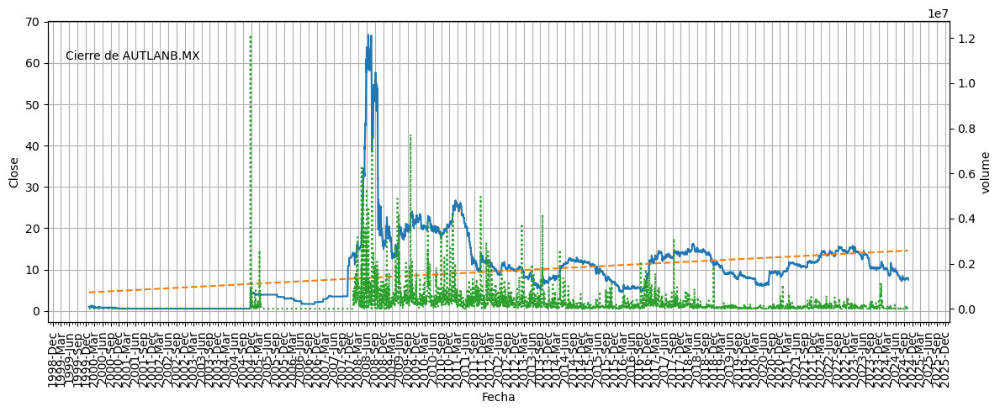

AUTLANB.MX; Cierre anterior: 7.51; Cierre predicho: 7.6; Tend esperada: Alza; Beta: 0.43

Pais:Mexico; Sector: Basic Materials; Industria: Other Industrial Metals & Mining

Resumen: Compañía Minera Autlán, S.A.B. de C.V. engages in the production and marketing of manganese minerals and ferroalloys for steel industry in Mexico and internationally. It is involved in the electricity generation and mining of precious metals. The company offers ferroalloy and manganese products, including high, medium, and low carbon ferromanganese; silicomanganese; nitrided medium carbon ferromanganese; manganese nodules and carbonates; and other specialty ferroalloys, as well as manganese derivatives, such as battery-grade natural manganese dioxide, ceramic-grade natural manganese dioxide, and manganese oxide products. It operates Molango, a manganese ore mining unit and Nonoalco, a manganese mineral mining unit located in the northern Hidalgo State; Naopa, a manganese carbonate mining unit located in the

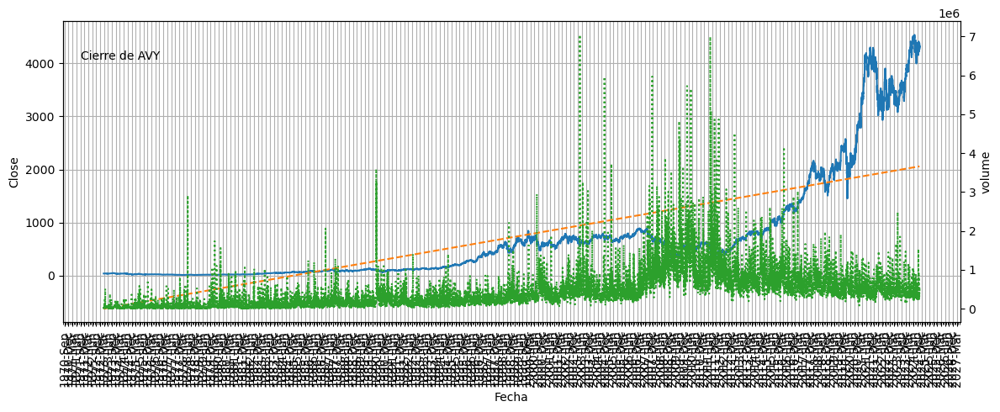

AVY; Cierre anterior: 4312.11; Cierre predicho: 4351.91; Tend esperada: Alza; Beta: 0.89

Pais:United States; Sector: Consumer Cyclical; Industria: Packaging & Containers

Resumen: Avery Dennison Corporation operates as a materials science and digital identification solutions company in the United States, Europe, the Middle East, North Africa, Asia, Latin, America, and internationally. It provides pressure-sensitive materials comprising papers, plastic films, metal foils, and fabrics; performance tapes products, including tapes for wire harnessing, as well as cable wrapping for automotive, electrical, and general industrial applications; mechanical fasteners, which are precision-extruded and injection-molded plastic devices used in various automotive, general industrial, and retail applications; and other pressure-sensitive adhesive-based materials and converted products under the Fasson, JAC, Yongle, and Avery Dennison brands. The company also offers graphics and reflective products f

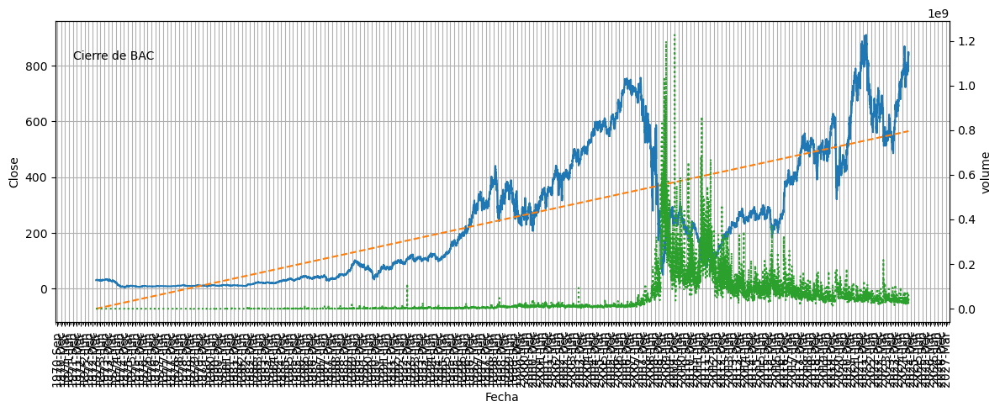

BAC; Cierre anterior: 839.68; Cierre predicho: 842.08; Tend esperada: Alza; Beta: 1.34

Pais:United States; Sector: Financial Services; Industria: Banks - Diversified

Resumen: Bank of America Corporation, through its subsidiaries, provides banking and financial products and services for individual consumers, small and middle-market businesses, institutional investors, large corporations, and governments worldwide. It operates in four segments: Consumer Banking, Global Wealth & Investment Management (GWIM), Global Banking, and Global Markets. The Consumer Banking segment offers traditional and money market savings accounts, certificates of deposit and IRAs, non-interest and interest-bearing checking accounts, and investment accounts and products; credit and debit cards; residential mortgages, and home equity loans; and direct and indirect loans, such as automotive, recreational vehicle, and consumer personal loans. The GWIM segment provides investment management, brokerage, banking, an

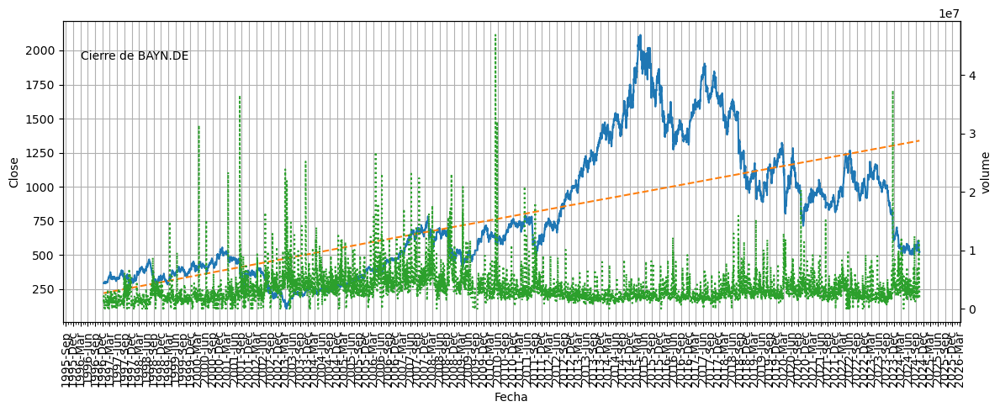

BAYN.DE; Cierre anterior: 523.31; Cierre predicho: 525.2; Tend esperada: Alza; Beta: 0.97

Pais:Germany; Sector: Healthcare; Industria: Drug Manufacturers - General

Resumen: Bayer Aktiengesellschaft, together its subsidiaries, operates as a life science company worldwide. It operates through Pharmaceuticals, Consumer Health, and Crop Science segments. The Pharmaceuticals segment offers prescription products primarily for cardiology and women's health care; specialty therapeutics in the areas of oncology, hematology, and ophthalmology; and diagnostic imaging equipment and contrast agents, as well as cell and gene therapy. The Consumer Health segment markets nonprescription over-the-counter medicines, medical products, medicated skincare products, nutritional supplements, and self-care solutions in dermatology, nutritional supplements, pain and cardiovascular risk prevention, digestive health, allergy, and cold and cough. The Crop Science segment offers chemical and biological crop prot

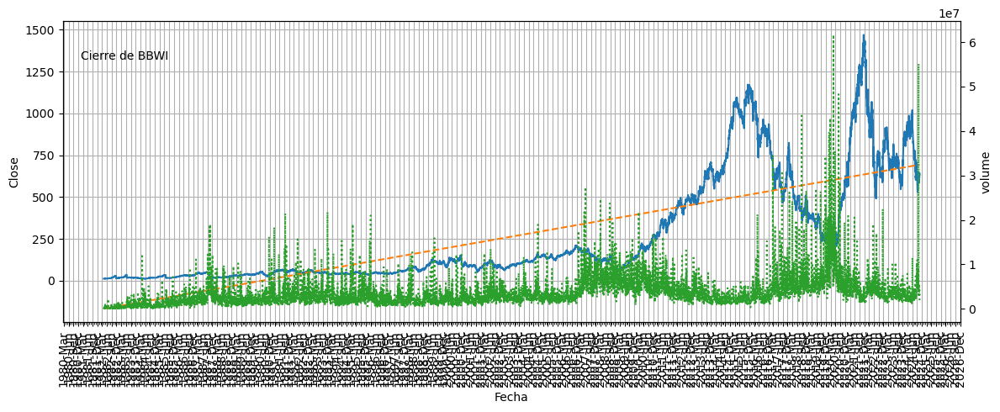

BBWI; Cierre anterior: 633.73; Cierre predicho: 633.76; Tend esperada: Alza; Beta: 1.75

Pais:United States; Sector: Consumer Cyclical; Industria: Specialty Retail

Resumen: Bath & Body Works, Inc. operates a specialty retailer of home fragrance, body care, and soaps and sanitizer products. It sells its products under the Bath & Body Works, White Barn, and other brand names through retail stores and e-commerce sites located in the United States and Canada, as well as through international stores operated by partners under franchise, license, and wholesale arrangements. The company was formerly known as L Brands, Inc. and changed its name to Bath & Body Works, Inc. in August 2021. Bath & Body Works, Inc. was founded in 1963 and is headquartered in Columbus, Ohio.



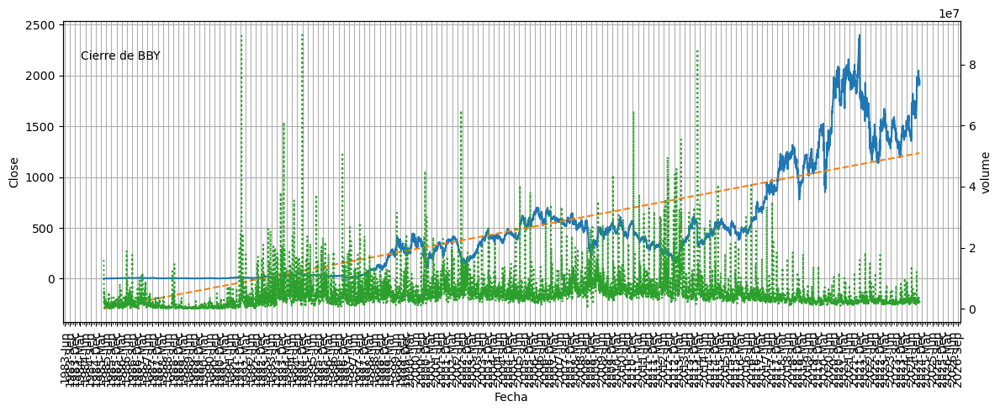

BBY; Cierre anterior: 1907.54; Cierre predicho: 1909.95; Tend esperada: Alza; Beta: 1.48

Pais:United States; Sector: Consumer Cyclical; Industria: Specialty Retail

Resumen: Best Buy Co., Inc. engages in the retail of technology products in the United States, Canada, and international. Its stores provide computing and mobile phone products, such as desktops, notebooks, and peripherals; mobile phones comprising related mobile network carrier commissions; networking products; tablets covering e-readers; smartwatches; and consumer electronics consisting of digital imaging, health and fitness products, portable audio comprising headphones and portable speakers, and smart home products, as well as home theaters, which includes home theater accessories, soundbars, and televisions. The company's stores also offer appliances, such as dishwashers, laundry, ovens, refrigerators, blenders, coffee makers, vacuums, and personal care; entertainment products consisting of drones, peripherals, movies

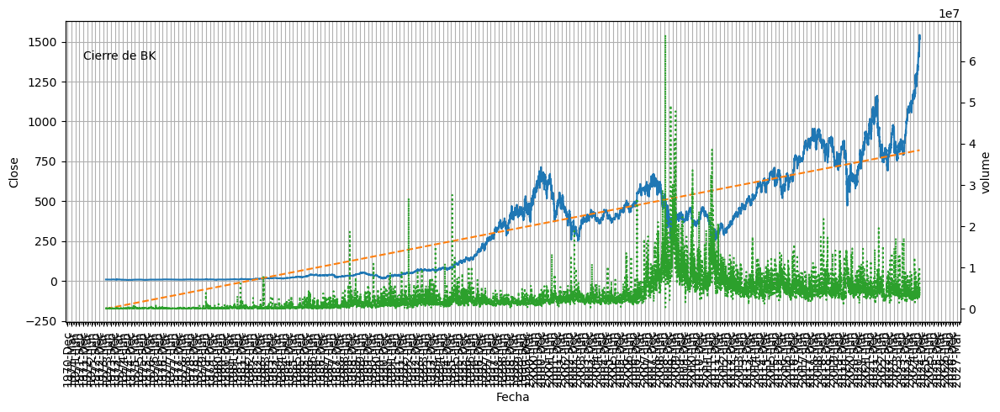

BK; Cierre anterior: 1521.23; Cierre predicho: 1523.33; Tend esperada: Alza; Beta: 1.07

Pais:United States; Sector: Financial Services; Industria: Banks - Diversified

Resumen: The Bank of New York Mellon Corporation provides a range of financial products and services in the United States and internationally. The company operates through Securities Services, Market and Wealth Services, Investment and Wealth Management, and other segments. The Securities Services segment offers custody, trust and depositary, accounting, exchange-traded funds, middle-office solutions, transfer agency, services for private equity and real estate funds, foreign exchange, securities lending, liquidity/lending services, and data analytics. This segment also provides trustee, paying agency, fiduciary, escrow and other financial, issuer, and support services for brokers and investors. The Market and Wealth Services segment offers clearing and custody, investment, wealth and retirement solutions, technology an

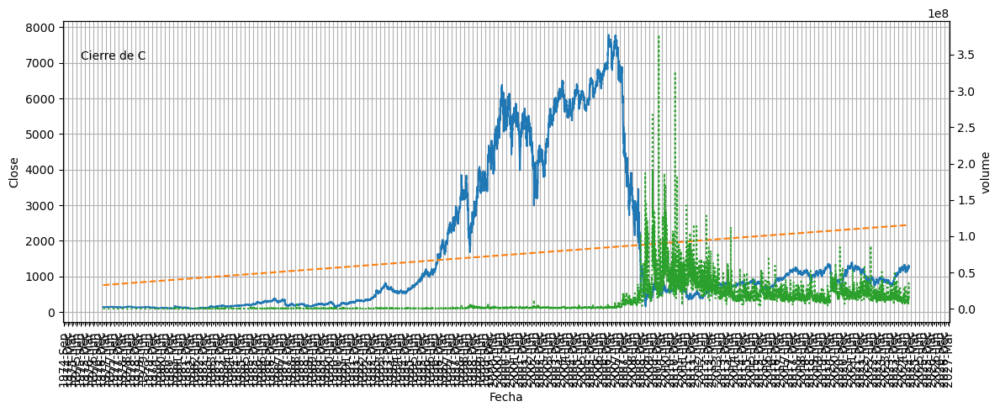

C; Cierre anterior: 1247.03; Cierre predicho: 1251.34; Tend esperada: Alza; Beta: 1.43

Pais:United States; Sector: Financial Services; Industria: Banks - Diversified

Resumen: Citigroup Inc., a diversified financial service holding company, provides various financial product and services to consumers, corporations, governments, and institutions worldwide. It operates through five segments: Services, Markets, Banking, U.S. Personal Banking, and Wealth. The Services segment includes Treasury and Trade Solutions, which provides cash management, trade, and working capital solutions to multinational corporations, financial institutions, and public sector organizations; and Securities Services, such as cross-border support for clients, local market expertise, post-trade technologies, data solutions, and various securities services solutions. The Markets segment offers sales and trading services for equities, foreign exchange, rates, spread products, and commodities to corporate, institution

CB: No price data found, symbol may be delisted (1d 1925-11-12 -> 2024-10-19)


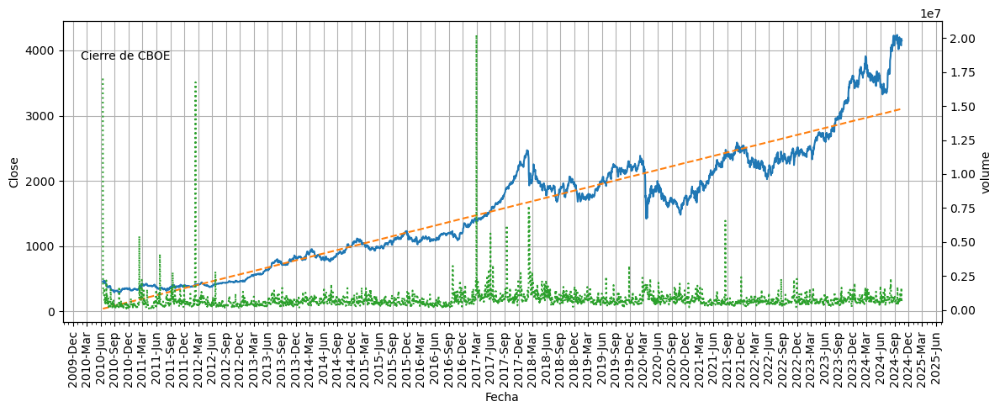

CBOE; Cierre anterior: 4152.39; Cierre predicho: 4155.91; Tend esperada: Alza; Beta: 0.67

Pais:United States; Sector: Financial Services; Industria: Financial Data & Stock Exchanges

Resumen: Cboe Global Markets, Inc., through its subsidiaries, operates as an options exchange worldwide. It operates through six segments: Options, North American Equities, Europe and Asia Pacific, Futures, Global FX, and Digital. The Options segment trades in listed market indices. The North American Equities segment trades in listed U.S. and Canadian equities. This segment also offers exchange-traded products (ETP) transaction and listing services. The Europe and Asia Pacific segment provides pan-European listed equities and derivatives transaction services, ETPs, exchange-traded commodities, and international depository receipts, as well as ETP listings and clearing services. The Futures segment trades in futures. The Global FX segment provides institutional foreign exchange (FX) trading and non-delive

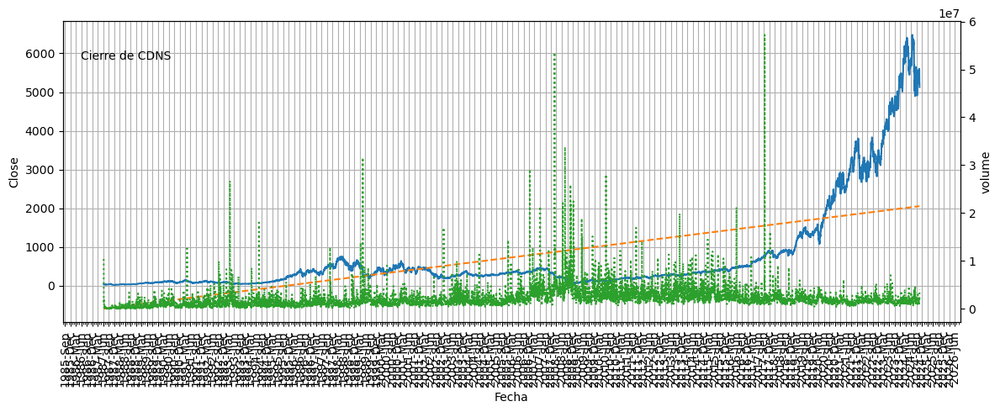

CDNS; Cierre anterior: 5129.37; Cierre predicho: 5186.36; Tend esperada: Alza; Beta: 1.02

Pais:United States; Sector: Technology; Industria: Software - Application

Resumen: Cadence Design Systems, Inc. provides software, hardware, services, and reusable integrated circuit (IC) design blocks worldwide. The company offers functional verification services, including emulation and prototyping hardware. Its functional verification offering consists of JasperGold, a formal verification platform; Xcelium, a parallel logic simulation platform; Palladium, an enterprise emulation platform; and Protium, a prototyping platform for chip verification. The company also provides digital IC design and sign off products, including Genus synthesis and Joules RTL power solutions, as well as Modus DFT software solution to reduce systems-on-chip design-for-test time; physical implementation tools, such as place and route, optimization, and multiple patterning preparation; and Innovus implementation system

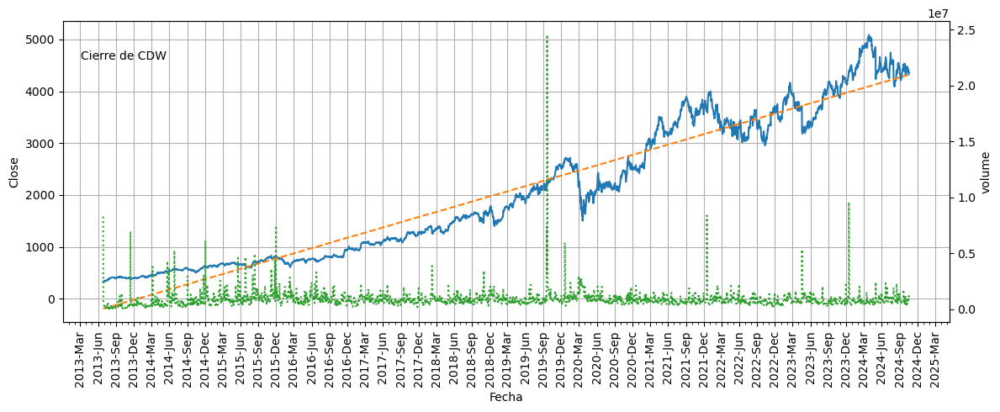

CDW; Cierre anterior: 4331.55; Cierre predicho: 4342.51; Tend esperada: Alza; Beta: 1.03

Pais:United States; Sector: Technology; Industria: Information Technology Services

Resumen: CDW Corporation provides information technology (IT) solutions in the United States, the United Kingdom, and Canada. It operates through three segments: Corporate, Small Business, and Public. The company offers discrete hardware and software products and services, as well as integrated IT solutions, including on-premise and cloud capabilities across hybrid infrastructure, digital experience, and security. It also provides hardware products comprising notebooks/mobile devices, tablets, network communications, desktop computers, collaboration, data storage and servers, and others; and software products, such as cloud solutions, software assurance, application suites, security, virtualization, operating systems, and network management. In addition, the company offers advisory and design, software development,

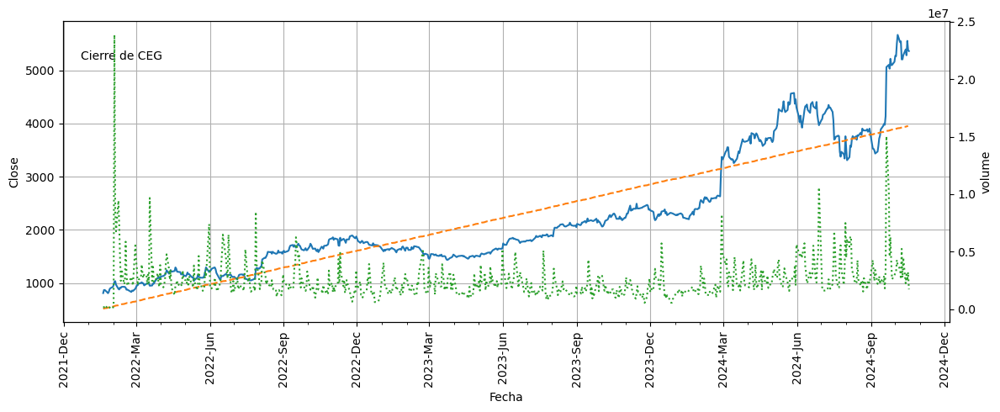

CEG; Cierre anterior: 5360.33; Cierre predicho: 5360.4; Tend esperada: Alza; Beta: 0.77

Pais:United States; Sector: Utilities; Industria: Utilities - Renewable

Resumen: Constellation Energy Corporation generates and sells electricity in the United States. It operates through five segments: Mid-Atlantic, Midwest, New York, ERCOT, and Other Power Regions. The company sells natural gas, energy-related products, and sustainable solutions. It has approximately 33,094 megawatts of generating capacity consisting of nuclear, wind, solar, natural gas, and hydroelectric assets. It serves distribution utilities; municipalities; cooperatives; and commercial, industrial, governmental, and residential customers. The company was incorporated in 2021 and is headquartered in Baltimore, Maryland.



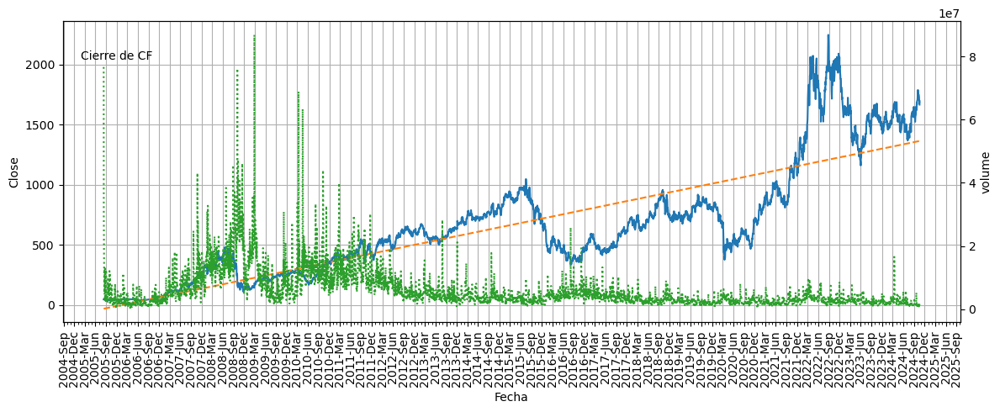

CF; Cierre anterior: 1666.47; Cierre predicho: 1672.43; Tend esperada: Alza; Beta: 0.95

Pais:United States; Sector: Basic Materials; Industria: Agricultural Inputs

Resumen: CF Industries Holdings, Inc., together with its subsidiaries, engages in the manufacture and sale of hydrogen and nitrogen products for energy, fertilizer, emissions abatement, and other industrial activities in North America, Europe, and internationally. It operates through Ammonia, Granular Urea, UAN, AN, and Other segments. The company's principal products include anhydrous ammonia, granular urea, urea ammonium nitrate, and ammonium nitrate products. It also offers diesel exhaust fluid, urea liquor, nitric acid, and aqua ammonia products. The company primarily serves cooperatives, independent fertilizer distributors, traders, wholesalers, and industrial users. CF Industries Holdings, Inc. was founded in 1946 and is headquartered in Northbrook, Illinois.



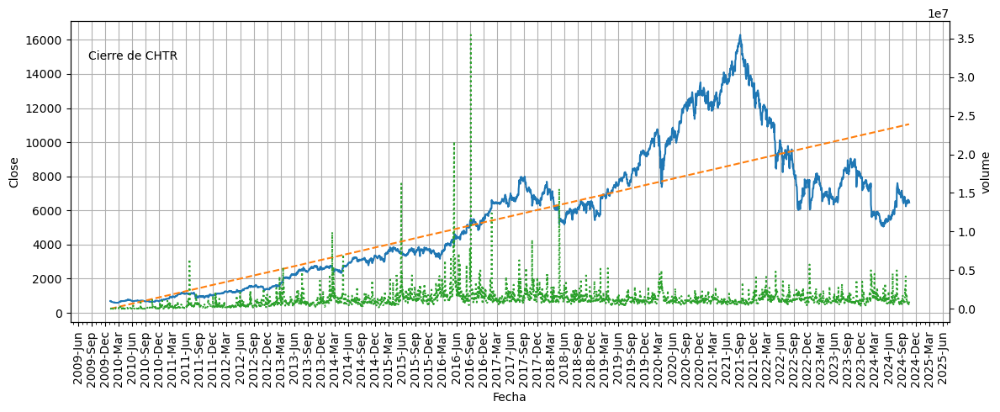

CHTR; Cierre anterior: 6460.53; Cierre predicho: 6468.96; Tend esperada: Alza; Beta: 1.05

Pais:United States; Sector: Communication Services; Industria: Telecom Services

Resumen: Charter Communications, Inc. operates as a broadband connectivity and cable operator company serving residential and commercial customers in the United States. The company offers subscription-based internet, video, and mobile and voice services; a suite of broadband connectivity services, including fixed internet, WiFi, and mobile; Advanced WiFi services; Spectrum Security Shield; in-home WiFi, which provides customers with high performance wireless routers and managed WiFi services to enhance their fixed wireless internet experience; out-of-home WiFi; and Spectrum WiFi services. It also offers voice communications services using voice over internet protocol technology; and broadband communications solutions, such as internet access, data networking, fiber connectivity, video entertainment, and business tele

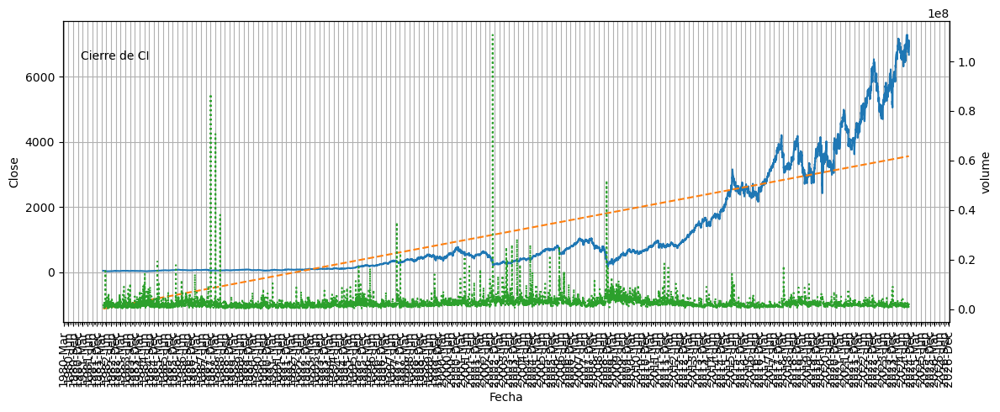

CI; Cierre anterior: 6666.68; Cierre predicho: 6758.97; Tend esperada: Alza; Beta: 0.51

Pais:United States; Sector: Healthcare; Industria: Healthcare Plans

Resumen: The Cigna Group, together with its subsidiaries, provides insurance and related products and services in the United States. Its Evernorth Health Services segment provides a range of coordinated and point solution health services, including pharmacy benefits, home delivery pharmacy, specialty pharmacy, distribution, and care delivery and management solutions to health plans, employers, government organizations, and health care providers. The company's Cigna Healthcare segment offers medical, pharmacy, behavioral health, dental, and other products and services for insured and self-insured customers; Medicare Advantage, Medicare Supplement, and Medicare Part D plans for seniors, as well as individual health insurance plans; and health care coverage in its international markets, as well as health care benefits for mobile indi

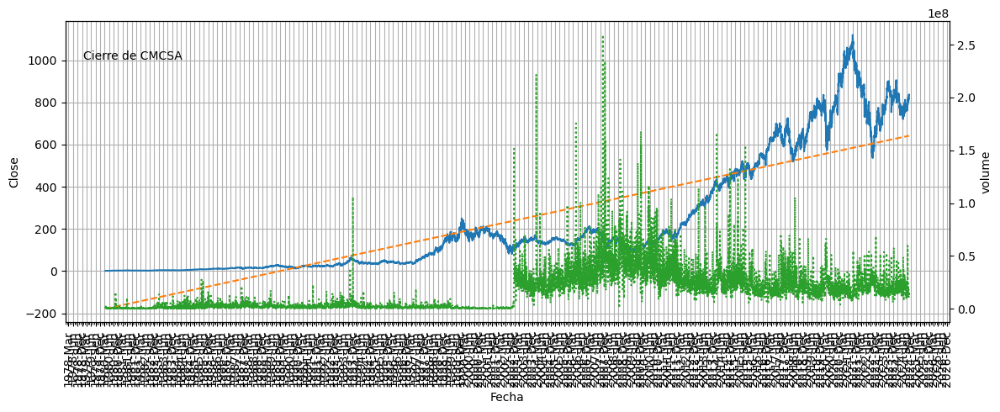

CMCSA; Cierre anterior: 831.95; Cierre predicho: 837.38; Tend esperada: Alza; Beta: 1.01

Pais:United States; Sector: Communication Services; Industria: Telecom Services

Resumen: Comcast Corporation operates as a media and technology company worldwide. It operates through Residential Connectivity & Platforms, Business Services Connectivity, Media, Studios, and Theme Parks segments. The Residential Connectivity & Platforms segment provides residential broadband and wireless connectivity services, residential and business video services, sky-branded entertainment television networks, and advertising. The Business Services Connectivity segment offers connectivity services for small business locations, which include broadband, wireline voice, and wireless services, as well as solutions for medium-sized customers and larger enterprises; and small business connectivity services in the United Kingdom. The Media segment operates NBCUniversal's television and streaming business, including nati

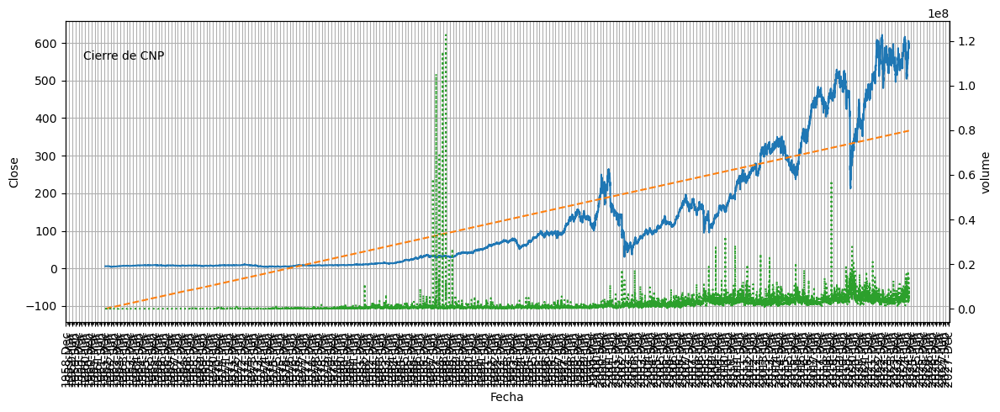

CNP; Cierre anterior: 597.42; Cierre predicho: 598.08; Tend esperada: Alza; Beta: 0.92

Pais:United States; Sector: Utilities; Industria: Utilities - Regulated Electric

Resumen: CenterPoint Energy, Inc. operates as a public utility holding company in the United States. The company operates through two segments, Electric and Natural Gas. The Electric segment includes electric transmission and distribution services to electric customers and electric generation assets, as well as optimizes assets in the wholesale power market. The Natural Gas segment engages in the intrastate natural gas sales, and natural gas transportation and distribution for residential, commercial, industrial and institutional customers in Indiana, Louisiana, Minnesota, Mississippi, Ohio, and Texas; permanent pipeline connections through interconnects with various interstate and intrastate pipeline companies; and provides maintenance and repair services of home appliances to customers in Minnesota and home repair pr

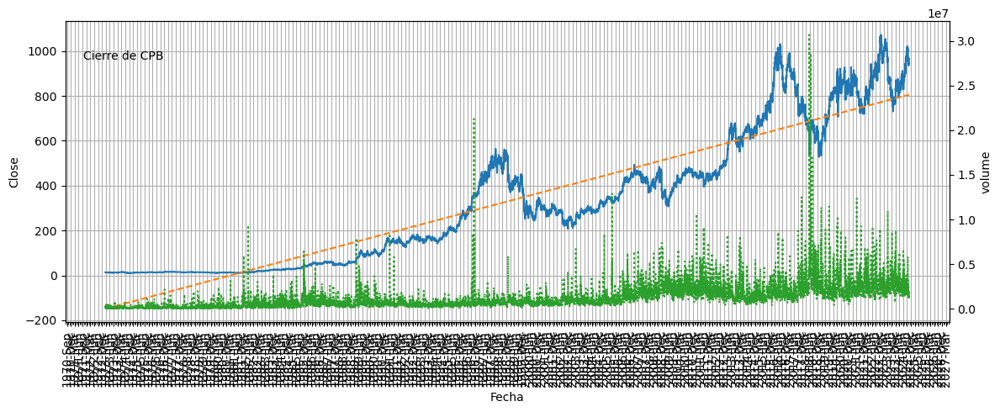

CPB; Cierre anterior: 962.3; Cierre predicho: 963.06; Tend esperada: Alza; Beta: 0.17

Pais:United States; Sector: Consumer Defensive; Industria: Packaged Foods

Resumen: Campbell Soup Company, together with its subsidiaries, manufactures and markets food and beverage products in the United States and internationally. The company operates through Meals & Beverages and Snacks segments. The Meals & Beverages segment engages in the retail and foodservice businesses in the United States and Canada. This segment provides Campbell's condensed and ready-to-serve soups; Swanson broth and stocks; Pacific Foods broth, soups, and non-dairy beverages; Prego pasta sauces; Pace Mexican sauces; Campbell's gravies, pasta, beans, and dinner sauces; Swanson canned poultry; V8 juices and beverages; Campbell's tomato juice; Rao's pasta sauces, dry pasta, frozen entrées, frozen pizza and soups; Michael Angelo's frozen entrées and pasta sauces; and noosa yogurts, as well as snacking products in foodservice 

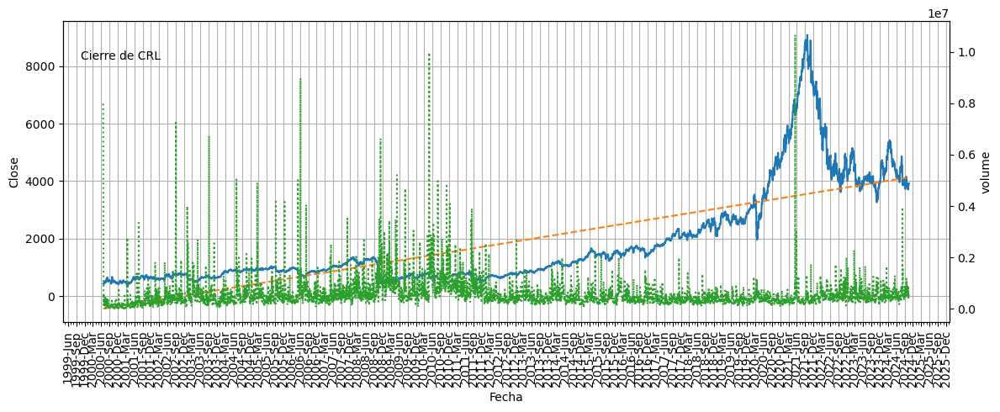

CRL; Cierre anterior: 3924.01; Cierre predicho: 3924.16; Tend esperada: Alza; Beta: 1.36

Pais:United States; Sector: Healthcare; Industria: Diagnostics & Research

Resumen: Charles River Laboratories International, Inc. provides drug discovery, non-clinical development, and safety testing services in the United States, Europe, Canada, the Asia Pacific, and internationally. It operates through three segments: Research Models and Services (RMS), Discovery and Safety Assessment (DSA), and Manufacturing Solutions (Manufacturing). The RMS segment produces and sells rodents, and purpose-bred rats and mice for use by researchers. This segment also provides a range of services to assist its clients in supporting the use of research models in research and screening pre-clinical drug candidates, including research models, genetically engineered models and services, insourcing solutions, and research animal diagnostic services. The DSA segment offers early and in vivo discovery services for the 

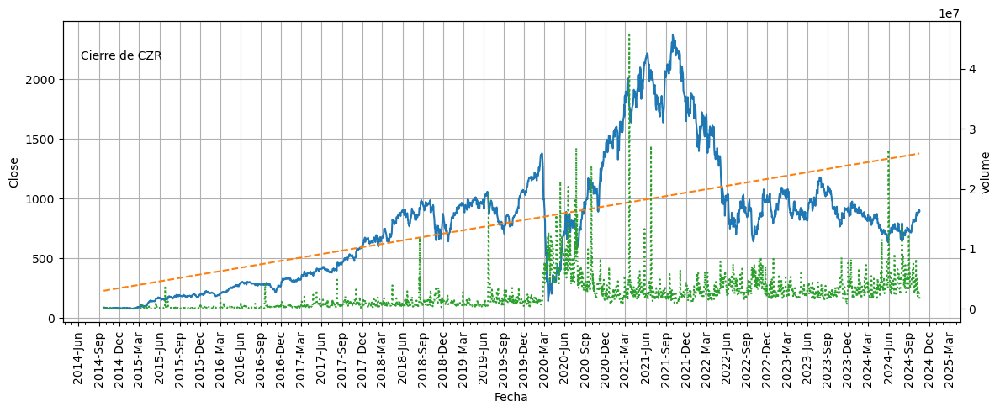

CZR; Cierre anterior: 896.43; Cierre predicho: 897.92; Tend esperada: Alza; Beta: 2.96

Pais:United States; Sector: Consumer Cyclical; Industria: Resorts & Casinos

Resumen: Caesars Entertainment, Inc. operates as a gaming and hospitality company. The company owns, leases, or manages domestic properties in 18 states with slot machines, video lottery terminals and e-tables, and hotel rooms, as well as table games, including poker. It also operates and conducts retail and online sports wagering across 31 jurisdictions in North America and operates iGaming in five jurisdictions in North America; sports betting from our retail and online sportsbooks; and other games, such as keno. In addition, the company operates dining venues, bars, nightclubs, lounges, hotels, and entertainment venues; and provides staffing and management services. Caesars Entertainment, Inc. was founded in 1937 and is based in Reno, Nevada.



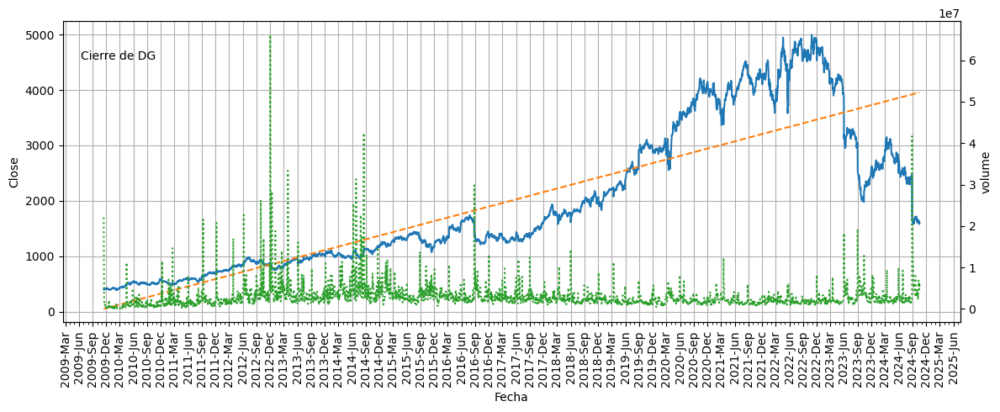

DG; Cierre anterior: 1599.21; Cierre predicho: 1601.45; Tend esperada: Alza; Beta: 0.45

Pais:United States; Sector: Consumer Defensive; Industria: Discount Stores

Resumen: Dollar General Corporation, a discount retailer, provides various merchandise products in the southern, southwestern, midwestern, and eastern United States. It offers consumable products, including paper and cleaning products, such as paper towels, bath tissues, paper dinnerware, trash and storage bags, disinfectants, and laundry products; packaged food comprising cereals, pasta, canned soups, fruits and vegetables, condiments, spices, sugar, and flour; and perishables that include milk, eggs, bread, refrigerated and frozen food, beer, and wine. The company's consumable products also comprise snacks, such as candies, cookies, crackers, salty snacks, and carbonated beverages; health and beauty products, including over-the-counter medicines and personal care products, such as soaps, body washes, shampoos, cosmetics, 

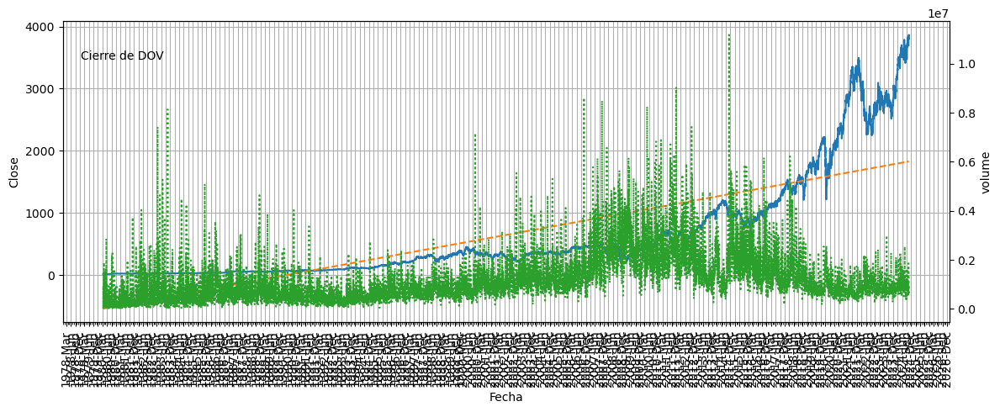

DOV; Cierre anterior: 3856.75; Cierre predicho: 3858.07; Tend esperada: Alza; Beta: 1.22

Pais:United States; Sector: Industrials; Industria: Specialty Industrial Machinery

Resumen: Dover Corporation provides equipment and components, consumable supplies, aftermarket parts, software and digital solutions, and support services worldwide. The company's Engineered Products segment provides various equipment, component, software, solution, and services that are used in vehicle aftermarket, waste handling, industrial automation, aerospace and defense, industrial winch and hoist, and fluid dispensing end-market. This segment offers manual and power clamp, rotary and linear mechanical indexer, conveyor, pick and place unit, glove port, and manipulator, as well as end-of-arm robotic gripper, slide, and end effector; winches, hoists, bearings, drives, and electric monitoring system; and radio frequency and microwave filters and switches, and signal intelligence solutions. Its Clean Energy & Fu

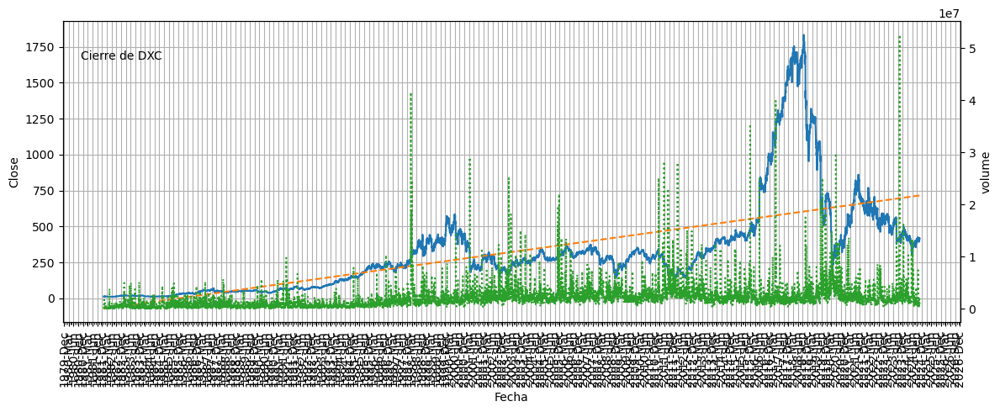

DXC; Cierre anterior: 417.66; Cierre predicho: 418.75; Tend esperada: Alza; Beta: 1.68

Pais:United States; Sector: Technology; Industria: Information Technology Services

Resumen: DXC Technology Company, together with its subsidiaries, provides information technology services and solutions in the United States, the United Kingdom, rest of Europe, Australia, and internationally. It operates in two segments, Global Business Services (GBS) and Global Infrastructure Services (GIS). The GBS segment offers a portfolio of analytics services and extensive partner ecosystem that help its customers to gain insights, automate operations, and accelerate their transformation journeys; and software engineering, consulting, and data analytics solutions, which enable businesses to run and manage their mission-critical functions, transform their operations, and develop new ways of doing business. This segment also simplifies, modernize, and accelerate mission-critical applications that support busines

ECL: No price data found, symbol may be delisted (1d 1925-11-12 -> 2024-10-19)


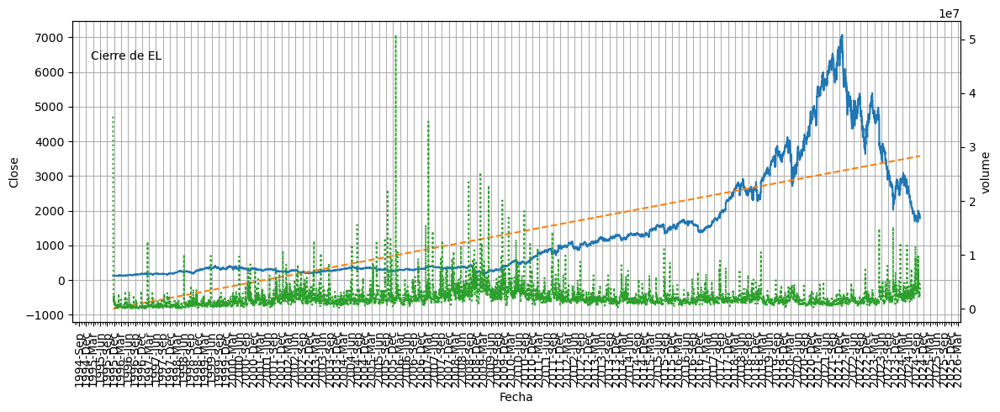

EL; Cierre anterior: 1786.51; Cierre predicho: 1790.1; Tend esperada: Alza; Beta: 1.0

Pais:United States; Sector: Consumer Defensive; Industria: Household & Personal Products

Resumen: The Estée Lauder Companies Inc. manufactures, markets, and sells skin care, makeup, fragrance, and hair care products worldwide. It offers skin care products, including moisturizers, serums, cleansers, toners, body care, exfoliators, acne care and oil correctors, facial masks, and sun care products; and makeup products, such as lipsticks, lip glosses, mascaras, foundations, eyeshadows, and powders, as well as compacts, brushes, and other makeup tools. The company also provides fragrance products in various forms comprising eau de parfum sprays and colognes, as well as lotions, powders, creams, candles, and soaps; and hair care products, including shampoos, conditioners, styling products, treatment, finishing sprays, and hair color products, as well as sells ancillary products and services. It offers its

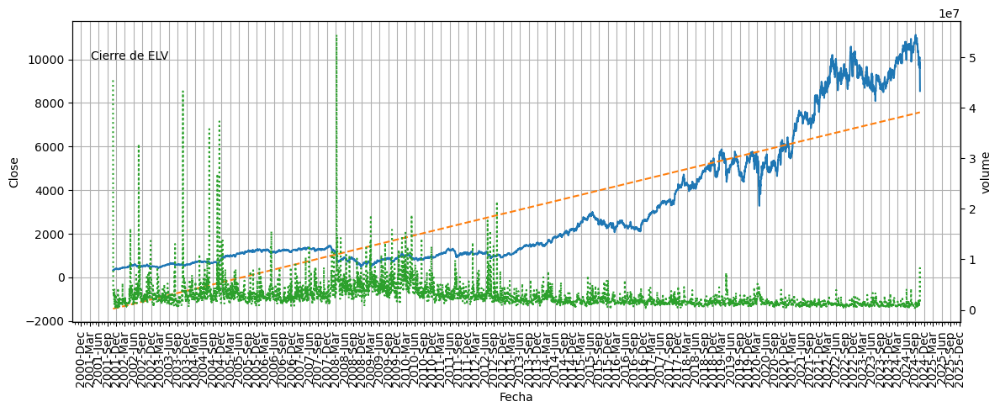

ELV; Cierre anterior: 8547.04; Cierre predicho: 8608.21; Tend esperada: Alza; Beta: 0.83

Pais:United States; Sector: Healthcare; Industria: Healthcare Plans

Resumen: Elevance Health, Inc., together with its subsidiaries, operates as a health benefits company in the United States. The company operates through four segments: Health Benefits, CarelonRx, Carelon Services, and Corporate & Other. It offers a variety of health plans and services to program members; health products; an array of fee-based administrative managed care services; and specialty and other insurance products and services, such as stop loss, dental, vision, life, disability, and supplemental health insurance benefits. The company operates in the pharmacy services business; and markets and offers pharmacy services, including pharmacy benefit management, as well as home delivery and specialty pharmacies, claims adjudication, formulary management, pharmacy networks, rebate administration, a prescription drug database, a

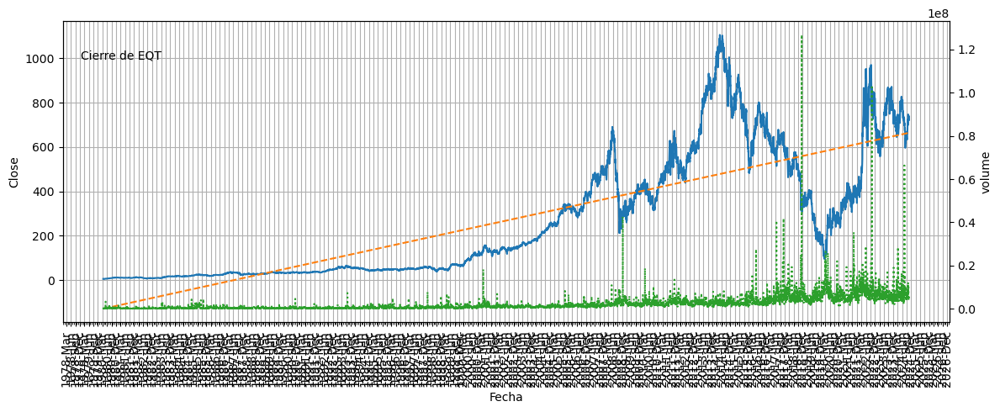

EQT; Cierre anterior: 724.01; Cierre predicho: 724.35; Tend esperada: Alza; Beta: 1.06

Pais:United States; Sector: Energy; Industria: Oil & Gas E&P

Resumen: EQT Corporation operates as a natural gas production company in the United States. The company sells natural gas and natural gas liquids to marketers, utilities, and industrial customers through pipelines located in the Appalachian Basin. It also offers marketing services and contractual pipeline capacity management services. The company was formerly known as Equitable Resources Inc. and changed its name to EQT Corporation in February 2009. EQT Corporation was founded in 1878 and is headquartered in Pittsburgh, Pennsylvania.



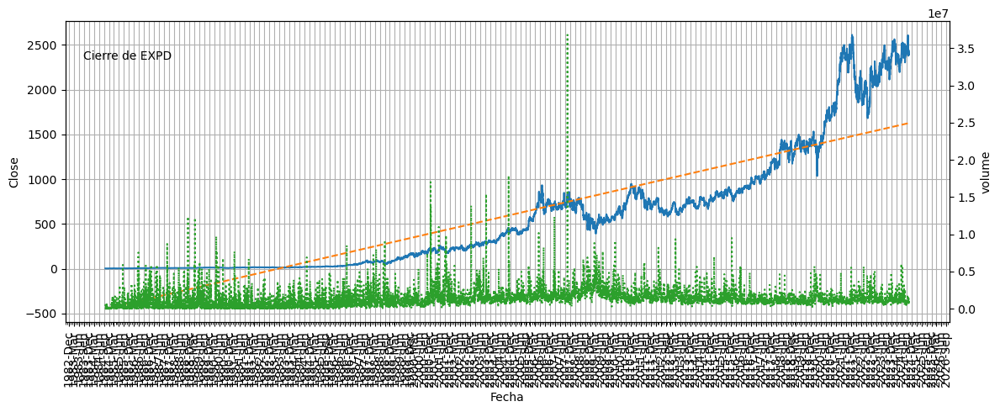

EXPD; Cierre anterior: 2390.88; Cierre predicho: 2394.83; Tend esperada: Alza; Beta: 0.96

Pais:United States; Sector: Industrials; Industria: Integrated Freight & Logistics

Resumen: Expeditors International of Washington, Inc., together with its subsidiaries, provides logistics services worldwide. The company offers airfreight services, such as air freight consolidation and forwarding; ocean freight and ocean services, including ocean freight consolidation, direct ocean forwarding, and order management; customs brokerage, import, intra-continental ground transportation and delivery, and warehousing and distribution services; and customs clearance, purchase order management, vendor consolidation, time-definite transportation services, temperature-controlled transit, cargo insurance, specialized cargo monitoring and tracking, and other supply chain solutions. It also provides optimization, trade compliance consulting, cargo security, and solutions. In addition, it acts as a freight con

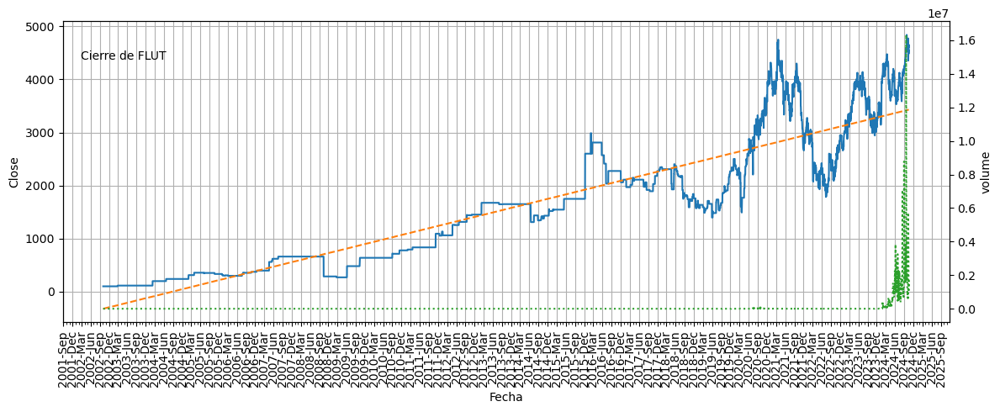

FLUT; Cierre anterior: 4609.73; Cierre predicho: 4624.9; Tend esperada: Alza; Beta: 1.24

Pais:Ireland; Sector: Consumer Cyclical; Industria: Gambling

Resumen: Flutter Entertainment plc operates as a sports betting and gaming company in the United Kingdom, Ireland, Australia, the United States, Italy, and internationally. The company operates through four segments: UK & Ireland, Australia, International, and US. It offers sports betting, iGaming, daily fantasy sports, online racing wagering, and TV broadcasting products; sportsbooks and exchange sports betting products, and gaming products; and online sports betting. In addition, it provides online poker, casino, and rummy. Further, it provides sports betting and gaming services through paddypower.com, betfair.com, sportsbet.com.au, tvg.com, us.betfair.com, fanduel.com, adjarabet.com, pokerstars.com, Skybet.com, tombola.com, sisal.com, and maxbet.rs websites under the FanDuel, Sky Betting & Gaming, Sportsbet, PokerStars, Paddy Power, 

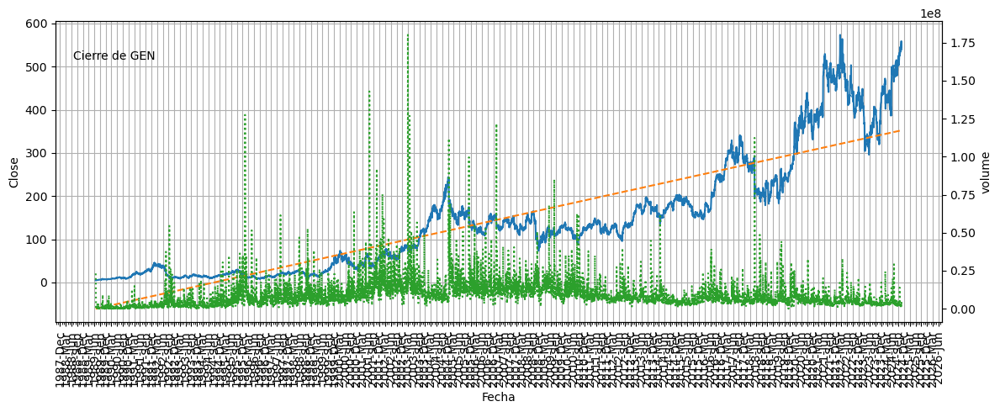

GEN; Cierre anterior: 539.68; Cierre predicho: 544.87; Tend esperada: Alza; Beta: 1.06

Pais:United States; Sector: Technology; Industria: Software - Infrastructure

Resumen: Gen Digital Inc. engages in the provision of cyber safety solutions for consumers in the United States, Canada, Latin America, Europe, the Middle East, Africa, the Asia Pacific, and Japan. The company offers security and performance products under Norton, Avast, Avira, AVG, and CCleaner brands that provide real-time protection and maintenance for PCs, Macs, and mobile devices against malware, viruses, adware, and other online threats. It also provides identity protection solutions, including LifeLock Identity Theft Protection, Avast and AVG Secure Identity, Norton Identity Theft Protection, and Dark Web Monitoring for monitoring of credit reports, financial accounts, the dark web, and social media accounts to help safeguard customers' personal information. In addition, the company offers Virtual Private Network (V

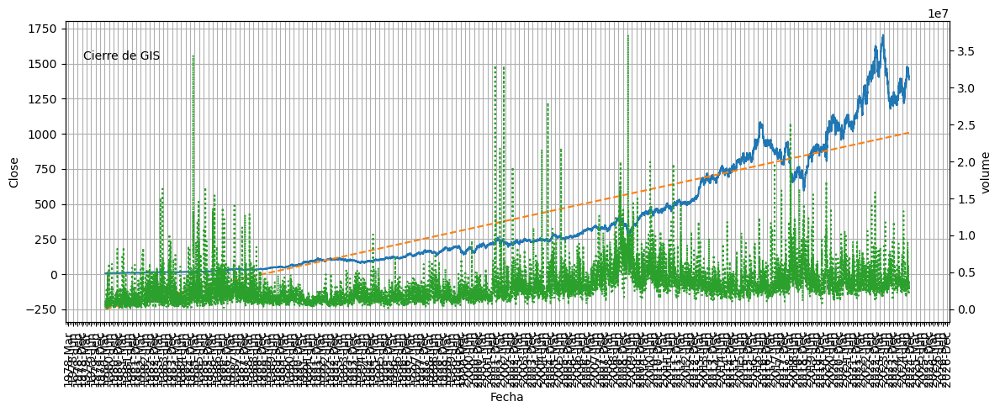

GIS; Cierre anterior: 1387.5; Cierre predicho: 1388.95; Tend esperada: Alza; Beta: 0.09

Pais:United States; Sector: Consumer Defensive; Industria: Packaged Foods

Resumen: General Mills, Inc. manufactures and markets branded consumer foods worldwide. The company operates through four segments: North America Retail; International; Pet; and North America Foodservice. It offers grain, ready-to-eat cereals, refrigerated yogurt, soup, meal kits, refrigerated and frozen dough products, dessert and baking mixes, bakery flour, frozen pizza and pizza snacks, snack bars, fruit and savory snacks, ice cream and frozen desserts, unbaked and fully baked frozen dough products, frozen hot snacks, ethnic meals, side dish mixes, frozen breakfast and entrees, nutrition bars, and frozen and shelf-stable vegetables. The company also manufactures and markets pet food products, including dog and cat food; and operates ice cream parlors. It markets its products under the Annie's, Betty Crocker, Bisquick, Blu

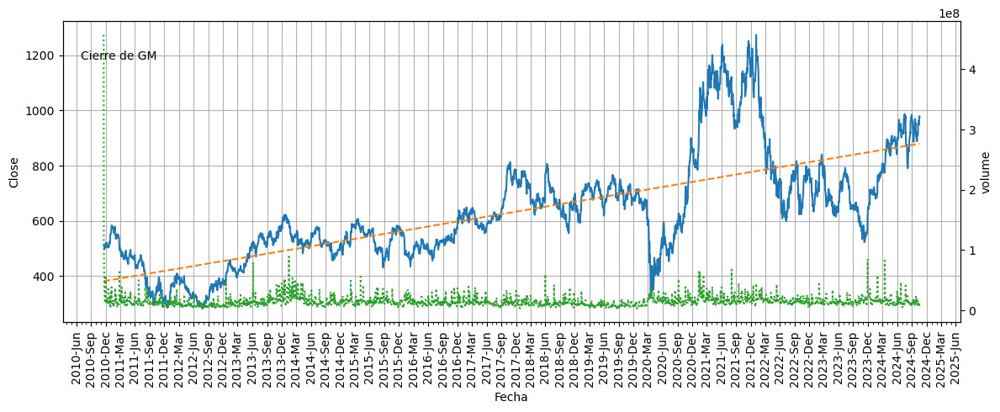

GM; Cierre anterior: 975.8; Cierre predicho: 978.11; Tend esperada: Alza; Beta: 1.43

Pais:United States; Sector: Consumer Cyclical; Industria: Auto Manufacturers

Resumen: General Motors Company designs, builds, and sells trucks, crossovers, cars, and automobile parts; and provide software-enabled services and subscriptions worldwide. The company operates through GM North America, GM International, Cruise, and GM Financial segments. It markets its vehicles primarily under the Buick, Cadillac, Chevrolet, GMC, Baojun, and Wuling brand names. In addition, the company sells trucks, crossovers, cars, and automobile parts through retail dealers, and distributors and dealers, as well as to fleet customers, including daily rental car companies, commercial fleet customers, leasing companies, and governments. Further, it offers range of after-sale services through dealer network, such as maintenance, light repairs, collision repairs, vehicle accessories, and extended service warranties. Additio

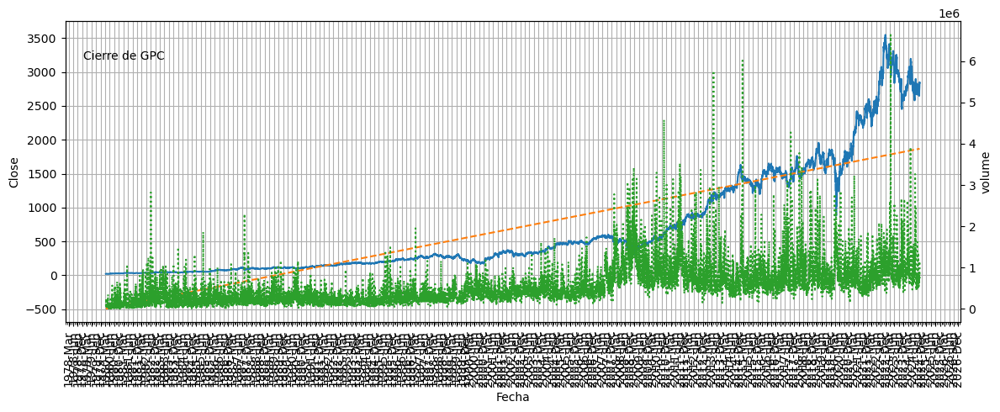

GPC; Cierre anterior: 2840.68; Cierre predicho: 2842.13; Tend esperada: Alza; Beta: 0.91

Pais:United States; Sector: Consumer Cyclical; Industria: Auto Parts

Resumen: Genuine Parts Company distributes automotive replacement parts, and industrial parts and materials. It operates in two segments: Automotive Parts Group and Industrial Parts Group segments. The company distributes automotive replacement parts for hybrid and electric vehicles, trucks, SUVs, buses, motorcycles, recreational vehicles, farm vehicles, small engines, farm equipment, marine equipment, and heavy duty equipment; and equipment and parts used by repair shops, service stations, fleet operators, automobile and truck dealers, leasing companies, bus and truck lines, mass merchandisers, farms, and individuals. It also distributes industrial replacement parts and related supplies, such as abrasives, adhesives, sealants and tape, bearings, chemicals, cutting tools, electrical, facility maintenance, hose and fittings, hydr

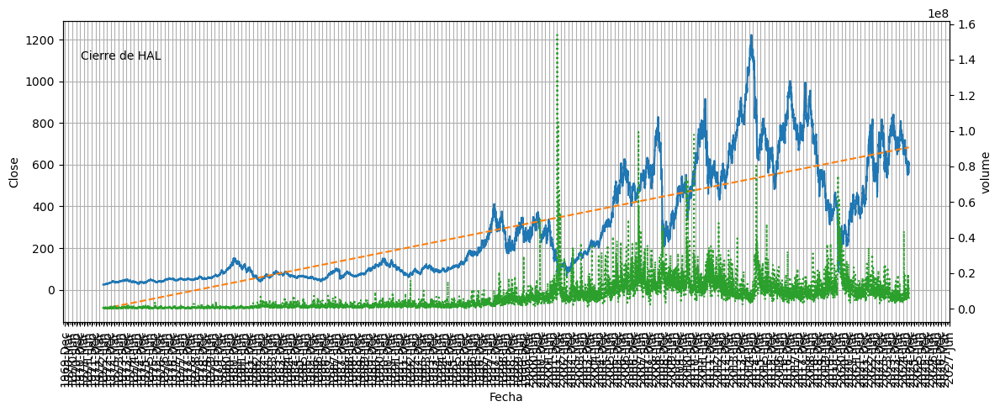

HAL; Cierre anterior: 562.1; Cierre predicho: 565.4; Tend esperada: Alza; Beta: 1.9

Pais:United States; Sector: Energy; Industria: Oil & Gas Equipment & Services

Resumen: Halliburton Company provides products and services to the energy industry worldwide. It operates through two segments, Completion and Production, and Drilling and Evaluation. The Completion and Production segment offers production enhancement services that include stimulation and sand control services; cementing services, such as well bonding and casing, and casing equipment; and completion tools that offer downhole solutions and services, including well completion products and services, intelligent well completions, and service tools, as well as liner hanger, sand control, and multilateral systems. This segment also provides electrical submersible pumps, as well as artificial lift services; production solutions comprising coiled tubing, hydraulic workover units, downhole tools, and pumping and nitrogen services; pi

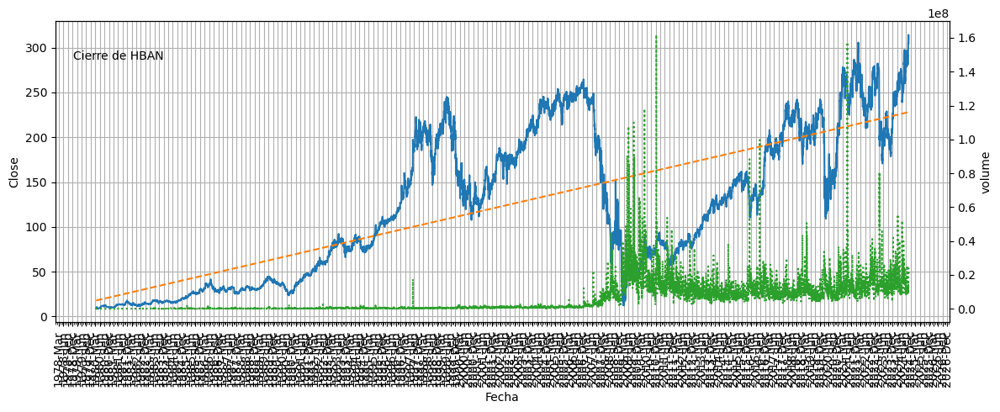

HBAN; Cierre anterior: 304.76; Cierre predicho: 306.71; Tend esperada: Alza; Beta: 1.07

Pais:United States; Sector: Financial Services; Industria: Banks - Regional

Resumen: Huntington Bancshares Incorporated operates as the bank holding company for The Huntington National Bank that provides commercial, consumer, and mortgage banking services in the United States. The company offers financial products and services to consumer and business customers, including deposits, lending, payments, mortgage banking, dealer financing, investment management, trust, brokerage, insurance, and other financial products and services. It also provides 24-hour grace, asterisk-free checking, money scout, $50 safety zone, standby cash, early pay, instant access, savings goal getter, and Huntington heads up; digitally powered consumer and business financial solutions to consumer lending, regional banking, branch banking, and wealth management customers; direct and indirect consumer loans, as well as dealer 

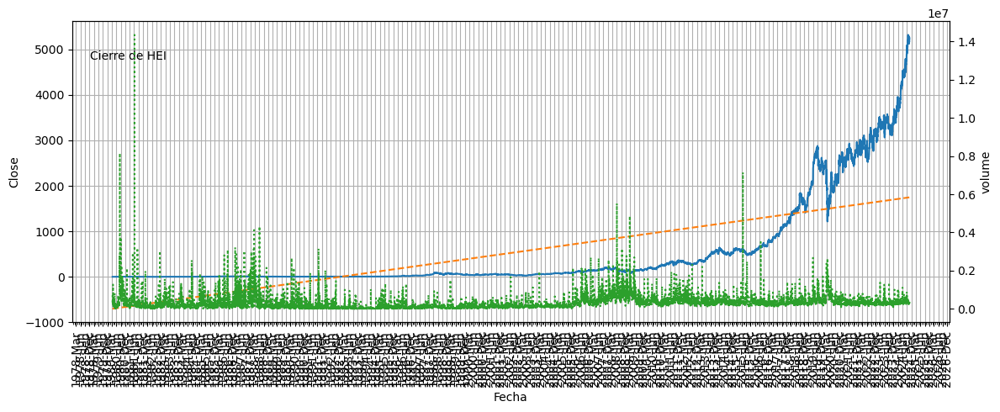

HEI; Cierre anterior: 5176.4; Cierre predicho: 5190.85; Tend esperada: Alza; Beta: 1.23

Pais:United States; Sector: Industrials; Industria: Aerospace & Defense

Resumen: HEICO Corporation, through its subsidiaries, designs, manufactures, and sells aerospace, defense, and electronic related products and services in the United States and internationally. Its Flight Support Group segment provides jet engine and aircraft component replacement parts; thermal insulation blankets and parts; renewable/reusable insulation systems; and specialty components. This segment also distributes hydraulic, pneumatic, structural, interconnect, mechanical, and electro-mechanical components for the commercial, regional, and general aviation markets; and offers repair and overhaul services for jet engine and aircraft component parts, avionics, instruments, composites, and flight surfaces of commercial aircraft, as well as for avionics and navigation systems, and other instruments utilized on military aircra

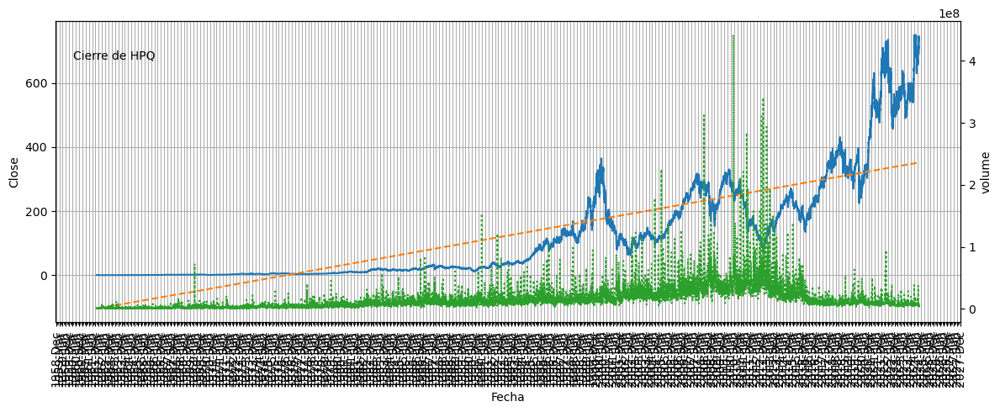

HPQ; Cierre anterior: 739.68; Cierre predicho: 741.19; Tend esperada: Alza; Beta: 1.08

Pais:United States; Sector: Technology; Industria: Computer Hardware

Resumen: HP Inc. provides personal computing and other digital access devices, imaging and printing products, and related technologies, solutions, and services worldwide. The company operates through three segments: Personal Systems, Printing, and Corporate Investments. The Personal Systems segment offers commercial and consumer desktops and notebooks, workstations, commercial mobility devices, thin clients, retail point-of-sale systems, displays, software, support, and services, as well as hybrid systems, such as video conferencing solutions, cameras, headsets, voice, and related software products. The Printing segment provides consumer and commercial printer hardware, supplies, solutions, and services, as well as focuses on graphics and 3D printing and personalization solutions in the commercial and industrial markets. The Corpo

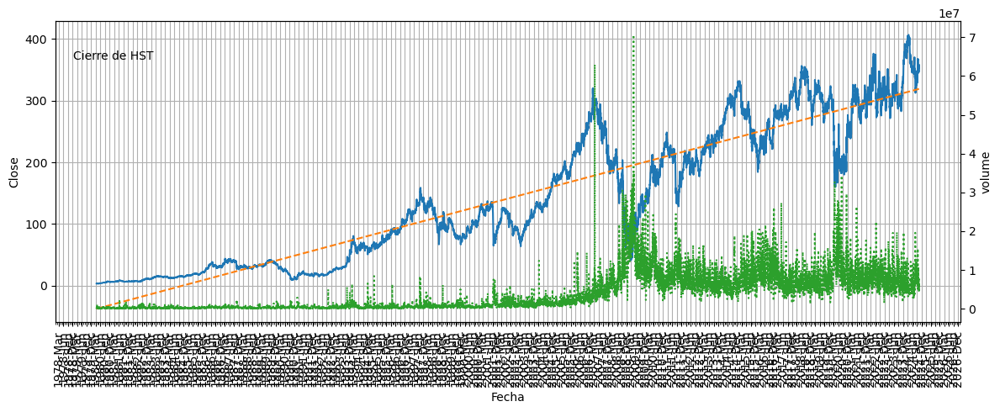

HST; Cierre anterior: 352.58; Cierre predicho: 355.07; Tend esperada: Alza; Beta: 1.34

Pais:United States; Sector: Real Estate; Industria: REIT - Hotel & Motel

Resumen: Host Hotels & Resorts, Inc. is an S&P 500 company and is the largest lodging real estate investment trust and one of the largest owners of luxury and upper-upscale hotels. The Company currently owns 76 properties in the United States and five properties internationally totaling approximately 43,400 rooms. The Company also holds non-controlling interests in seven domestic and one international joint ventures. Guided by a disciplined approach to capital allocation and aggressive asset management, the Company partners with premium brands such as Marriott, Ritz-Carlton, Westin, Sheraton, W, St. Regis, The Luxury Collection, Hyatt, Fairmont, 1 Hotels, Hilton, Four Seasons, Swissôtel, ibis and Novotel, as well as independent brands.



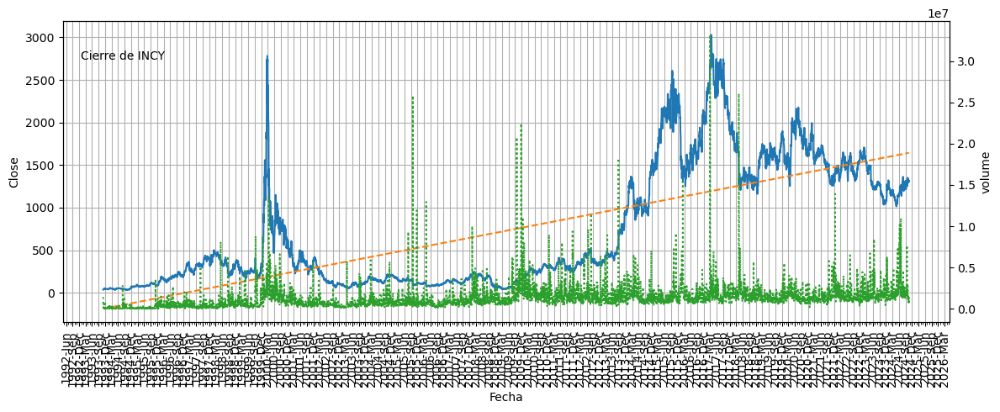

INCY; Cierre anterior: 1317.26; Cierre predicho: 1319.06; Tend esperada: Alza; Beta: 0.73

Pais:United States; Sector: Healthcare; Industria: Biotechnology

Resumen: Incyte Corporation, a biopharmaceutical company, engages in the discovery, development, and commercialization of therapeutics for hematology/oncology, and inflammation and autoimmunity areas in the United States and internationally. The company offers JAKAFI (ruxolitinib) for treatment of intermediate or high-risk myelofibrosis, polycythemia vera, and steroid-refractory acute graft-versus-host disease; MONJUVI (tafasitamab-cxix)/MINJUVI (tafasitamab) for relapsed or refractory diffuse large B-cell lymphoma; PEMAZYRE (pemigatinib), a fibroblast growth factor receptor kinase inhibitor that act as oncogenic drivers in liquid and solid tumor types; ICLUSIG (ponatinib) to treat chronic myeloid leukemia and Philadelphia-chromosome positive acute lymphoblastic leukemia; and ZYNYZ (retifanlimab-dlwr) to treat adults with metastati

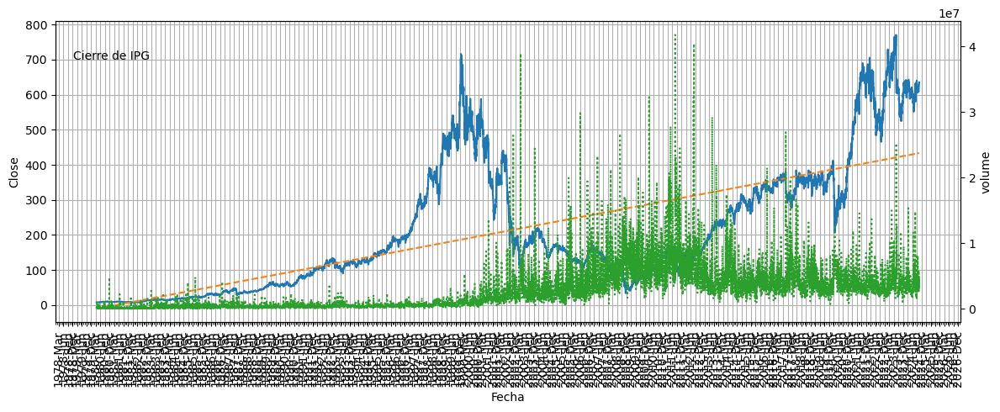

IPG; Cierre anterior: 635.52; Cierre predicho: 635.66; Tend esperada: Alza; Beta: 1.08

Pais:United States; Sector: Communication Services; Industria: Advertising Agencies

Resumen: The Interpublic Group of Companies, Inc. provides advertising and marketing services worldwide. It operates in three segments: Media, Data & Engagement Solutions, Integrated Advertising & Creativity Led Solutions, and Specialized Communications & Experiential Solutions. The Media, Data & Engagement Solutions segment provides media and communications services, digital services and products, advertising and marketing technology, e-commerce services, data management and analytics, strategic consulting, and digital brand experience under the IPG Mediabrands, UM, Initiative, Kinesso, Acxiom, Huge, MRM, and R/GA brand names. The Integrated Advertising & Creativity Led Solutions segment offers advertising, corporate, and brand identity services; and strategic consulting under FCB, IPG Health, McCann Worldgroup, an

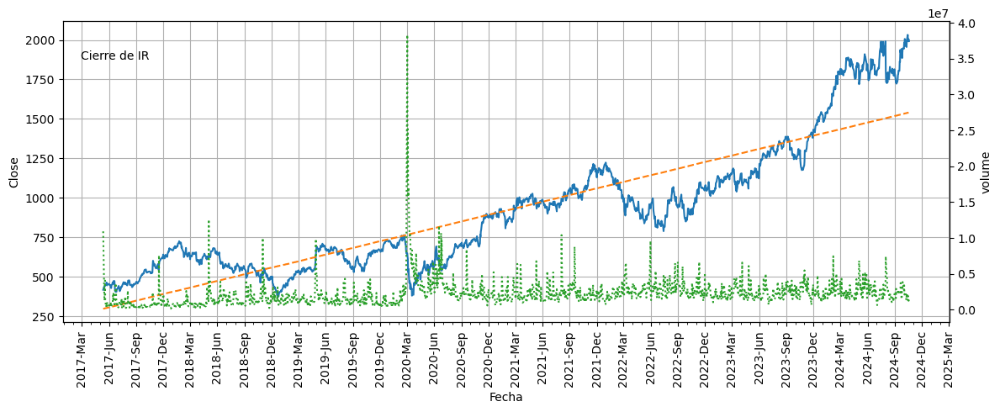

IR; Cierre anterior: 1992.07; Cierre predicho: 1992.84; Tend esperada: Alza; Beta: 1.43

Pais:United States; Sector: Industrials; Industria: Specialty Industrial Machinery

Resumen: Ingersoll Rand Inc. provides various mission-critical air, gas, liquid, and solid flow creation technologies services and solutions worldwide. It operates through two segments, Industrial Technologies and Services, and Precision and Science Technologies. The Industrial Technologies and Services segment designs, manufactures, markets, and services air and gas compression, vacuum, and blower products; fluid transfer equipment and loading systems; and power tools and lifting equipment, including associated aftermarket parts, consumables, air treatment equipment, controls, other accessories, and services under the under the Ingersoll Rand, Gardner Denver, Nash, CompAir, Elmo Rietschle brands, etc. The Precision and Science Technologies segment designs, manufactures, and markets diaphragm, piston, water-powered,

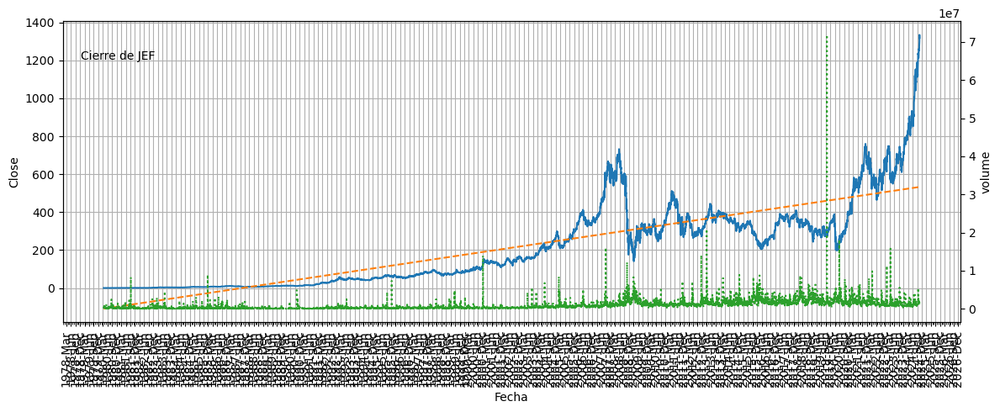

JEF; Cierre anterior: 1318.45; Cierre predicho: 1325.65; Tend esperada: Alza; Beta: 1.3

Pais:United States; Sector: Financial Services; Industria: Capital Markets

Resumen: Jefferies Financial Group Inc. operates as an investment banking and capital markets firm in the Americas, Europe, the Middle East, and the Asia-Pacific. The company operates in two segments, Investment Banking and Capital Markets, and Asset Management. It provides investment banking, advisory services with respect to mergers or acquisitions, debt financing, restructurings or recapitalizations, and private capital advisory transactions; underwriting and placement services related to corporate debt, municipal bonds, mortgage-backed and asset-backed securities, equity and equity-linked securities, and loan syndication services; and corporate lending services. The company also offers financing, securities lending, and other prime brokerage services; equities research, sales, and trading services; wealth management ser

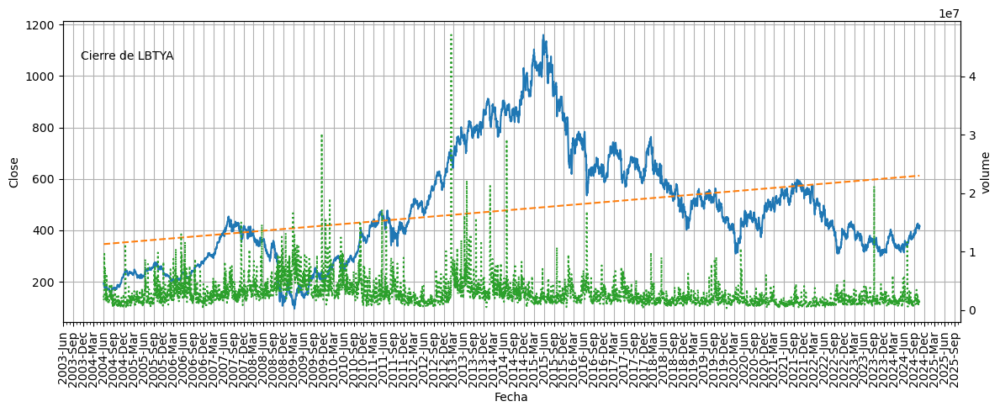

LBTYA; Cierre anterior: 415.28; Cierre predicho: 417.0; Tend esperada: Alza; Beta: 1.17

Pais:Bermuda; Sector: Communication Services; Industria: Telecom Services

Resumen: Liberty Global Ltd., together with its subsidiaries, provides broadband internet, video, fixed-line telephony, and mobile communications services to residential and business customers. It offers value-added broadband services, such as WiFi features, security, anti-virus, firewall, spam protection, smart home services, online storage solutions, and web spaces; and Connect Box that delivers in-home Wi-Fi service. The company provides various tiers of digital video programming and audio services, as well as digital video recorders and multimedia home gateway systems; Horizon 5, a cloud-based, multi-screen entertainment platform that combines linear television, including recording and replay features and video-on-demand services; Horizon Go, an online mobile app; and channels, including general entertainment, sports, mo

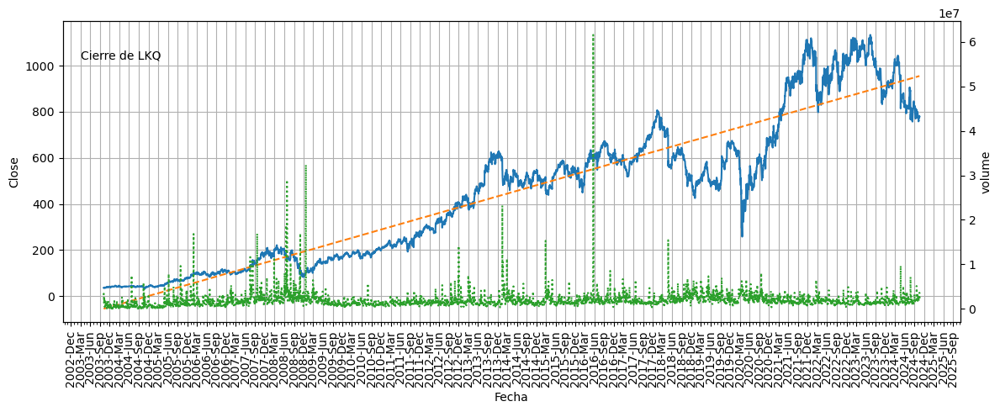

LKQ; Cierre anterior: 779.96; Cierre predicho: 781.6; Tend esperada: Alza; Beta: 1.28

Pais:United States; Sector: Consumer Cyclical; Industria: Auto Parts

Resumen: LKQ Corporation engages in the distribution of replacement parts, components, and systems used in the repair and maintenance of vehicles and specialty vehicle aftermarket products and accessories. It operates through four segments: Wholesale-North America, Europe, Specialty, and Self Service. The company distributes bumper covers, automotive body panels, and lights, as well as mechanical automotive parts and accessories; salvage products, including mechanical and collision parts comprising engines; transmissions; door assemblies; sheet metal products, such as trunk lids, fenders, and hoods; lights and bumper assemblies; scrap metal and other materials to metals recyclers; and brake pads, discs and sensors, clutches, steering and suspension products, filters, and oil and automotive fluids, as well as electrical products, in

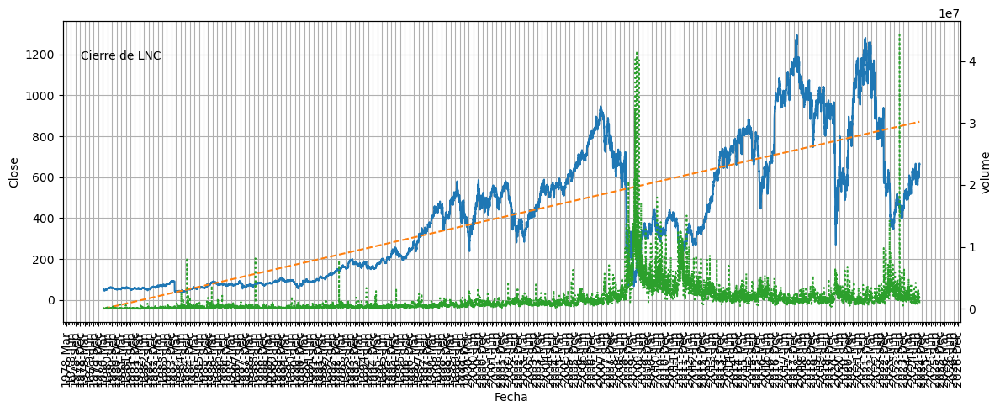

LNC; Cierre anterior: 664.49; Cierre predicho: 666.18; Tend esperada: Alza; Beta: 1.8

Pais:United States; Sector: Financial Services; Industria: Insurance - Life

Resumen: Lincoln National Corporation, through its subsidiaries, operates multiple insurance and retirement businesses in the United States. It operates in four segments: Life Insurance, Annuities, Group Protection, and Retirement Plan Services. The Life Insurance segment provides life insurance products, including term insurance, universal life insurance (UL), indexed universal life insurance, variable universal life insurance (VUL), linked-benefit UL and VUL products, and critical illness and long-term care riders. The Annuities segment offers variable, fixed, and registered index-linked annuities. The Group Protection segment offers group non-medical insurance products consisting of short and long-term disability and statutory disability; paid family medical leave administration and absence management services; term life;

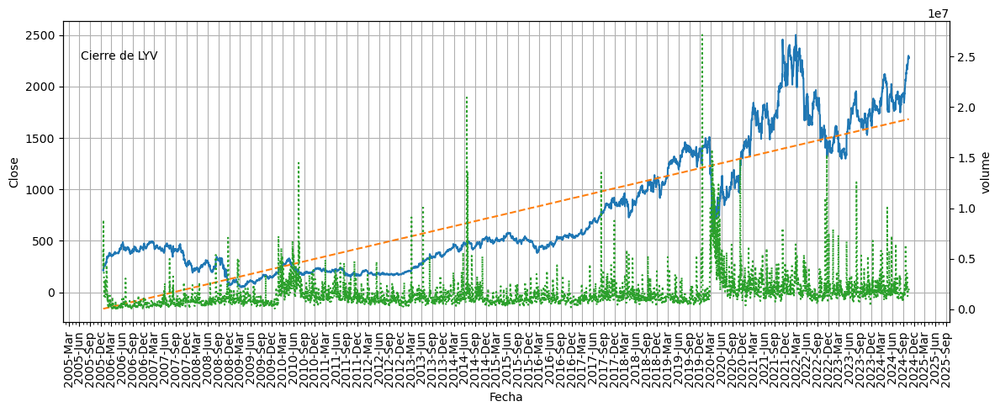

LYV; Cierre anterior: 2280.56; Cierre predicho: 2288.37; Tend esperada: Alza; Beta: 1.35

Pais:United States; Sector: Communication Services; Industria: Entertainment

Resumen: Live Nation Entertainment, Inc. operates as a live entertainment company worldwide. It operates through Concerts, Ticketing, and Sponsorship & Advertising segments. The Concerts segment promotes live music events in its owned or operated venues, and in rented third-party venues. This segment operates and manages music venues; produces music festivals; creates and streams associated content; and offers management and other services to artists. The Ticketing segment manages the ticketing operations, including the provision of ticketing software and services to clients and consumers with marketplace for tickets and event information through mobile apps, other websites, retail outlets, and its primary websites, such as livenation.com and ticketmaster.com; and provides ticket resale services. This segment sells ticke

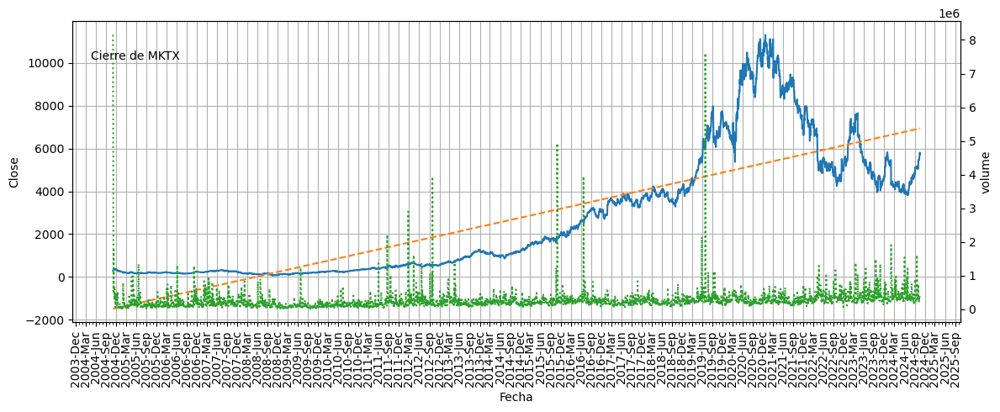

MKTX; Cierre anterior: 5730.76; Cierre predicho: 5745.26; Tend esperada: Alza; Beta: 1.08

Pais:United States; Sector: Financial Services; Industria: Capital Markets

Resumen: MarketAxess Holdings Inc., together with its subsidiaries, operates an electronic trading platform for institutional investor and broker-dealer companies worldwide. The company offers trading technology that provides liquidity access in U.S. high-grade bonds, U.S. high-yield bonds, emerging market debt, eurobonds, municipal bonds, U.S. government bonds, and other fixed-income securities; and executes bond trades between and among institutional investor and broker-dealer clients in an all-to-all anonymous trading environment for corporate bonds through its Open Trading protocols. It also provides trading-related products and services, including composite+ pricing and other market data products to assist clients with trading decisions; auto-execution and other execution services for clients requiring specialized wo

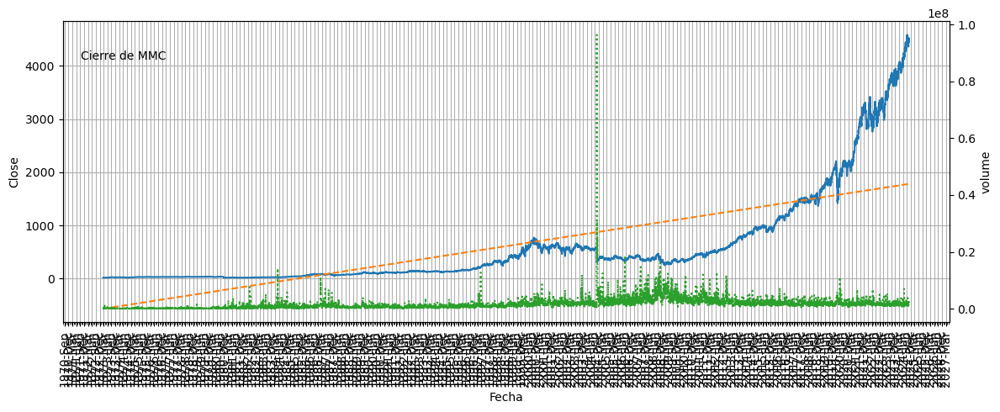

MMC; Cierre anterior: 4457.55; Cierre predicho: 4488.91; Tend esperada: Alza; Beta: 0.94

Pais:United States; Sector: Financial Services; Industria: Insurance Brokers

Resumen: Marsh & McLennan Companies, Inc., a professional services company, provides advice and solutions to clients in the areas of risk, strategy, and people worldwide. It operates through Risk and Insurance Services, and Consulting segments. The Risk and Insurance Services segment offers risk management services, such as risk advice, risk transfer, and risk control and mitigation solutions, as well as insurance and reinsurance broking, strategic advisory services, and analytics solutions, and insurance program management services. It serves businesses, public entities, insurance companies, associations, professional services organizations, and private clients. The Consulting segment provides health, wealth and career advice, solutions and products; and specialized management, strategic, economic, and brand consulting 

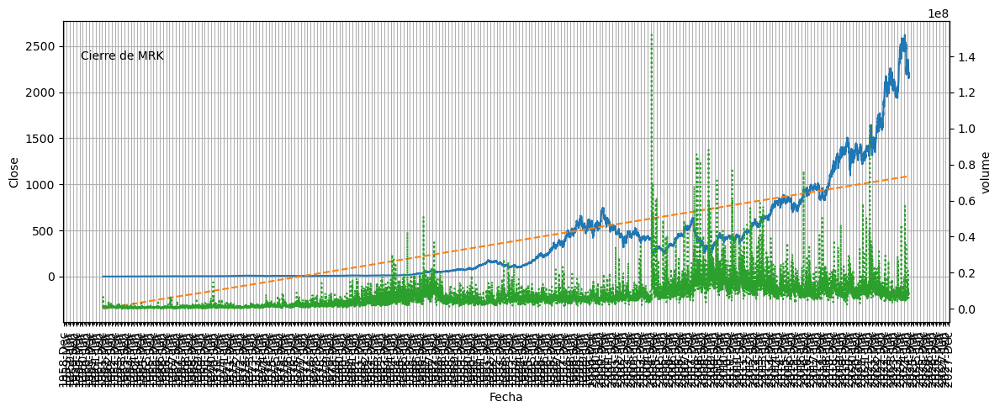

MRK; Cierre anterior: 2156.75; Cierre predicho: 2162.18; Tend esperada: Alza; Beta: 0.4

Pais:United States; Sector: Healthcare; Industria: Drug Manufacturers - General

Resumen: Merck & Co., Inc. operates as a healthcare company worldwide. It operates through two segments, Pharmaceutical and Animal Health. The Pharmaceutical segment offers human health pharmaceutical products in the areas of oncology, hospital acute care, immunology, neuroscience, virology, cardiovascular, and diabetes under the Keytruda, Bridion, Adempas, Lagevrio, Belsomra, Simponi, and Januvia brands, as well as vaccine products consisting of preventive pediatric, adolescent, and adult vaccines under the Gardasil/Gardasil 9, ProQuad, M-M-R II, Varivax, RotaTeq, Live Oral, Vaxneuvance, Pneumovax 23, and Vaqta names. The Animal Health segment discovers, develops, manufactures, and markets veterinary pharmaceuticals, vaccines, and health management solutions and services, as well as digitally connected identification,

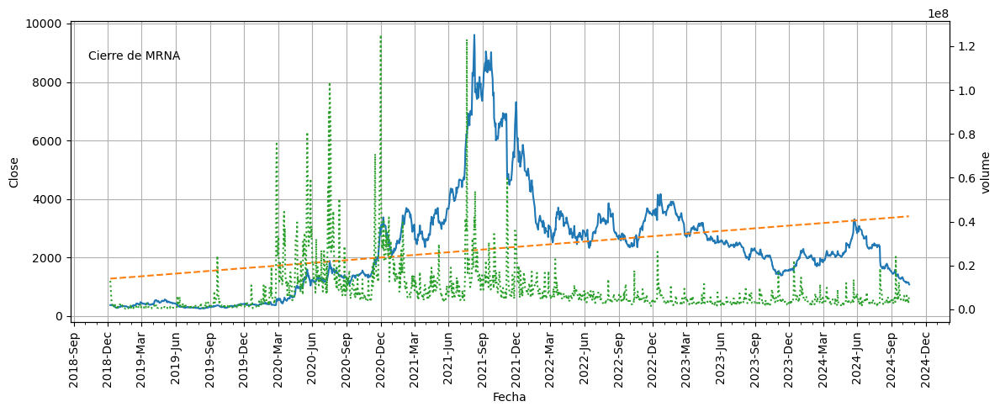

MRNA; Cierre anterior: 1073.41; Cierre predicho: 1076.37; Tend esperada: Alza; Beta: 1.66

Pais:United States; Sector: Healthcare; Industria: Biotechnology

Resumen: Moderna, Inc., a biotechnology company, discovers, develops, and commercializes messenger RNA therapeutics and vaccines for the treatment of infectious diseases, immuno-oncology, rare diseases, autoimmune, and cardiovascular diseases in the United States, Europe, and internationally. Its respiratory vaccines include COVID-19, influenza, and respiratory syncytial virus, spikevax, and hMPV/PIV3 vaccines; latent vaccines comprise cytomegalovirus, epstein-barr virus, herpes simplex virus, varicella zoster virus, and human immunodeficiency virus vaccines; public health vaccines consists of Zika, Nipah, Mpox vaccines; and infectious diseases vaccines, such as lyme and norovirus vaccines. The company also offers systemic secreted and cell surface therapeutics; cancer vaccines, such as personalized cancer, KRAS, and checkpoint vac

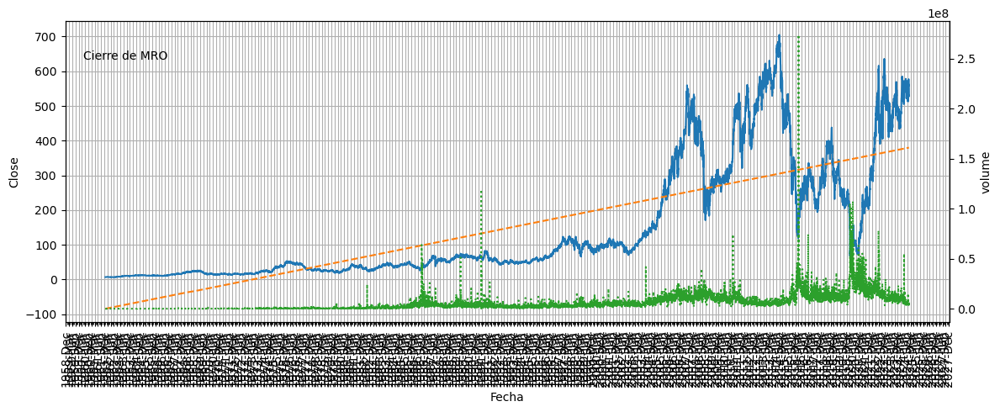

MRO; Cierre anterior: 530.16; Cierre predicho: 530.55; Tend esperada: Alza; Beta: 2.16

Pais:United States; Sector: Energy; Industria: Oil & Gas E&P

Resumen: Marathon Oil Corporation, an independent exploration and production company, engages in exploration, production, and marketing of crude oil and condensate, natural gas liquids, and natural gas in the United States and internationally. The company also produces and markets products manufactured from natural gas, such as liquefied natural gas and methanol. In addition, it owns and operates Sugarloaf gathering system, a natural gas pipeline. The company was formerly known as USX Corporation and changed its name to Marathon Oil Corporation in December 2001. Marathon Oil Corporation was founded in 1887 and is headquartered in Houston, Texas.



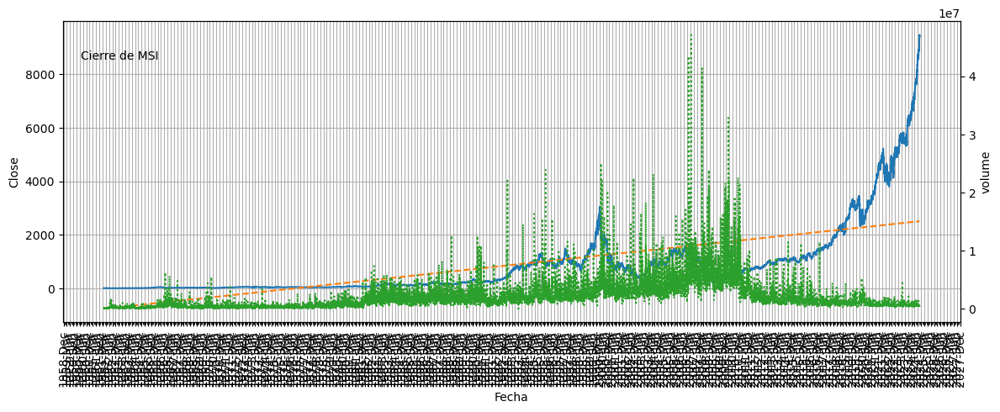

MSI; Cierre anterior: 9428.59; Cierre predicho: 9439.04; Tend esperada: Alza; Beta: 0.98

Pais:United States; Sector: Technology; Industria: Communication Equipment

Resumen: Motorola Solutions, Inc. provides public safety and enterprise security solutions in the United States, the United Kingdom, Canada, and internationally. The company operates in two segments, Products and Systems Integration, and Software and Services. The Products and Systems Integration segment offers a portfolio of infrastructure, devices, accessories, and video security devices and infrastructure, as well as the implementation and integration of systems, devices, software, and applications for government, public safety, and commercial customers who operate private communications networks and video security solutions, as well as manage a mobile workforce. Its land mobile radio communications, and video security and access control devices include two-way portable and vehicle-mounted radios, fixed video cameras, a

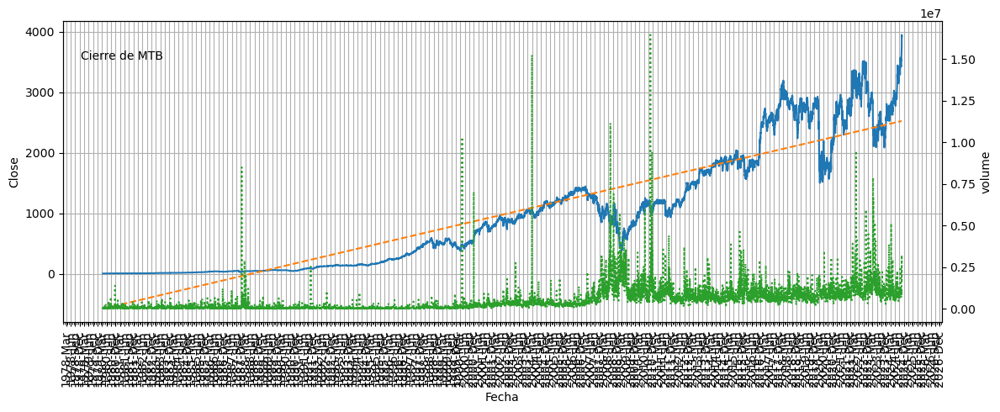

MTB; Cierre anterior: 3919.65; Cierre predicho: 3931.45; Tend esperada: Alza; Beta: 0.74

Pais:United States; Sector: Financial Services; Industria: Banks - Regional

Resumen: M&T Bank Corporation operates as a bank holding company for Manufacturers and Traders Trust Company and Wilmington Trust, National Association that engages in the provision of retail and commercial banking products and services in the United States. The company operates through three segments: Commercial Bank, Retail Bank, and Institutional Services and Wealth Management. It offers a range of credit products and banking services, such as commercial lending and leasing, letters of credits, commercial real estate loans, and credit facilities secured by various commercial real estate to middle-market and large commercial customers. The company also provides customers deposit products, including demand, savings and time accounts, and other services; automobile and recreational finance loans, home equity loans and lin

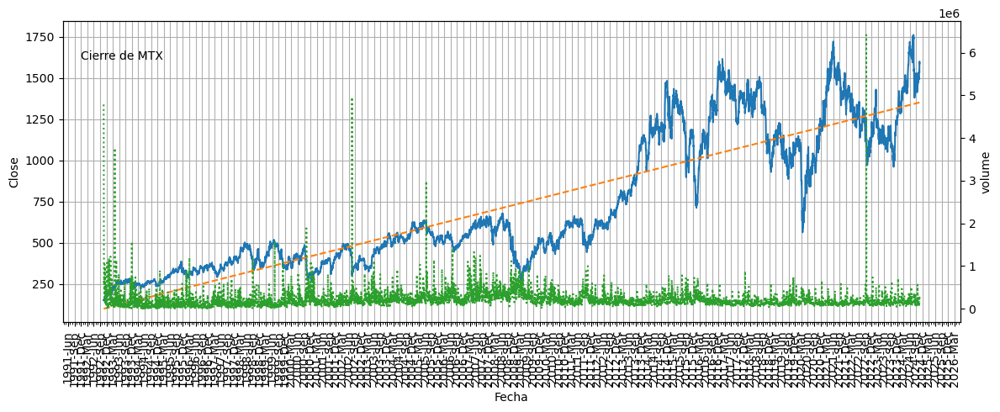

MTX; Cierre anterior: 1588.1; Cierre predicho: 1593.83; Tend esperada: Alza; Beta: 1.3

Pais:United States; Sector: Basic Materials; Industria: Specialty Chemicals

Resumen: Minerals Technologies Inc. develops, produces, and markets various mineral, mineral-based, and related systems and services. The company operates through two segments, Consumer & Specialties, and Engineered Solutions segments. The Consumer & Specialties segment offers household and personal care products, such as pet litter, personal care, fabric care, edible oil and other fluid purification, animal health, and agricultural products; and specialty additives products, including precipitated calcium carbonate and ground calcium carbonate products that are used in the paper, paperboard, and fiber based packaging industries, as well as automotive, construction, and table and food applications. This segment produces limestone and dolomitic limestone used in construction, automotive, and consumer markets for packaging ap

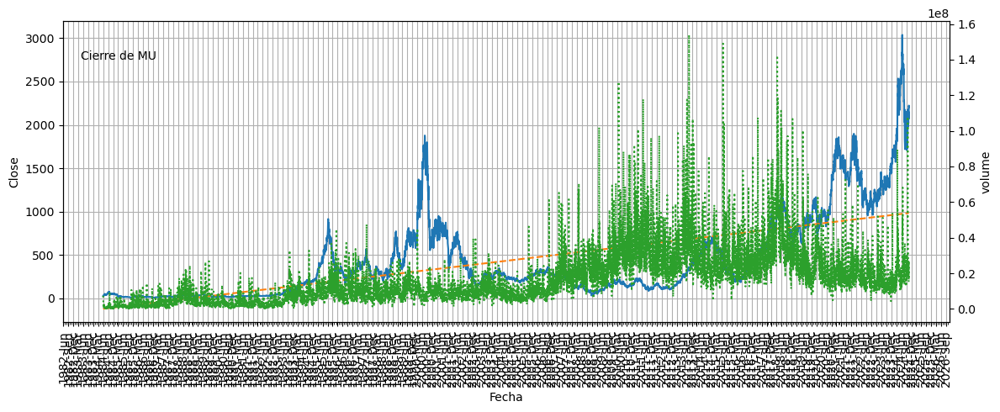

MU; Cierre anterior: 2205.36; Cierre predicho: 2211.79; Tend esperada: Alza; Beta: 1.18

Pais:United States; Sector: Technology; Industria: Semiconductors

Resumen: Micron Technology, Inc. designs, develops, manufactures, and sells memory and storage products in the United States, Taiwan, Mainland China, rest of the Asia Pacific, Hong Kong, Japan, Europe, and internationally. The company operates through four segments: Compute and Networking Business Unit, Mobile Business Unit, Embedded Business Unit, and Storage Business Unit. It provides memory and storage technologies comprising dynamic random access memory semiconductor devices with low latency that provide high-speed data retrieval; non-volatile and re-writeable semiconductor storage devices; and non-volatile re-writable semiconductor memory devices that provide fast read speeds under the Micron and Crucial brands, as well as through private labels. The company offers serves the data center, PC, graphics, networking, automotive, i

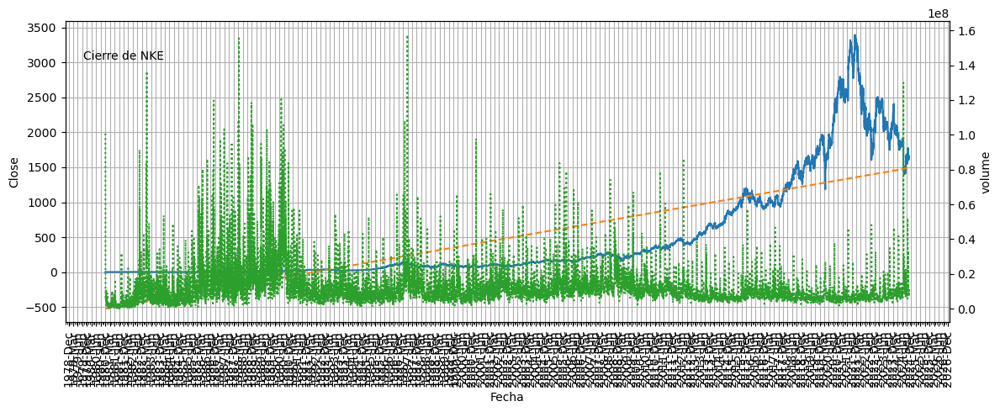

NKE; Cierre anterior: 1645.24; Cierre predicho: 1646.94; Tend esperada: Alza; Beta: 1.02

Pais:United States; Sector: Consumer Cyclical; Industria: Footwear & Accessories

Resumen: NIKE, Inc., together with its subsidiaries, engages in the design, development, marketing, and sale of athletic footwear, apparel, equipment, accessories, and services worldwide. The company provides athletic and casual footwear, apparel, and accessories under the NIKE, Jumpman, Converse, Chuck Taylor, All Star, One Star, Star Chevron, and Jack Purcell trademarks. It also sells a line of performance equipment and accessories comprising bags, sport balls, socks, eyewear, timepieces, digital devices, bats, gloves, protective equipment, and other equipment for sports activities under the NIKE brand; and various plastic products to other manufacturers. In addition, the company markets apparel with licensed college and professional team, and league logos, as well as sells sports apparel; licenses unaffiliated par

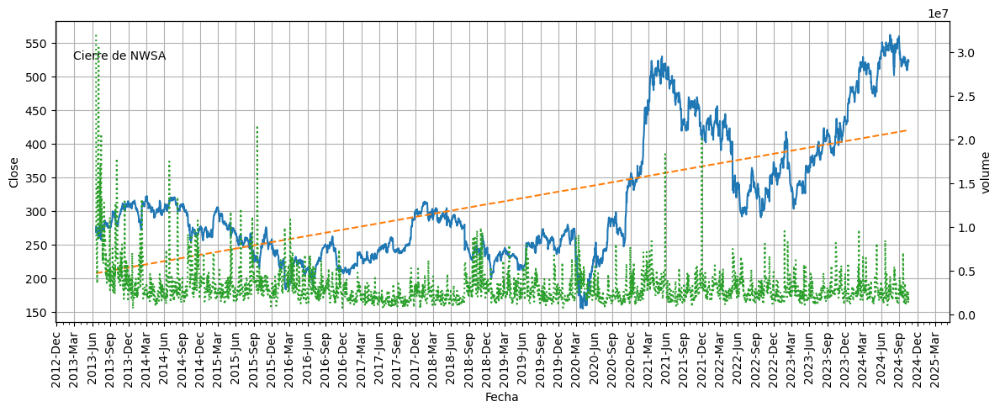

NWSA; Cierre anterior: 522.42; Cierre predicho: 522.53; Tend esperada: Alza; Beta: 1.35

Pais:United States; Sector: Communication Services; Industria: Entertainment

Resumen: News Corporation, a media and information services company, creates and distributes authoritative and engaging content, and other products and services for consumers and businesses worldwide. It operates through six segments: Digital Real Estate Services, Subscription Video Services, Dow Jones, Book Publishing, News Media, and Other. The company distributes content and data products, including The Wall Street Journal, Barron's, MarketWatch, Investor's Business Daily, Factiva, Dow Jones Risk & Compliance, Dow Jones Newswires, and Dow Jones Energy through various media channels, such as newspapers, newswires, websites, mobile apps, newsletters, magazines, proprietary databases, live journalism, video, and podcasts. It also owns and operates Monday to Friday, Saturday and Sunday, weekly, and bi-weekly newspapers com

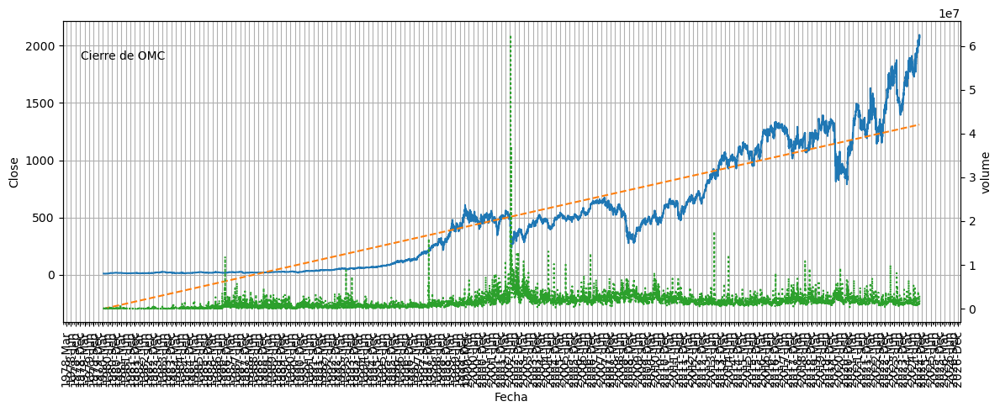

OMC; Cierre anterior: 2073.02; Cierre predicho: 2074.94; Tend esperada: Alza; Beta: 0.96

Pais:United States; Sector: Communication Services; Industria: Advertising Agencies

Resumen: Omnicom Group Inc., together with its subsidiaries, offers advertising, marketing, and corporate communications services. It provides a range of services in the areas of advertising and media, precision marketing, commerce and branding, experiential, execution and support, public relations, and healthcare. The company's services include advertising, branding, content marketing, corporate social responsibility consulting, crisis communications, custom publishing, data analytics, database management, digital/direct marketing and post-production, digital transformation consulting, entertainment marketing, experiential marketing, field marketing, sales support, financial/corporate business-to-business advertising, graphic arts/digital imaging, healthcare marketing and communications, and instore design servic

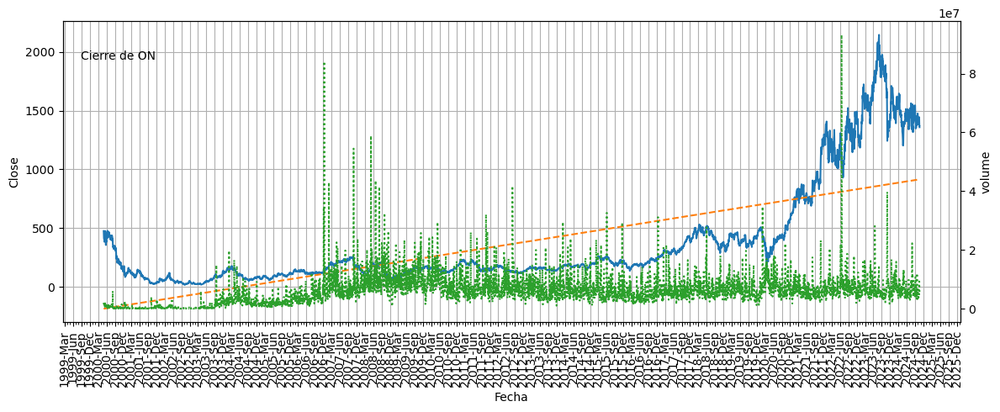

ON; Cierre anterior: 1358.93; Cierre predicho: 1365.45; Tend esperada: Alza; Beta: 1.65

Pais:United States; Sector: Technology; Industria: Semiconductors

Resumen: ON Semiconductor Corporation provides intelligent sensing and power solutions in the United States and internationally. The company operates through Power Solutions Group, Advanced Solutions Group, and Intelligent Sensing Group. Its intelligent power technologies enable the electrification of the automotive industry that allows for lighter and longer-range electric vehicles, empowers fast-charging systems, and propels sustainable energy for the solar strings, industrial power, and storage systems. In addition, the company offers analog, discrete, module, and integrated semiconductor products that perform multiple application functions, includes power switching and conversion, signal conditioning, circuit protection, signal amplification, and voltage regulation functions. Further, it designs and develops analog, mixed-signal

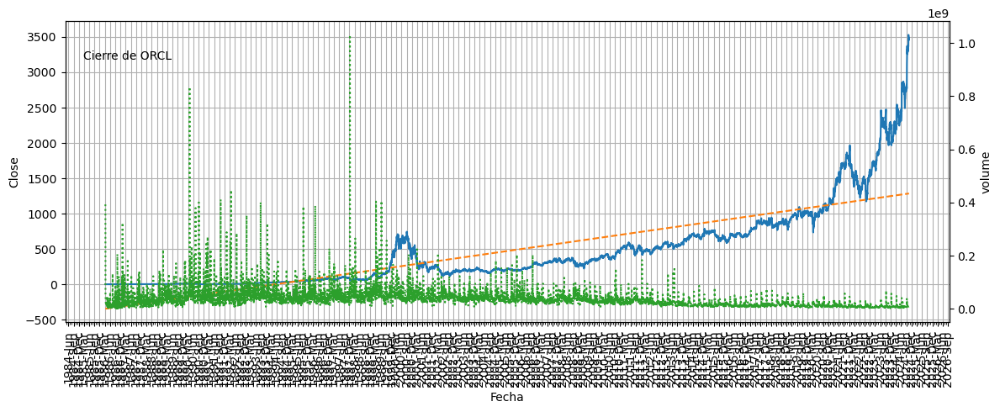

ORCL; Cierre anterior: 3466.08; Cierre predicho: 3475.3; Tend esperada: Alza; Beta: 1.01

Pais:United States; Sector: Technology; Industria: Software - Infrastructure

Resumen: Oracle Corporation offers products and services that address enterprise information technology environments worldwide. Its Oracle cloud software as a service offering include various cloud software applications, including Oracle Fusion cloud enterprise resource planning (ERP), Oracle Fusion cloud enterprise performance management, Oracle Fusion cloud supply chain and manufacturing management, Oracle Fusion cloud human capital management, Oracle Cerner healthcare, and NetSuite applications suite, as well as Oracle Fusion Sales, Service, and Marketing. The company also offers cloud-based industry solutions for various industries; Oracle application licenses; and Oracle license support services. In addition, it provides cloud and license business' infrastructure technologies, such as the Oracle Database and MySQL D

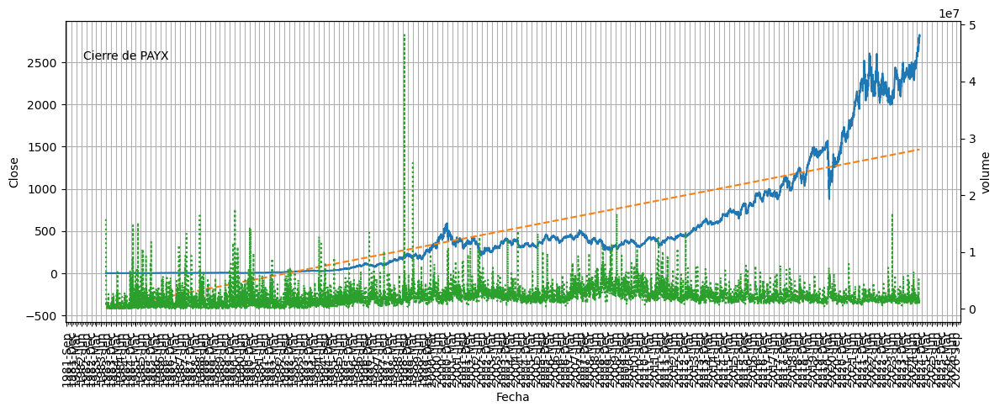

PAYX; Cierre anterior: 2808.14; Cierre predicho: 2810.54; Tend esperada: Alza; Beta: 0.99

Pais:United States; Sector: Technology; Industria: Software - Application

Resumen: Paychex, Inc., together with its subsidiaries, provides integrated human capital management solutions (HCM) for payroll, benefits, human resources (HR), and insurance services for small to medium-sized businesses in the United States, Europe, and India. It offers payroll processing services; payroll tax administration services; employee payment services; and regulatory compliance services, such as new-hire reporting and garnishment processing. The company also provides HR solutions, including integrated HCM technology solutions and HR advisory services through both virtual and on-site availability of a professionally trained HR representative, as well as HR support to non-payroll clients through its HR Partner Plus solution; and retirement services administration, such as plan implementation, ongoing compliance wi

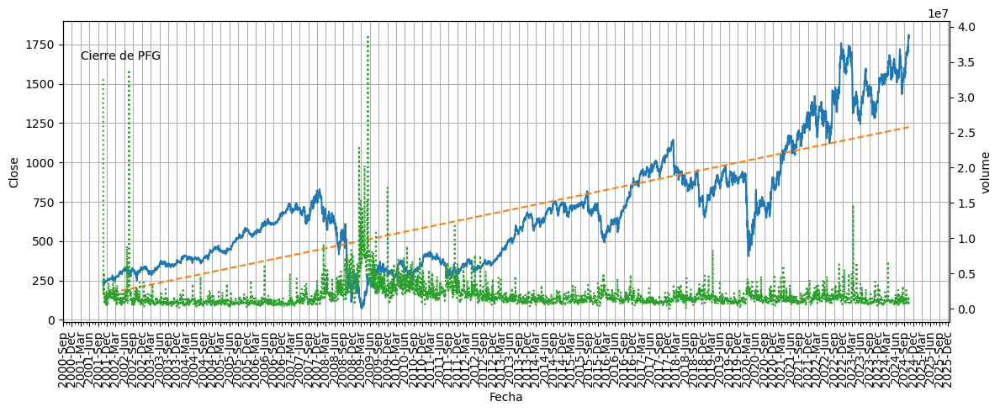

PFG; Cierre anterior: 1794.84; Cierre predicho: 1798.41; Tend esperada: Alza; Beta: 1.19

Pais:United States; Sector: Financial Services; Industria: Asset Management

Resumen: Principal Financial Group, Inc. provides retirement, asset management, and insurance products and services to businesses, individuals, and institutional clients worldwide. The company operates through Retirement and Income Solutions, Principal Asset Management, and Benefits and Protection segments. The Retirement and Income Solutions segment provides retirement, and related financial products and services. It offers products and services for defined contribution plans, including 401(k) and 403(b) plans, defined benefit plans, nonqualified executive benefit plans, employee stock ownership plans, equity compensation, and pension risk transfer services; individual retirement accounts; investment only products; and mutual funds, individual variable annuities, registered index-linked annuities, and bank products, as w

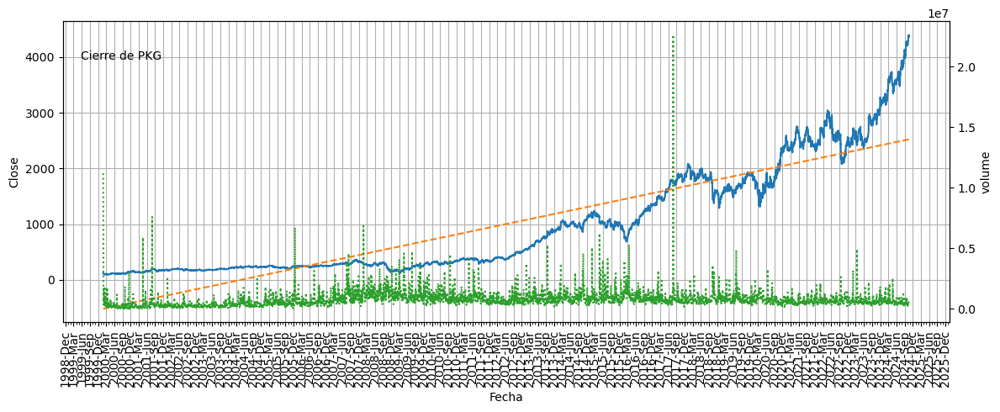

PKG; Cierre anterior: 4367.47; Cierre predicho: 4374.03; Tend esperada: Alza; Beta: 0.79

Pais:United States; Sector: Consumer Cyclical; Industria: Packaging & Containers

Resumen: Packaging Corporation of America manufactures and sells containerboard and corrugated packaging products in the United States. The company operates through three segments: Packaging, Paper, and Corporate and Other. The Packaging segment offers various containerboard and corrugated packaging products, such as conventional shipping containers used to protect and transport manufactured goods; multi-color boxes and displays that help to merchandise the packaged product in retail locations; and honeycomb protective packaging products, as well as packaging for meat, fresh fruit and vegetables, processed food, beverages, and other industrial and consumer products. This segment sells its corrugated products through a direct sales and marketing organization, independent brokers, and distribution partners. The Paper s

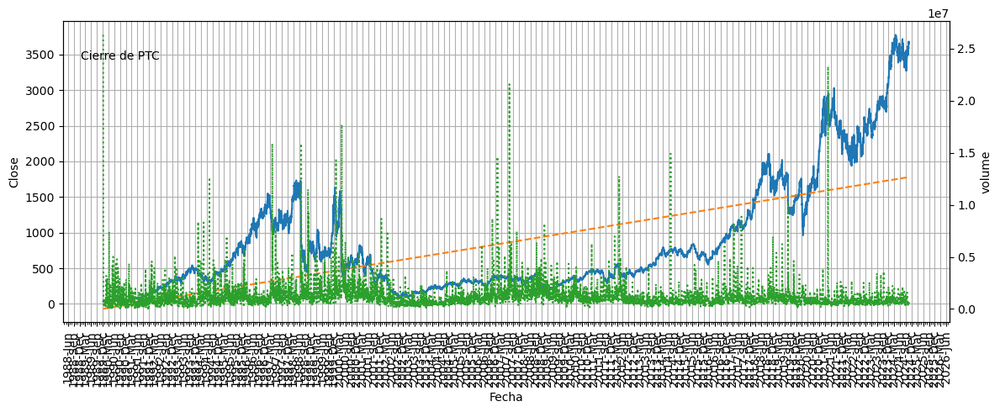

PTC; Cierre anterior: 3658.74; Cierre predicho: 3677.77; Tend esperada: Alza; Beta: 1.18

Pais:United States; Sector: Technology; Industria: Software - Application

Resumen: PTC Inc. operates as software company in the Americas, Europe, and the Asia Pacific. The company provides Windchill, a suite that manages all aspects of the product development lifecycle(PLM) that provides real-time information sharing, dynamic data visualization, collaborate across geographically distributed teams, and enabling manufacturers to elevate product development, manufacturing, and field service processes; ThingWorx, a platform for Industrial Internet of Things; ServiceMax, a field service management solutions enable companies to asset uptime with optimized in-person and remote service and technician productivity with mobile tools. and deliver metrics; and Arena, a SaaS PLM solution enables product teams to collaborate virtually to share product and quality information with internal teams and supply chai

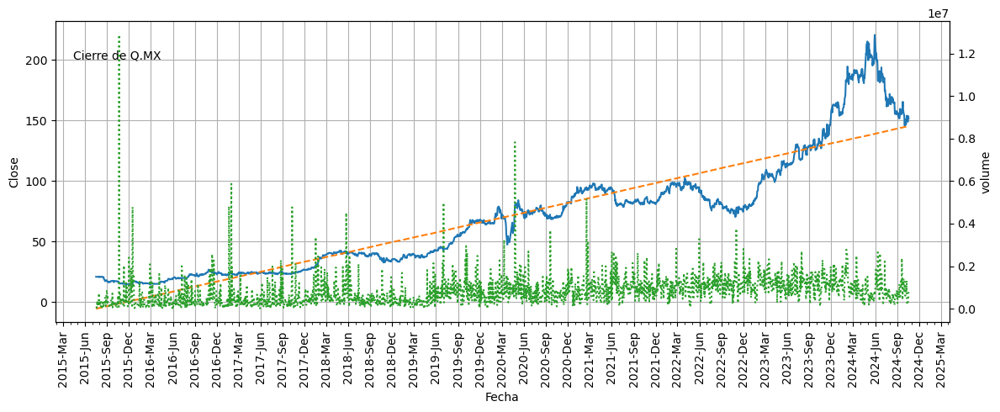

Q.MX; Cierre anterior: 151.79; Cierre predicho: 153.33; Tend esperada: Alza; Beta: 0.78

Pais:Mexico; Sector: Financial Services; Industria: Insurance - Property & Casualty

Resumen: Quálitas Controladora, S.A.B. de C.V., together with its subsidiaries, operates as an auto insurance company in Mexico, El Salvador, Costa Rica, Peru, and the United States. It offers insurance, coinsurance, and reinsurance services for the automobile sector. The company also engages in the acquisition, sale, and installation of automobile glass and spare parts; provision of salvage management and marketing; advisory and training services for investment planning and business management; and property leasing and acquisition. Quálitas Controladora, S.A.B. de C.V. founded in 1993 and is based in Mexico City, Mexico.



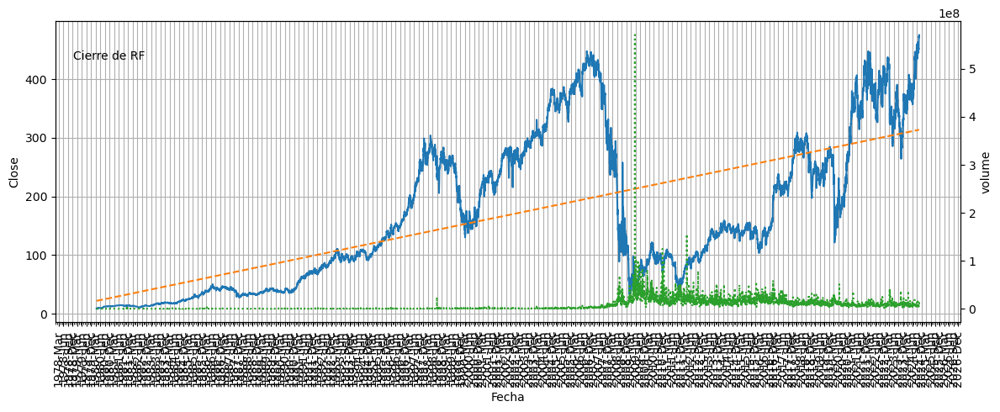

RF; Cierre anterior: 472.62; Cierre predicho: 478.23; Tend esperada: Alza; Beta: 1.19

Pais:United States; Sector: Financial Services; Industria: Banks - Regional

Resumen: Regions Financial Corporation, a financial holding company, provides banking and bank-related services to individual and corporate customers. It operates through three segments: Corporate Bank, Consumer Bank, and Wealth Management. The Corporate Bank segment offers commercial banking services, such as commercial and industrial, commercial real estate, and investor real estate lending; equipment lease financing; deposit products; and securities underwriting and placement, loan syndication and placement, foreign exchange, derivatives, merger and acquisition, and other advisory services. It serves corporate, middle market, and commercial real estate developers and investors. The Consumer Bank segment provides consumer banking products and services related to residential first mortgages, home equity lines and loans, con

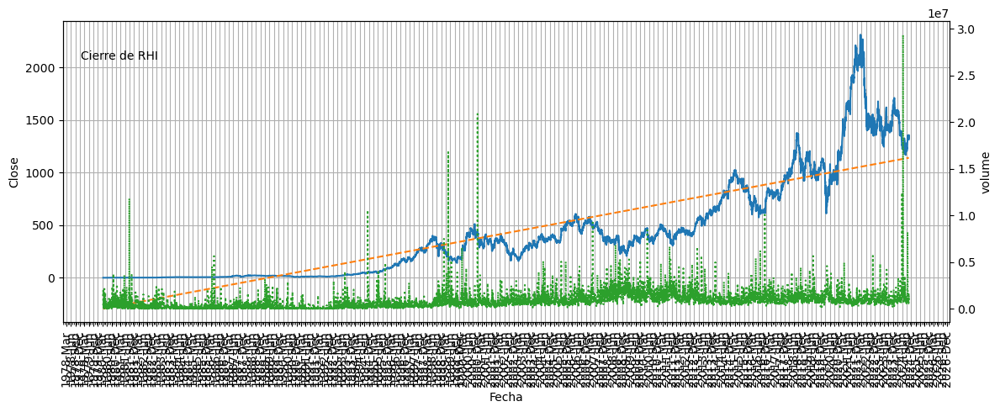

RHI; Cierre anterior: 1315.68; Cierre predicho: 1325.84; Tend esperada: Alza; Beta: 1.23

Pais:United States; Sector: Industrials; Industria: Staffing & Employment Services

Resumen: Robert Half Inc. provides talent solutions and business consulting services in North America, South America, Europe, Asia, and Australia. The company operates through Contract Talent Solutions, Permanent Placement Talent Solutions, and Protiviti segments. The Contract Talent Solutions segment provides contract engagement professionals in the fields of finance and accounting, technology, marketing and creative, legal and administrative, and customer support. This segment markets its services to clients and employment candidates through both national and local advertising activities, including radio, digital advertising, job boards, alliance partners, and events. The Permanent Placement Talent Solutions segment engages in the placement of full-time accounting, finance, and tax and accounting operations perso

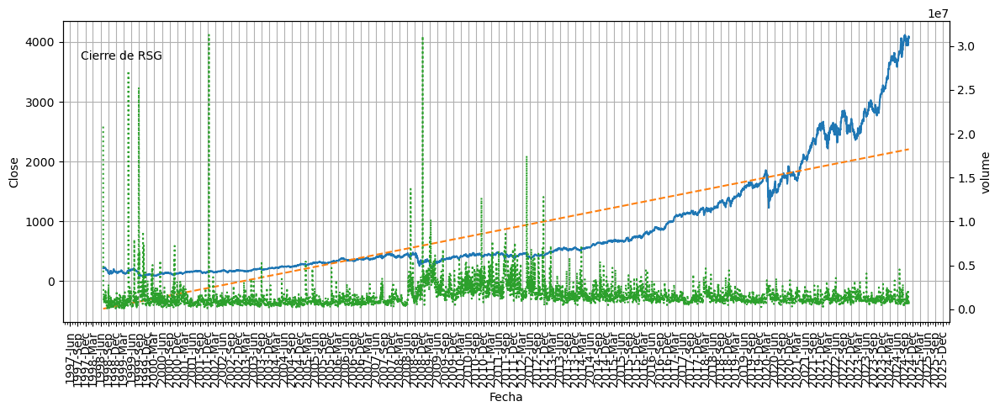

RSG; Cierre anterior: 4063.5; Cierre predicho: 4063.99; Tend esperada: Alza; Beta: 0.7

Pais:United States; Sector: Industrials; Industria: Waste Management

Resumen: Republic Services, Inc., together with its subsidiaries, offers environmental services in the United States and Canada. It is involved in the collection and processing of recyclable, solid waste, and industrial waste materials; transportation and disposal of non-hazardous and hazardous waste streams; and other environmental solutions. Its residential collection services include curbside collection of material for transport to transfer stations, landfills, recycling centers, and organics processing facilities; supply of recycling and waste containers; and renting of compactors. The company also engages in the processing and sale of old corrugated containers, old newsprint, aluminum, glass, and other materials; and provision of landfill services. It serves small-container, large-container, and residential customers. The com

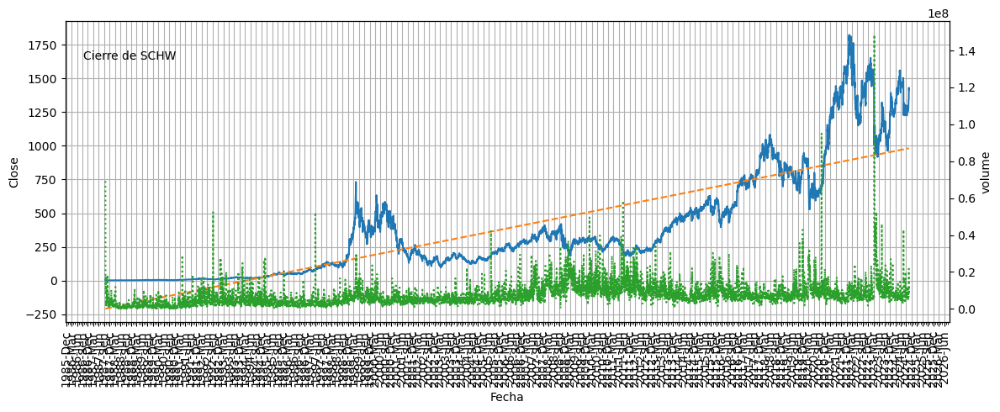

SCHW; Cierre anterior: 1415.88; Cierre predicho: 1419.15; Tend esperada: Alza; Beta: 0.96

Pais:United States; Sector: Financial Services; Industria: Capital Markets

Resumen: The Charles Schwab Corporation, together with its subsidiaries, operates as a savings and loan holding company that provides wealth management, securities brokerage, banking, asset management, custody, and financial advisory services in the United States and internationally. The company operates in two segments, Investor Services and Advisor Services. It offers brokerage accounts with equity and fixed income trading, margin lending, options trading, futures and forex trading, and cash management capabilities, including certificates of deposit; third-party mutual funds through the Mutual Fund Marketplace and Mutual Fund OneSource service, as well as mutual fund trading and clearing services to broker-dealers; exchange-traded funds; advisory solutions for managed portfolios, separately managed accounts, customized 

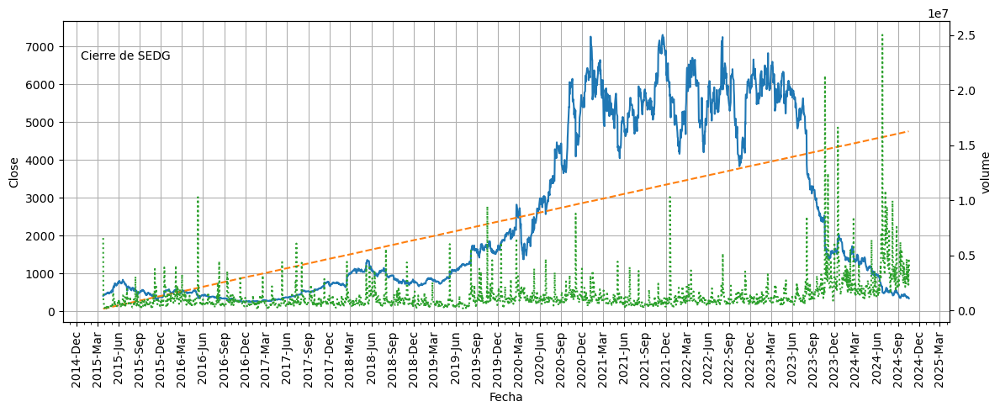

SEDG; Cierre anterior: 343.45; Cierre predicho: 349.59; Tend esperada: Alza; Beta: 1.55

Pais:Israel; Sector: Technology; Industria: Solar

Resumen: SolarEdge Technologies, Inc., together with its subsidiaries, designs, develops, manufactures, and sells direct current (DC) optimized inverter systems for solar photovoltaic (PV) installations in the United States, Germany, the Netherlands, Italy, rest of Europe, and internationally. It operates in two segments, Solar and Energy Storage. The Solar segment offers power optimizers, inverters, batteries, storage solutions, electric vehicle chargers, smart tracking solutions, and smart energy management software products; Monitoring platform, a cloud-based monitoring platform, which collects power, voltage, current, and system data sent from inverters and power optimizers; and MySolarEdge app, that enables system owners to track their real-time system production and household energy consumption. This segment also provides Designer platform, a

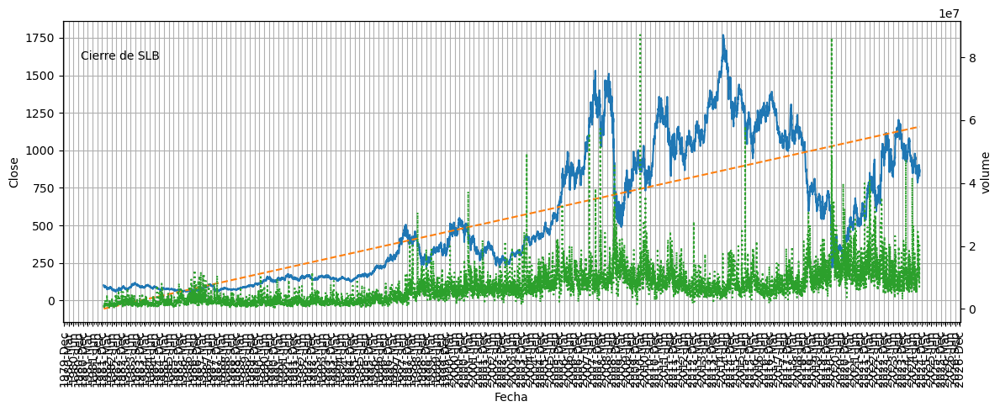

SLB; Cierre anterior: 831.75; Cierre predicho: 842.1; Tend esperada: Alza; Beta: 1.52

Pais:United States; Sector: Energy; Industria: Oil & Gas Equipment & Services

Resumen: Schlumberger Limited engages in the provision of technology for the energy industry worldwide. The company operates through four divisions: Digital & Integration, Reservoir Performance, Well Construction, and Production Systems. The company provides field development and hydrocarbon production, carbon management, and integration of adjacent energy systems; reservoir interpretation and data processing services for exploration data; and well construction and production improvement services and products. It also offers subsurface geology and fluids evaluation information; open and cased hole services; exploration and production pressure, and flow-rate measurement services; and pressure pumping, well stimulation, and coiled tubing equipment solutions. In addition, the company offers mud logging, directional drilling, 

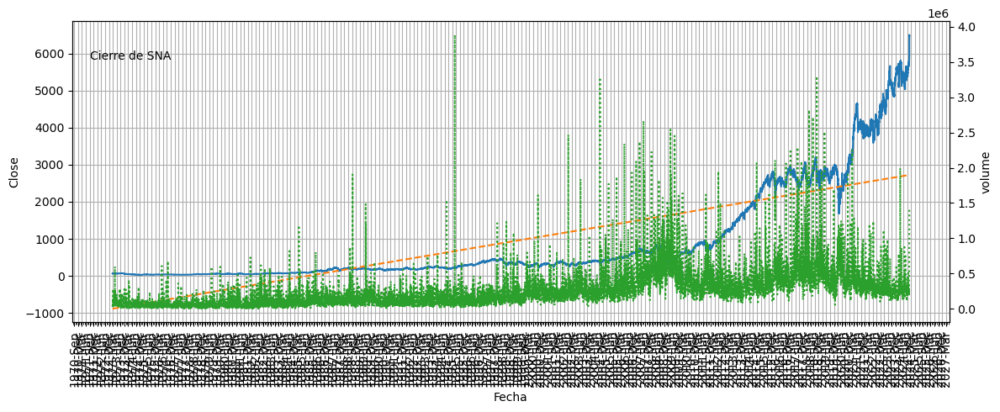

SNA; Cierre anterior: 6470.05; Cierre predicho: 6472.25; Tend esperada: Alza; Beta: 0.97

Pais:United States; Sector: Industrials; Industria: Tools & Accessories

Resumen: Snap-on Incorporated manufactures and markets tools, equipment, diagnostics, and repair information and systems solutions for professional users worldwide. It operates through Commercial & Industrial Group, Snap-on Tools Group, Repair Systems & Information Group, and Financial Services segments. The company provides hand tools, including wrenches, sockets, ratchet wrenches, pliers, screwdrivers, punches and chisels, saws and cutting tools, pruning tools, torque measuring instruments, and other related products; power tools, such as cordless, pneumatic, and hydraulic and corded tools; and tool storage products comprising tool chests, roll cabinets, and other products. It provides handheld and computer-based diagnostic products, service and repair information products, diagnostic software solutions, electronic parts ca

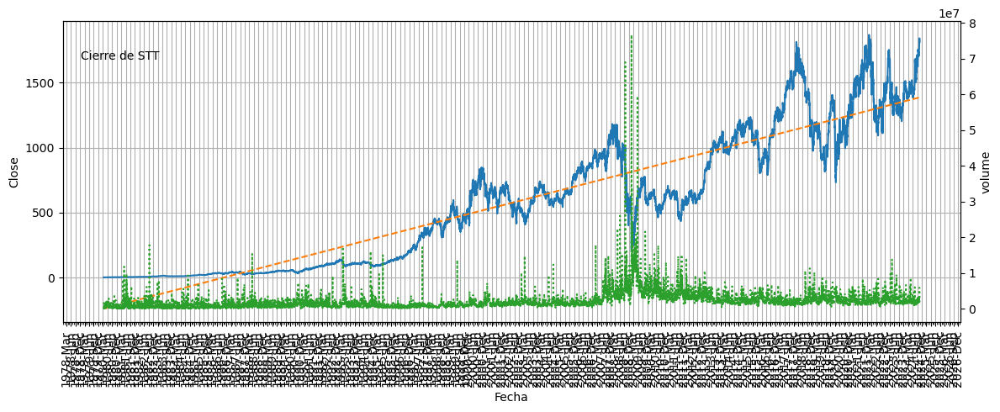

STT; Cierre anterior: 1814.09; Cierre predicho: 1821.73; Tend esperada: Alza; Beta: 1.5

Pais:United States; Sector: Financial Services; Industria: Asset Management

Resumen: State Street Corporation, through its subsidiaries, provides a range of financial products and services to institutional investors worldwide. The company offers investment servicing products and services, including custody, accounting, regulatory reporting, investor, and performance and analytics; middle office products, such as IBOR, transaction management, loans, cash, derivatives and collateral, record keeping, and client reporting and investment analytics; finance leasing; foreign exchange, and brokerage and other trading services; securities finance and enhanced custody products; deposit and short-term investment facilities; investment manager and alternative investment manager operations outsourcing; performance, risk, and compliance analytics; and financial data management to support institutional investors

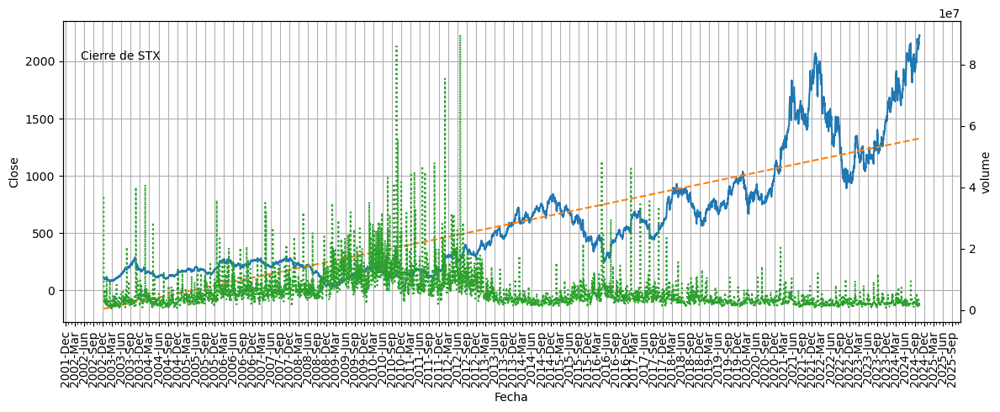

STX; Cierre anterior: 2224.61; Cierre predicho: 2251.84; Tend esperada: Alza; Beta: 1.06

Pais:Singapore; Sector: Technology; Industria: Computer Hardware

Resumen: Seagate Technology Holdings plc engages in the provision of data storage technology and infrastructure solutions in Singapore, the United States, the Netherlands, and internationally. The company offers mass capacity storage products, including enterprise nearline hard disk drives (HDDs), enterprise nearline solid state drives (SSDs), enterprise nearline systems, video and image HDDs, and network-attached storage drives. It also offers legacy applications comprising Mission Critical HDDs and SSDs; external storage solutions under the Seagate Ultra Touch, One Touch, Expansion, and Basics product lines, as well as under the LaCie brand name; desktop drives for personal computers and workstation applications; notebook drives traditional notebooks, convertible systems, and external storage applications, DVR HDDs for video strea

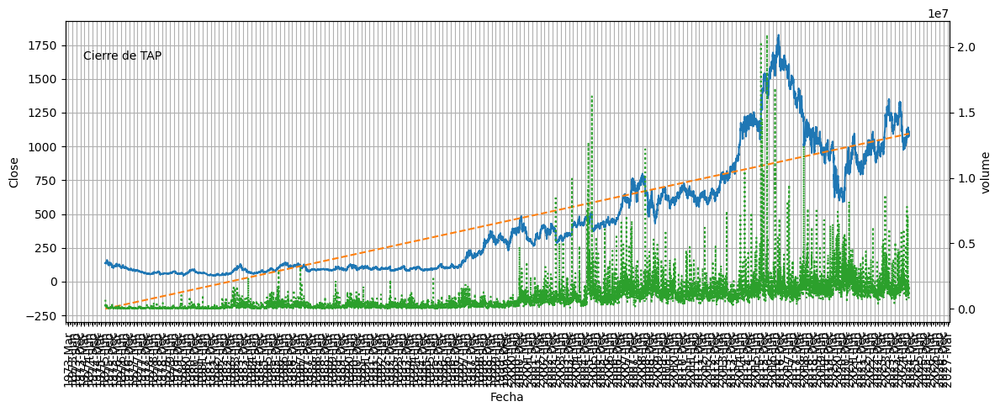

TAP; Cierre anterior: 1111.11; Cierre predicho: 1113.32; Tend esperada: Alza; Beta: 0.82

Pais:United States; Sector: Consumer Defensive; Industria: Beverages - Brewers

Resumen: Molson Coors Beverage Company manufactures, markets, and sells beer and other malt beverage products under various brands in the Americas, Europe, the Middle East, Africa, and the Asia Pacific. The company offers flavored malt beverages including hard seltzers, craft, spirits and energy, and ready to drink beverages. It provides its products under Aspall Cider, Blue Moon, Coors Original, Five Trail, Hop Valley brands, Leinenkugel's, Madri, Miller Genuine Draft, Molson Ultra, Sharp's, Staropramen, and Vizzy Hard Seltzer above premier brands; Bergenbier, Borsodi, Carling, Coors Banquet, Coors Light, Jelen, Kamenitza, Miller Lite, Molson Canadian, and Niksicko, Ozujsko under the premium brands; and Branik, Icehouse, Keystone, Miller High Life, Milwaukee's Best, and Steel Reserve under the economy brands. The comp

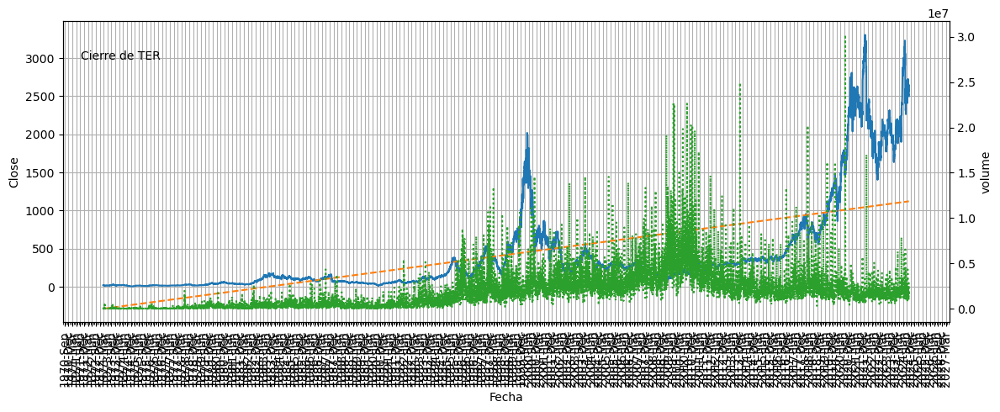

TER; Cierre anterior: 2500.8; Cierre predicho: 2515.17; Tend esperada: Alza; Beta: 1.49

Pais:United States; Sector: Technology; Industria: Semiconductor Equipment & Materials

Resumen: Teradyne, Inc. designs, develops, manufactures, and sells automated test systems and robotics products worldwide. It operates through four segments; Semiconductor Test, System Test, Robotics, and Wireless Test. The Semiconductor Test segment offers products and services for wafer level and device package testing of semiconductor devices in automotive, industrial, communications, consumer, smartphones, cloud, computer and electronic game, and other applications. This segment also provides FLEX test platform systems; J750 test system to address the volume semiconductor devices, including microcontrollers; Magnum platform that tests memory devices, such as flash memory and DRAM; and ETS platform for semiconductor manufacturers, and assembly and test subcontractors in the analog/mixed signal markets. It ser

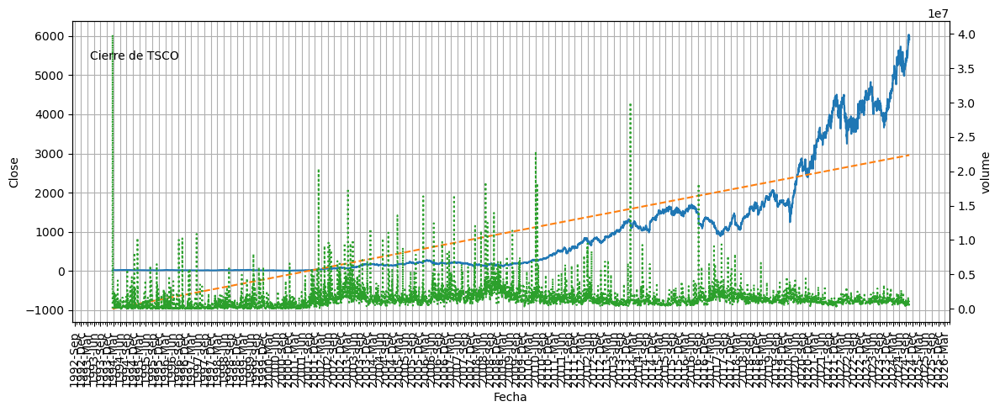

TSCO; Cierre anterior: 5905.17; Cierre predicho: 5919.14; Tend esperada: Alza; Beta: 0.8

Pais:United States; Sector: Consumer Cyclical; Industria: Specialty Retail

Resumen: Tractor Supply Company operates as a rural lifestyle retailer in the United States. The company offers various merchandise, including livestock and equine feed and equipment, poultry, fencing, and sprayers and chemicals; food, treats, and equipment for dogs, cats, and other small animals, as well as dog wellness products; seasonal and recreation products comprising tractors and riders, lawn and garden, bird feeding, power equipment, and other recreational products; truck, tool, and hardware products, such as truck accessories, trailers, generators, lubricants, batteries, and hardware and tools; and clothing, gift, and décor products consist of clothing, footwear, toys, snacks, and decorative merchandise. It provides its products under the 4health, Paws & Claws, American Farmworks, Producer's Pride, Bit & Bridle, R

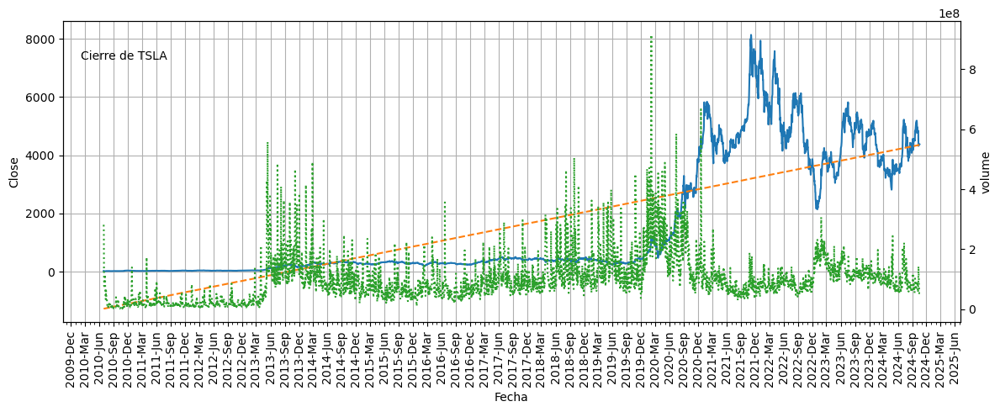

TSLA; Cierre anterior: 4378.97; Cierre predicho: 4382.24; Tend esperada: Alza; Beta: 2.3

Pais:United States; Sector: Consumer Cyclical; Industria: Auto Manufacturers

Resumen: Tesla, Inc. designs, develops, manufactures, leases, and sells electric vehicles, and energy generation and storage systems in the United States, China, and internationally. The company operates in two segments, Automotive, and Energy Generation and Storage. The Automotive segment offers electric vehicles, as well as sells automotive regulatory credits; and non-warranty after-sales vehicle, used vehicles, body shop and parts, supercharging, retail merchandise, and vehicle insurance services. This segment also provides sedans and sport utility vehicles through direct and used vehicle sales, a network of Tesla Superchargers, and in-app upgrades; purchase financing and leasing services; services for electric vehicles through its company-owned service locations and Tesla mobile service technicians; and vehicle limit

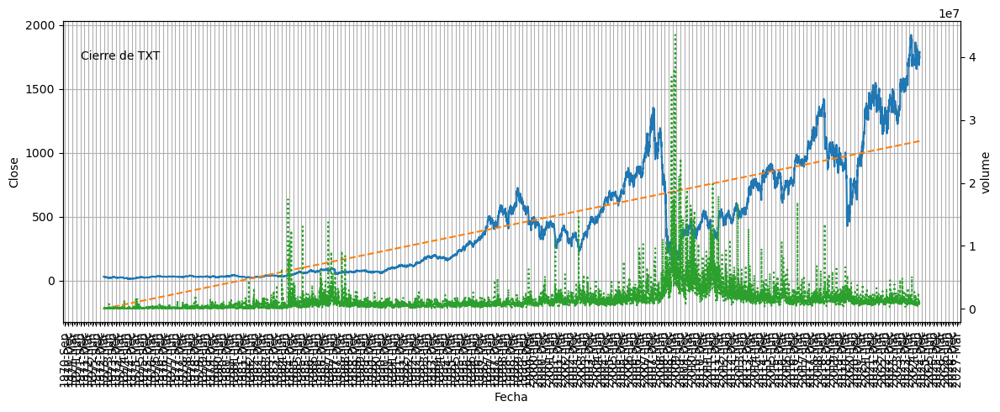

TXT; Cierre anterior: 1786.71; Cierre predicho: 1789.25; Tend esperada: Alza; Beta: 1.23

Pais:United States; Sector: Industrials; Industria: Aerospace & Defense

Resumen: Textron Inc. operates in the aircraft, defense, industrial, and finance businesses worldwide. It operates through six segments: Textron Aviation, Bell, Textron Systems, Industrial, Textron eAviation, and Finance. The Textron Aviation segment manufactures, sells, and services business jets, turboprop and piston engine aircraft, and military trainer and defense aircraft; and offers maintenance, inspection, and repair services, as well as sells commercial parts. The Bell segment supplies military and commercial helicopters, tiltrotor aircrafts, and related spare parts and services. The Textron Systems segment offers unmanned aircraft systems, electronic systems and solutions, advanced marine crafts, piston aircraft engines, live military air-to-air and air-to-ship training, weapons and related components, and armored an

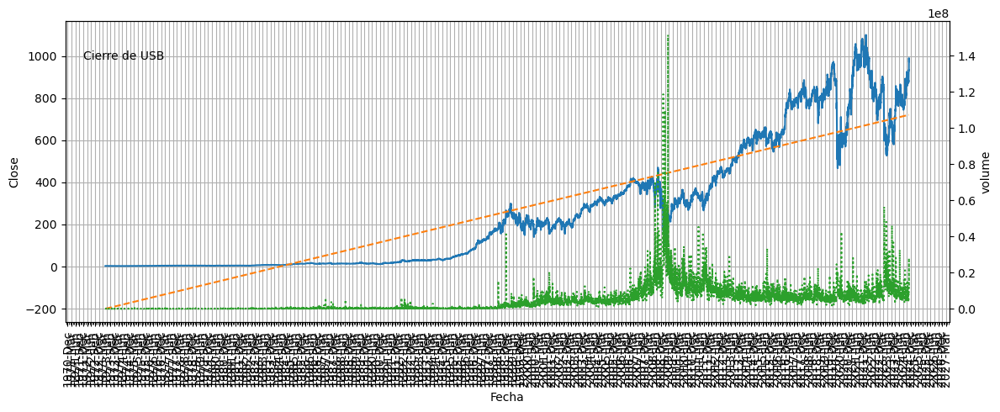

USB; Cierre anterior: 975.4; Cierre predicho: 976.72; Tend esperada: Alza; Beta: 1.05

Pais:United States; Sector: Financial Services; Industria: Banks - Regional

Resumen: U.S. Bancorp, a financial services holding company, provides various financial services to individuals, businesses, institutional organizations, governmental entities, and other financial institutions in the United States. It operates through Wealth, Corporate, Commercial and Institutional Banking; Consumer and Business Banking; Payment Services; and Treasury and Corporate Support segments. The company offers depository services, including checking accounts, savings accounts, and time certificate contracts; and lending services, such as traditional credit products and credit card services, lease financing and import/export trade, asset-backed lending, agricultural finance, and other products. It also provides ancillary services comprising capital markets, treasury management, and receivable lock-box collection servi

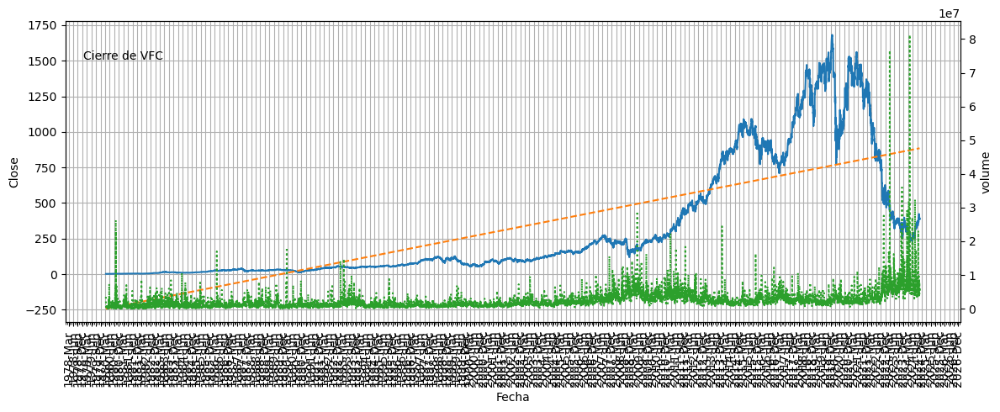

VFC; Cierre anterior: 388.89; Cierre predicho: 390.85; Tend esperada: Alza; Beta: 1.55

Pais:United States; Sector: Consumer Cyclical; Industria: Apparel Manufacturing

Resumen: V.F. Corporation, together with its subsidiaries, engages in the design, procurement, marketing, and distribution of branded lifestyle apparel, footwear, and accessories for men, women, and children in the Americas, Europe, and the Asia-Pacific. It operates through three segments: Outdoor, Active, and Work. The company offers High performance outdoor apparel, footwear, equipment, accessories; outdoor, adventure-inspired lifestyle footwear, apparel, and accessories; performance merino wool and other natural fibers-based apparel and accessories; performance-based footwear; and high performance apparel and accessories based on natural fibers under the The North Face, Timberland, Smartwool, Icebreaker, and Altra brands. It also offers youth culture/action sports-inspired and streetwear apparel, footwear, and access

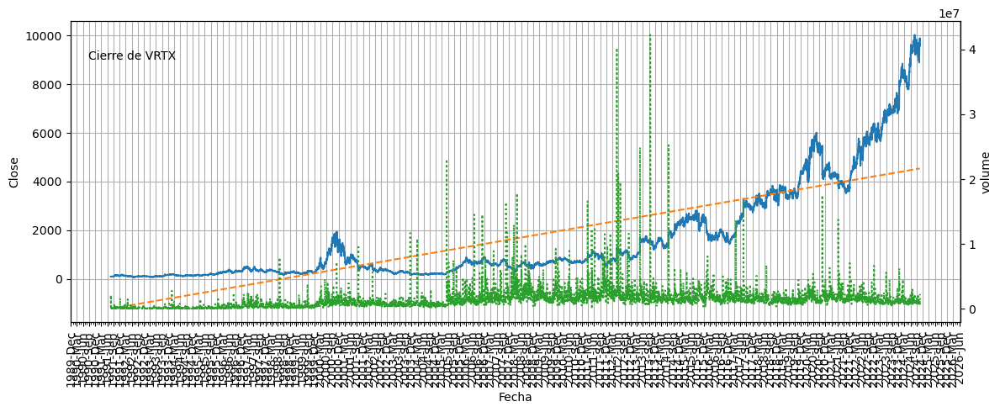

VRTX; Cierre anterior: 9583.35; Cierre predicho: 9629.07; Tend esperada: Alza; Beta: 0.4

Pais:United States; Sector: Healthcare; Industria: Biotechnology

Resumen: Vertex Pharmaceuticals Incorporated, a biotechnology company, engages in developing and commercializing therapies for treating cystic fibrosis (CF). It markets TRIKAFTA/KAFTRIO for people with CF with at least one F508del mutation for 2 years of age or older; SYMDEKO/SYMKEVI for people with CF for 6 years of age or older;  ORKAMBI for CF patients 1 year or older; and KALYDECO for the treatment of patients with 1 year or older who have CF with ivacaftor. The company's pipeline includes VX-522, a CFTR mRNA therapeutic designed to treat the underlying cause of CF, which is in Phase 1 clinical trial; VX-548, a non-opioid medicine for the treatment of acute and neuropathic pain which is in Phase 3 clinical trial; Exa-cel, for the treatment of sickle cell disease and transfusion-dependent beta thalassemia which is in Phase 2/3 cl

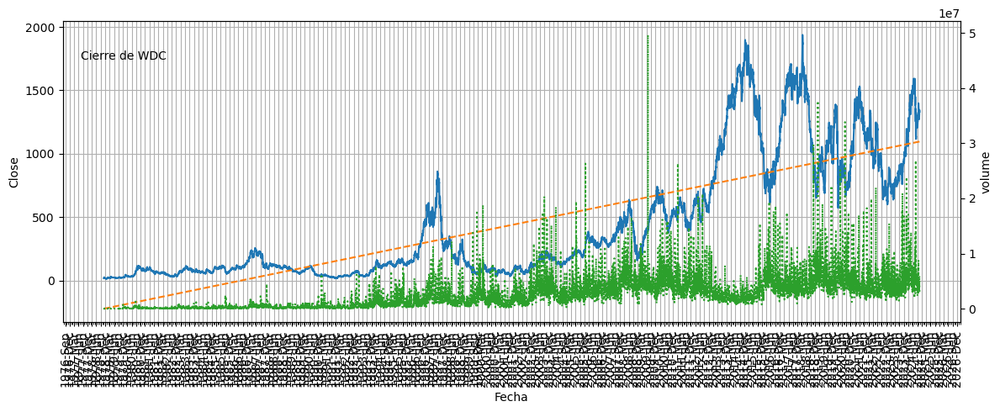

WDC; Cierre anterior: 1329.96; Cierre predicho: 1337.72; Tend esperada: Alza; Beta: 1.38

Pais:United States; Sector: Technology; Industria: Computer Hardware

Resumen: Western Digital Corporation develops, manufactures, and sells data storage devices and solutions in the United States, China, Hong Kong, Europe, the Middle East, Africa, rest of Asia, and internationally. It offers client devices, including hard disk drives (HDDs) and solid state drives (SSDs) for desktop and notebook personal computers (PCs), gaming consoles, and set top boxes; and flash-based embedded storage products for mobile phones, tablets, notebook PCs, and other portable and wearable devices, as well as automotive, Internet of Things, industrial, and connected home applications. The company also provides enterprise HDDs; enterprise SSDs consisting of flash-based SSDs and software solutions for use in enterprise servers, online transactions, artificial intelligence-related workloads, data analysis, and other ent

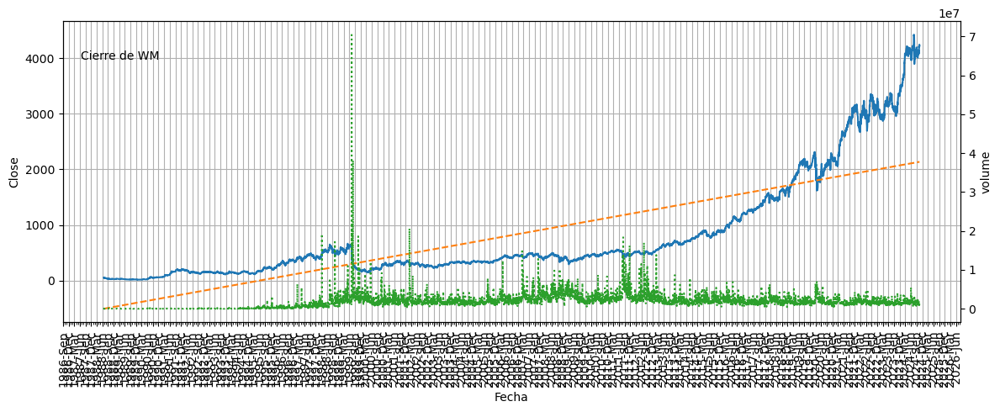

WM; Cierre anterior: 4221.24; Cierre predicho: 4223.09; Tend esperada: Alza; Beta: 0.75

Pais:United States; Sector: Industrials; Industria: Waste Management

Resumen: Waste Management, Inc., through its subsidiaries, engages in the provision of environmental solutions to residential, commercial, industrial, and municipal customers in the United States and Canada. It offers collection services, including picking up and transporting waste and recyclable materials from where it was generated to a transfer station, material recovery facility (MRF), or disposal site; and owns and operates transfer stations, as well as owns, develops, and operates landfill facilities that produce landfill gas used as renewable natural gas for generating electricity. As of December 31, 2022, the company owned or operated 254 solid waste landfills, five secure hazardous waste landfills, 97 MRFs, and 337 transfer stations. It also provides materials processing and commodities recycling services at its MRFs, wh

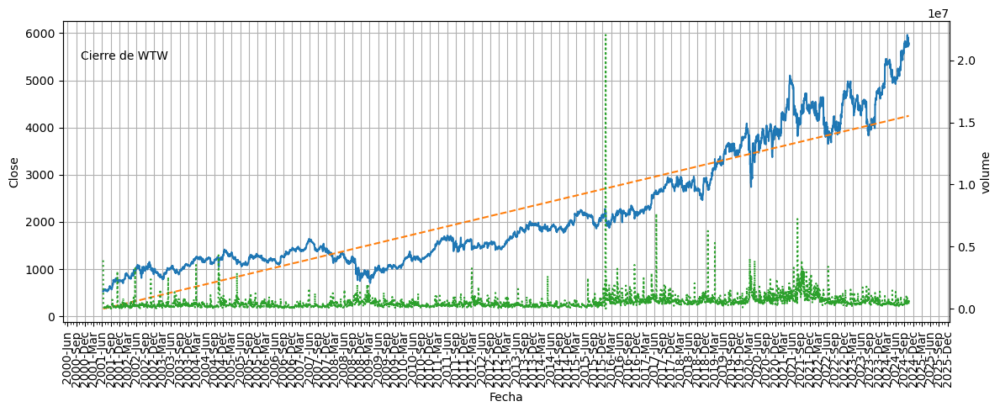

WTW; Cierre anterior: 5754.57; Cierre predicho: 5761.7; Tend esperada: Alza; Beta: 0.74

Pais:United Kingdom; Sector: Financial Services; Industria: Insurance Brokers

Resumen: Willis Towers Watson Public Limited Company operates as an advisory, broking, and solutions company worldwide. It operates through two segments: Health, Wealth & Career and Risk & Broking. The company offers strategy and design consulting, plan management service and support, broking and administration services for health, wellbeing, and other group benefit program, including medical, dental, disability, life, voluntary benefits and other coverages; actuarial support, plan design, and administrative services for pension and retirement savings plans; retirement consulting services and solutions; and integrated solutions that consists of investment discretionary management, pension administration, core actuarial, and communication and change management assistance services. It also provides advice, data, software, 

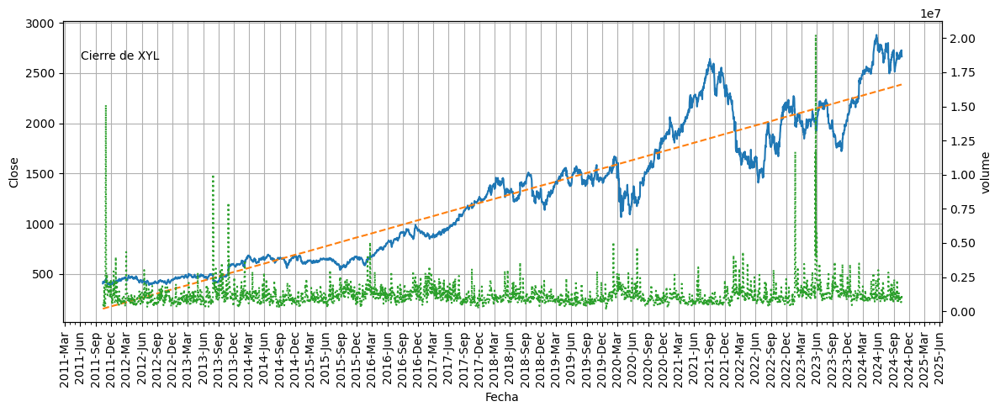

XYL; Cierre anterior: 2665.08; Cierre predicho: 2669.26; Tend esperada: Alza; Beta: 1.03

Pais:United States; Sector: Industrials; Industria: Specialty Industrial Machinery

Resumen: Xylem Inc., together with its subsidiaries, engages in the design, manufacture, and servicing of engineered products and solutions worldwide. It operates through four segments: Water Infrastructure, Applied Water, Measurement & Control Solutions, and Integrated Solutions and Services. The Water Infrastructure segment offers products, including water, storm water, and wastewater pumps; controls and systems; filtration, disinfection, and biological treatment equipment; and mobile dewatering equipment and rental services under the ADI, Flygt, Godwin, Sanitaire, Magneto, Neptune Benson, Ionpure, Leopold, Wedeco, and Xylem Vue brands. The Applied Water segment provides pumps, valves, heat exchangers, controls, and dispensing equipment systems under the Goulds Water Technology, Bell & Gossett, A-C Fire Pump, Sta

In [19]:
sp500()
datos_yahoo()